In [ ]:
"""
Deep learning algorithm for face detection
"""

In [3]:
import time
import numpy as np
import h5py
import matplotlib.pyplot as plt
import scipy
from PIL import Image
from scipy import ndimage
import os
from PIL import Image
import copy


In [33]:
def load_data(data_dir="dataset", img_size=(64, 64)):
    sets = ["train", "test"]
    classes = ["no_face", "face"]

    data = {}

    for s in sets:
        X = []
        y = []

        for label, cls in enumerate(classes):
            class_dir = os.path.join(data_dir, s, cls)

            for file in os.listdir(class_dir):
                img_path = os.path.join(class_dir, file)

                try:
                    img = Image.open(img_path).convert("RGB")
                    img = img.resize(img_size)
                    X.append(np.array(img))
                    y.append(label)
                except:
                    continue  # skip corrupted images

        data[s] = (np.array(X), np.array(y))

    train_x_orig, train_y_orig = data["train"]
    test_x_orig, test_y_orig = data["test"]
    
    # Flatten images
    train_x = train_x_orig.reshape(train_x_orig.shape[0], -1).T
    test_x  = test_x_orig.reshape(test_x_orig.shape[0], -1).T
    
    # Normalize
    train_x = train_x.astype(np.float32) / 255.0
    test_x  = test_x.astype(np.float32) / 255.0
    
    # Labels: reshape ONLY to (1, m)
    train_y = train_y_orig.reshape(1, -1)
    test_y  = test_y_orig.reshape(1, -1)
    
    return train_x, train_y, test_x, test_y, np.array(classes)
    

In [37]:
train_x, train_y, test_x, test_y, classes = load_data()

y = 0 → no_face


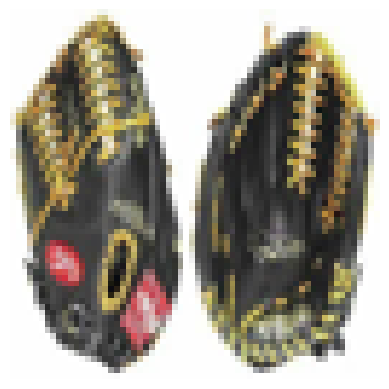

In [43]:
#Testing the load_data function to ensure everything is correctly extracted
index = 1

# reshape flattened image back to original shape
image = train_x[:, index].reshape(64, 64, 3)

plt.imshow(image)
plt.axis("off")

print(f"y = {train_y[0, index]} → {classes[train_y[0, index]]}")

In [83]:

# Exploring dataset with flattened data

m_train = train_x.shape[1]
m_test = test_x.shape[1]
num_px = int(np.sqrt(train_x.shape[0] / 3))  # recover image size

print("Number of training examples:", m_train)
print("Number of testing examples:", m_test)
print(f"Each image is of size: ({num_px}, {num_px}, 3)")
print("train_x shape:", train_x.shape)
print("train_y shape:", train_y.shape)
print("test_x shape:", test_x.shape)
print("test_y shape:", test_y.shape)


Number of training examples: 224
Number of testing examples: 287
Each image is of size: (64, 64, 3)
train_x shape: (12288, 224)
train_y shape: (1, 224)
test_x shape: (12288, 287)
test_y shape: (1, 287)


In [47]:
layer_dims = [64*64*3, 64, 32, 1]
def initialize_parameters_deep(layer_dims):
    """
    Arguments:
    layer_dims -- python array (list) containing the dimensions of each layer in our network
    
    Returns:
    parameters -- python dictionary containing your parameters "W1", "b1", ..., "WL", "bL":
                    Wl -- weight matrix of shape (layer_dims[l], layer_dims[l-1])
                    bl -- bias vector of shape (layer_dims[l], 1)
    
    """
    parameters = {}
    L = len(layer_dims) #number of layers in the network

    for l in range(1, L):
        parameters["W" + str(l)] = np.random.randn(layer_dims[l], layer_dims[l-1]) * 0.01
        parameters["b" + str(l)] = np.zeros((layer_dims[l], 1))

    return parameters

parameters = initialize_parameters_deep(layer_dims)

In [48]:
def linear_forward(A, W, b):
    """
    Implement the linear part of a layer's forward propagation.

    Arguments:
    A -- activations from previous layer (or input data): (size of previous layer, number of examples)
    W -- weights matrix: numpy array of shape (size of current layer, size of previous layer)
    b -- bias vector, numpy array of shape (size of the current layer, 1)

    Returns:
    Z -- the input of the activation function, also called pre-activation parameter 
    cache -- a python tuple containing "A", "W" and "b" ; stored for computing the backward pass efficiently
    """

    Z = np.dot(W,A) + b
    cache = (A, W, b)
    
    return Z, cache

    

In [49]:
W1 = parameters['W1']  
b1 = parameters['b1'] 
Z1, cache1 = linear_forward(train_x, W1 , b1)
print("Z1", Z1)
print("cache1", cache1)

Z1 [[ 1.02978102  1.5651313   1.48469485 ...  0.71428191  0.41198045
   1.16310953]
 [-0.39454563 -0.18174882 -0.439715   ... -0.23873357 -0.50985835
  -0.37069164]
 [-0.0982021   0.26153173  0.40143952 ...  0.21658344  0.23388519
   0.61666815]
 ...
 [ 0.02824393 -0.06936136  0.09881668 ... -0.15728171 -0.1768648
  -0.1340253 ]
 [ 0.63554338  0.1295908   0.68372902 ...  0.34654998  0.31857561
   0.89450654]
 [ 0.38907601  0.52917551 -0.19612298 ... -0.09288891 -0.13991788
   0.13911233]]
cache1 (array([[0.5764706 , 0.99607843, 1.        , ..., 0.56078434, 0.6431373 ,
        0.9882353 ],
       [0.54901963, 0.99607843, 1.        , ..., 0.5019608 , 0.32156864,
        0.9882353 ],
       [0.7254902 , 0.99607843, 1.        , ..., 0.3882353 , 0.4117647 ,
        0.98039216],
       ...,
       [0.5803922 , 0.99607843, 1.        , ..., 0.16470589, 0.09803922,
        0.45490196],
       [0.5137255 , 0.99607843, 1.        , ..., 0.13333334, 0.08627451,
        0.32941177],
       [0.733333

In [50]:
def sigmoid(Z):
    """
    Implements the sigmoid activation.

    Arguments:
    Z -- numpy array of any shape

    Returns:
    A -- output of sigmoid(Z), same shape as Z
    cache -- Z, stored for backward pass
    """
    A = 1 / (1 + np.exp(-Z))
    cache = Z
    return A, cache

In [51]:
def relu(Z):
    """
    Implements the relu activation.

    Arguments:
    Z -- numpy array of any shape

    Returns:
    A -- output of relu(Z), same shape as Z
    cache -- Z, stored for backward pass
    """
    A = np.maximum(0, Z)
    cache = Z
    return A, cache

In [52]:
def linear_activation_forward(A_prev, W, b, activation):
    """
    Implement the forward propagation for the LINEAR->ACTIVATION layer

    Arguments:
    A_prev -- activations from previous layer (or input data): (size of previous layer, number of examples)
    W -- weights matrix: numpy array of shape (size of current layer, size of previous layer)
    b -- bias vector, numpy array of shape (size of the current layer, 1)
    activation -- the activation to be used in this layer, stored as a text string: "sigmoid" or "relu"

    Returns:
    A -- the output of the activation function, also called the post-activation value 
    cache -- a python tuple containing "linear_cache" and "activation_cache";
             stored for computing the backward pass efficiently
    """
    
    if activation == "sigmoid":
       
        Z, linear_cache = linear_forward(A_prev, W, b)
        A, activation_cache = sigmoid(Z)
    
    elif activation == "relu":
       
        Z, linear_cache = linear_forward(A_prev, W, b)
        A, activation_cache =  relu(Z)
        
    cache = (linear_cache, activation_cache)

    return A, cache
    

In [54]:
linear_activation_forward(train_x, W1, b1, "relu")

(array([[1.02978102, 1.5651313 , 1.48469485, ..., 0.71428191, 0.41198045,
         1.16310953],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.26153173, 0.40143952, ..., 0.21658344, 0.23388519,
         0.61666815],
        ...,
        [0.02824393, 0.        , 0.09881668, ..., 0.        , 0.        ,
         0.        ],
        [0.63554338, 0.1295908 , 0.68372902, ..., 0.34654998, 0.31857561,
         0.89450654],
        [0.38907601, 0.52917551, 0.        , ..., 0.        , 0.        ,
         0.13911233]]),
 ((array([[0.5764706 , 0.99607843, 1.        , ..., 0.56078434, 0.6431373 ,
           0.9882353 ],
          [0.54901963, 0.99607843, 1.        , ..., 0.5019608 , 0.32156864,
           0.9882353 ],
          [0.7254902 , 0.99607843, 1.        , ..., 0.3882353 , 0.4117647 ,
           0.98039216],
          ...,
          [0.5803922 , 0.99607843, 1.        , ..., 0.16470589, 0.09803922,
           0.45490

In [55]:
def L_model_forward(X, parameters):
    """
    Implement forward propagation for the [LINEAR->RELU]*(L-1)->LINEAR->SIGMOID computation
    
    Arguments:
    X -- data, numpy array of shape (input size, number of examples)
    parameters -- output of initialize_parameters_deep()
    
    Returns:
    AL -- activation value from the output (last) layer
    caches -- list of caches containing:
                every cache of linear_activation_forward() (there are L of them, indexed from 0 to L-1)
    """

    caches = []
    A = X
    L = len(parameters) // 2                  # number of layers in the neural network
    
    # Implement [LINEAR -> RELU]*(L-1). Add "cache" to the "caches" list.
    # The for loop starts at 1 because layer 0 is the input
    for l in range(1, L):
        A_prev = A 
        A, cache = linear_activation_forward(A_prev, parameters["W" + str(l)], parameters["b" + str(l)], "relu")
        
        caches.append(cache)

    AL, cache = linear_activation_forward(A, parameters["W" + str(L)], parameters["b" + str(L)], "sigmoid")
        
    caches.append(cache)
          
    return AL, caches

In [57]:
#In our case X = A0.shape
AL , caches = L_model_forward(train_x, parameters)
print(AL)

[[0.49965906 0.49956928 0.4991316  0.49919252 0.49901956 0.4992267
  0.49961935 0.49916704 0.49916058 0.49926374 0.49980497 0.49907368
  0.49957475 0.499434   0.49877169 0.4993874  0.49920587 0.49970343
  0.49911663 0.49895628 0.49901095 0.49898676 0.49915467 0.49920333
  0.49903147 0.49956296 0.49948938 0.49915006 0.49927278 0.49911877
  0.49955521 0.49970299 0.49963529 0.49938394 0.49925548 0.49953711
  0.49930941 0.49978308 0.49998567 0.49897628 0.49959518 0.49971164
  0.49948539 0.49946241 0.49928924 0.49953665 0.49952545 0.49973571
  0.49956709 0.49959532 0.49904516 0.49910292 0.49944878 0.49958736
  0.49917659 0.4991743  0.49957655 0.49948254 0.49931106 0.49930283
  0.49938646 0.49964791 0.49942655 0.49932014 0.49950703 0.49899114
  0.49910862 0.49928748 0.49977877 0.49932941 0.49936294 0.49960966
  0.49943931 0.49943589 0.4995566  0.49929794 0.49879012 0.49965404
  0.49953201 0.49905893 0.49978406 0.49906575 0.49969779 0.49952511
  0.4995195  0.49963934 0.49944655 0.49931531 0.4

In [58]:
def compute_cost(AL, Y):
    """
    Implement the cost function defined 

    Arguments:
    AL -- probability vector corresponding to your label predictions, shape (1, number of examples)
    Y -- true "label" vector (for example: containing 0 if non-face , 1 if face), shape (1, number of examples)

    Returns:
    cost -- cross-entropy cost
    """
    
    m = Y.shape[1]

    # Compute loss from aL and y.
    cost = (-1/m) * np.sum((Y * np.log(AL)) + ((1-Y) * np.log(1-AL)))    
    cost = np.squeeze(cost)      # To make sure your cost's shape is what we expect (e.g. this turns [[17]] into 17).

    return cost

In [59]:
Y = train_y.reshape(1, -1) #to make sure the size is consistent with AL

cost = compute_cost(AL, Y)
print(cost)

0.693236898944617


In [61]:
def linear_backward(dZ, cache):
    """
    Implement the linear portion of backward propagation for a single layer (layer l)

    Arguments:
    dZ -- Gradient of the cost with respect to the linear output (of current layer l)
    cache -- tuple of values (A_prev, W, b) coming from the forward propagation in the current layer

    Returns:
    dA_prev -- Gradient of the cost with respect to the activation (of the previous layer l-1), same shape as A_prev
    dW -- Gradient of the cost with respect to W (current layer l), same shape as W
    db -- Gradient of the cost with respect to b (current layer l), same shape as b
    """
    A_prev, W, b = cache
    m = A_prev.shape[1]
    
    dW = (1/m) * np.dot(dZ ,A_prev.T)
    db = (1/m) * np.sum(dZ, axis=1, keepdims=True)
    dA_prev = np.dot(W.T,dZ) 
        
    return dA_prev, dW, db

In [62]:
def relu_backward(dA, activation_cache):
    """
    Implement the backward propagation for a ReLU unit.

    Arguments:
    dA -- post-activation gradient for current layer l 
    activation_cache -- 'Z' stored during forward propagation

    Returns:
    dZ -- Gradient of the cost with respect to Z
    """
    Z = activation_cache
    dZ = np.array(dA, copy=True)  # just to avoid modifying dA directly

    # Zero out gradients where Z was negative
    dZ[Z <= 0] = 0
    
    return dZ


In [63]:
def sigmoid_backward(dA, activation_cache):
    """
    Implement the backward propagation for a sigmoid unit.

    Arguments:
    dA -- post-activation gradient for current layer l 
    activation_cache -- 'Z' stored during forward propagation

    Returns:
    dZ -- Gradient of the cost with respect to Z
    """
    Z = activation_cache
    # Compute the sigmoid of Z
    s = 1 / (1 + np.exp(-Z))
    dZ = dA * s * (1 - s)
    
    return dZ


In [64]:
def linear_activation_backward(dA, cache, activation):
    """
    Implement the backward propagation for the LINEAR->ACTIVATION layer.
    
    Arguments:
    dA -- post-activation gradient for current layer l 
    cache -- tuple of values (linear_cache, activation_cache) we store for computing backward propagation efficiently
    activation -- the activation to be used in this layer, stored as a text string: "sigmoid" or "relu"
    
    Returns:
    dA_prev -- Gradient of the cost with respect to the activation (of the previous layer l-1), same shape as A_prev
    dW -- Gradient of the cost with respect to W (current layer l), same shape as W
    db -- Gradient of the cost with respect to b (current layer l), same shape as b
    """
    linear_cache, activation_cache = cache
    
    if activation == "relu":
        
        dZ = relu_backward(dA, activation_cache)
        dA_prev, dW, db = linear_backward(dZ, linear_cache)
        
      
        
    elif activation == "sigmoid":
        
        dZ = sigmoid_backward(dA, activation_cache)
        dA_prev, dW, db = linear_backward(dZ, linear_cache)
        
        
    
    return dA_prev, dW, db

In [65]:


def L_model_backward(AL, Y, caches):
    """
    Implement the backward propagation for the [LINEAR->RELU] * (L-1) -> LINEAR -> SIGMOID group
    
    Arguments:
    AL -- probability vector, output of the forward propagation (L_model_forward())
    Y -- true "label" vector (containing 0 if non-cat, 1 if cat)
    caches -- list of caches containing:
                every cache of linear_activation_forward() with "relu" (it's caches[l], for l in range(L-1) i.e l = 0...L-2)
                the cache of linear_activation_forward() with "sigmoid" (it's caches[L-1])
    
    Returns:
    grads -- A dictionary with the gradients
             grads["dA" + str(l)] = ... 
             grads["dW" + str(l)] = ...
             grads["db" + str(l)] = ... 
    """
    grads = {}
    L = len(caches) # the number of layers
    m = AL.shape[1]
    Y = Y.reshape(AL.shape) # after this line, Y is the same shape as AL
    

    dAL = - (np.divide(Y, AL) - np.divide(1 - Y, 1 - AL))
 
    current_cache = caches[L - 1]
    dA_prev_temp, dW_temp, db_temp = linear_activation_backward(dAL, current_cache, activation="sigmoid")
    grads["dA" + str(L - 1)] = dA_prev_temp
    grads["dW" + str(L)] = dW_temp
    grads["db" + str(L)] = db_temp
    
    
    for l in reversed(range(L-1)):
      
        current_cache = caches[l]
        dA_prev_temp, dW_temp, db_temp = linear_activation_backward(grads["dA" + str(l + 1)], current_cache, activation="relu")
        grads["dA" + str(l)] = dA_prev_temp
        grads["dW" + str(l + 1)] = dW_temp
        grads["db" + str(l + 1)] = db_temp

    return grads

In [66]:
def update_parameters(params, grads, learning_rate):
    """
    Update parameters using gradient descent
    
    Arguments:
    params -- python dictionary containing your parameters 
    grads -- python dictionary containing your gradients, output of L_model_backward
    
    Returns:
    parameters -- python dictionary containing your updated parameters 
                  parameters["W" + str(l)] = ... 
                  parameters["b" + str(l)] = ...
    """
    parameters = copy.deepcopy(params)
    L = len(parameters) // 2 # number of layers in the neural network

    for l in range(L):
        
        parameters["W" + str(l + 1)] = parameters["W" + str(l + 1)] - learning_rate * grads["dW" + str(l + 1)]
        parameters["b" + str(l + 1)] = parameters["b" + str(l + 1)] - learning_rate * grads["db" + str(l + 1)]

        
    return parameters

In [76]:
def L_layer_model(X, Y, layers_dims, learning_rate = 0.0075, num_iterations = 3000, print_cost=False):
    """
    Implements a L-layer neural network: [LINEAR->RELU]*(L-1)->LINEAR->SIGMOID.
    
    Arguments:
    X -- input data, of shape (n_x, number of examples)
    Y -- true "label" vector (containing 1 if cat, 0 if non-cat), of shape (1, number of examples)
    layers_dims -- list containing the input size and each layer size, of length (number of layers + 1).
    learning_rate -- learning rate of the gradient descent update rule
    num_iterations -- number of iterations of the optimization loop
    print_cost -- if True, it prints the cost every 100 steps
    
    Returns:
    parameters -- parameters learnt by the model. They can then be used to predict.
    """

    
    costs = []                         # keep track of cost
    
    
    parameters = initialize_parameters_deep(layers_dims)
   
    for i in range(0, num_iterations):
        
        AL, caches = L_model_forward(X, parameters)
        cost = compute_cost(AL, Y)
        grads = L_model_backward(AL, Y, caches)
        parameters = update_parameters(parameters, grads, learning_rate)
                        
        # Print the cost every 100 iterations and for the last iteration
        #if print_cost and (i % 100 == 0 or i == num_iterations - 1):
        #    print("Cost after iteration {}: {}".format(i, np.squeeze(cost)))
       # if i % 100 == 0:
         #   costs.append(cost)
    
    return parameters, costs

In [77]:
def predict(X, Y, parameters):
    """
    This function is used to predict the labels for a dataset X using learned parameters.
    
    Arguments:
    X -- data set of size (n_x, number of examples)
    Y -- true labels of size (1, number of examples)
    parameters -- parameters of the trained model
    
    Returns:
    p -- predictions for the given dataset X
    """
    
    m = X.shape[1]
    n = len(parameters) // 2  # number of layers
    p = np.zeros((1, m))
    
    # Forward propagation
    AL, _ = L_model_forward(X, parameters)
    
    # Convert probabilities to 0/1 predictions
    #for i in range(AL.shape[1]):
     #   if AL[0, i] > 0.5:
    #        p[0, i] = 1
    #    else:
    #        p[0, i] = 0

    p = (AL > 0.5).astype(int)
    accuracy = np.mean(p == Y)  # element-wise comparison, then average
    print("Accuracy: " + str(accuracy))
   
    
    return p


In [78]:
layer_dims = [64*64*3, 64, 32, 1]
parameters, costs = L_layer_model(train_x, train_y, layer_dims, num_iterations = 2500, print_cost = True)

In [75]:
pred_train = predict(train_x,train_y , parameters)
print(pred_train)

Accuracy: 1.0
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1]]


In [84]:

layer_dims = [12288, 64, 32, 1]
parameters , costs = L_layer_model(train_x, train_y, layer_dims, num_iterations = 2500, print_cost = True)
pred_test = predict(test_x, test_y, parameters)
print(pred_test)

Accuracy: 0.89198606271777
[[0 0 1 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0
  1 0 0 0 0 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1
  1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1]]


In [ ]:
#64 non faces 
# but i had 69 non faces

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import time
import random

def live_test_random_images(test_x, test_y, classes, parameters, delay=2):
    """
    Randomly shows test images every `delay` seconds and predicts using trained parameters.
    
    Arguments:
    test_x -- test set, shape (n_x, number of examples)
    test_y -- true labels, shape (1, number of examples)
    classes -- array of class names, e.g., ['no_face', 'face']
    parameters -- trained model parameters
    delay -- seconds between showing images
    """
    
    num_examples = test_x.shape[1]
    
    while True:
        # Pick a random index
        idx = random.randint(0, num_examples - 1)
        
        # Get the image and reshape to original shape (64, 64, 3)
        img_flat = test_x[:, idx]
        img = img_flat.reshape(64, 64, 3)
        
        # Show image
        plt.imshow(img)
        plt.axis('off')
        plt.show(block=False)   # non-blocking
        plt.pause(0.001)        # allow GUI to update
        
        # Predict
        X_input = img_flat.reshape(-1, 1)  # shape (12288, 1)
        pred = predict(X_input, test_y[:, idx].reshape(1, 1), parameters)
        
        print(f"Prediction: {classes[int(pred[0,0])]} | True label: {classes[test_y[0, idx]]}")
        
        plt.close()  # close the previous image
        time.sleep(delay)  # wait before showing the next image


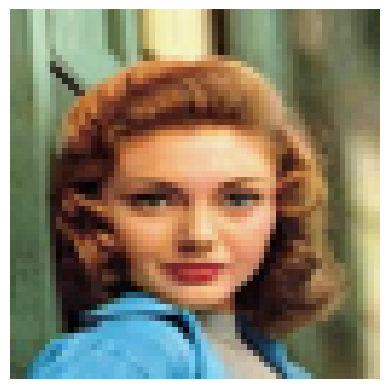

Accuracy: 1.0
Prediction: face | True label: face


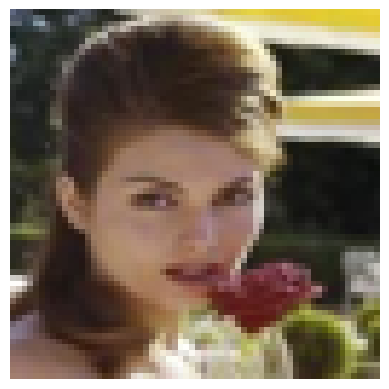

Accuracy: 1.0
Prediction: face | True label: face


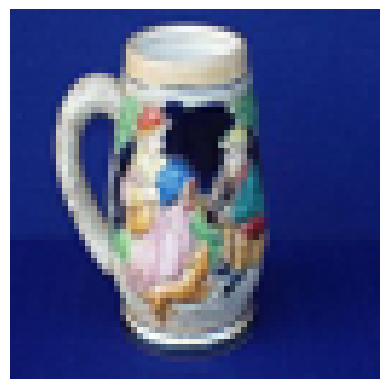

Accuracy: 0.0
Prediction: face | True label: no_face


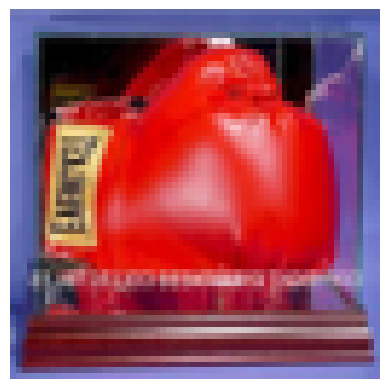

Accuracy: 0.0
Prediction: face | True label: no_face


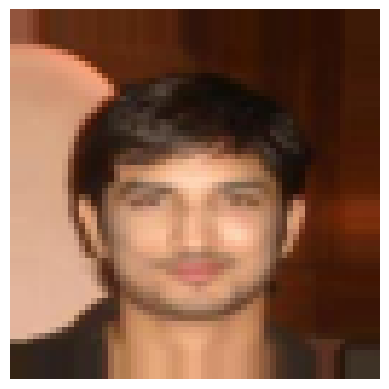

Accuracy: 1.0
Prediction: face | True label: face


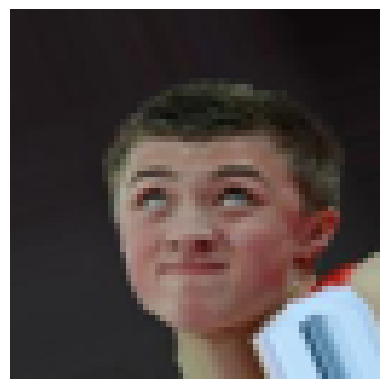

Accuracy: 1.0
Prediction: face | True label: face


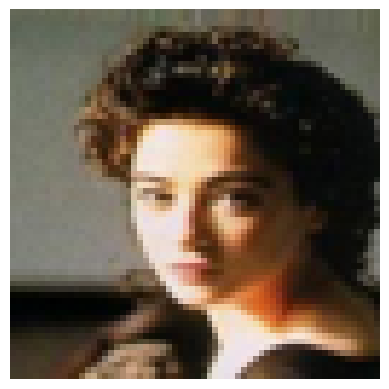

Accuracy: 1.0
Prediction: face | True label: face


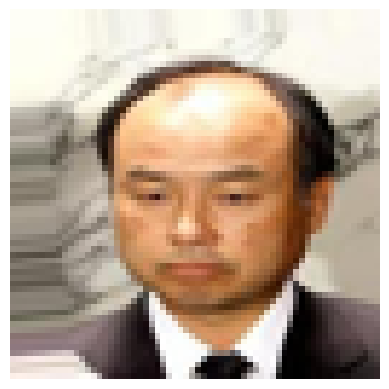

Accuracy: 0.0
Prediction: no_face | True label: face


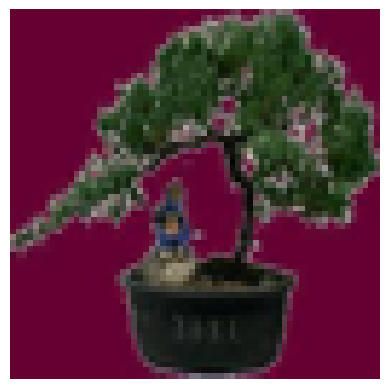

Accuracy: 0.0
Prediction: face | True label: no_face


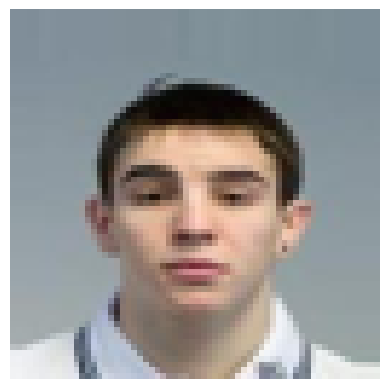

Accuracy: 1.0
Prediction: face | True label: face


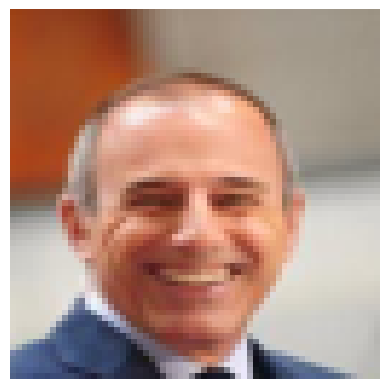

Accuracy: 1.0
Prediction: face | True label: face


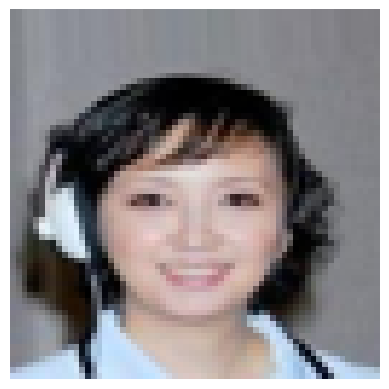

Accuracy: 1.0
Prediction: face | True label: face


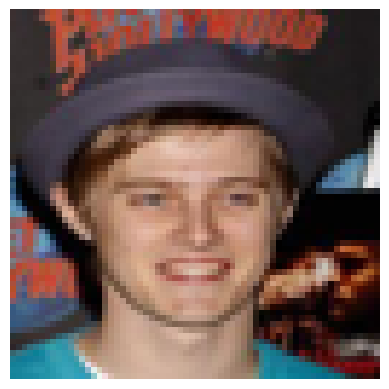

Accuracy: 1.0
Prediction: face | True label: face


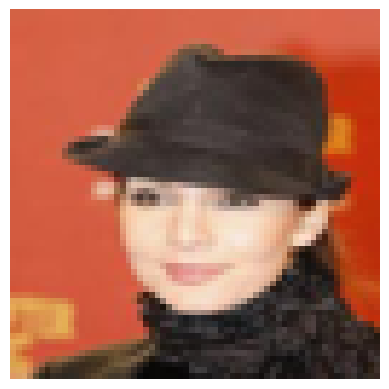

Accuracy: 1.0
Prediction: face | True label: face


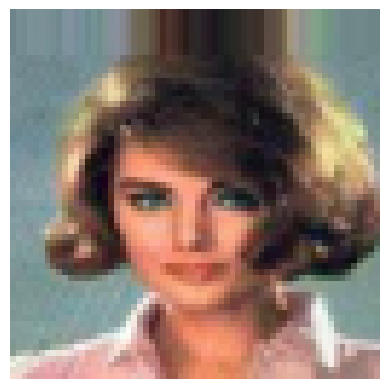

Accuracy: 1.0
Prediction: face | True label: face


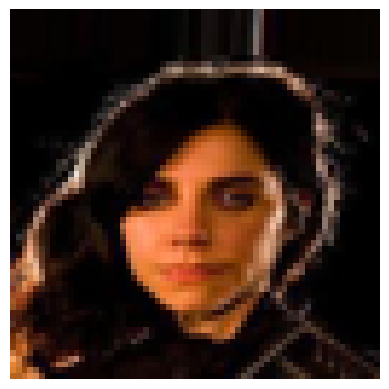

Accuracy: 1.0
Prediction: face | True label: face


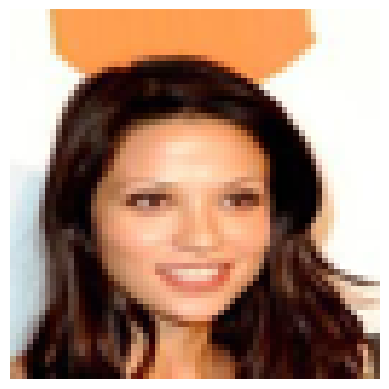

Accuracy: 1.0
Prediction: face | True label: face


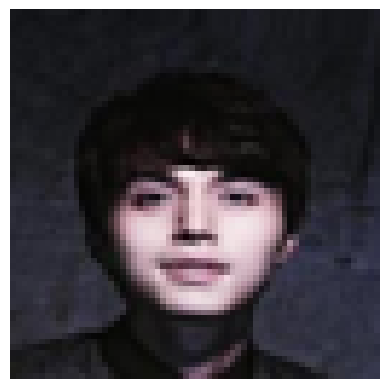

Accuracy: 1.0
Prediction: face | True label: face


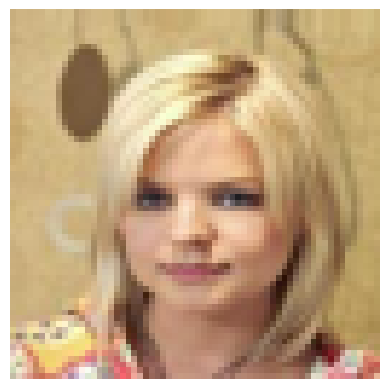

Accuracy: 1.0
Prediction: face | True label: face


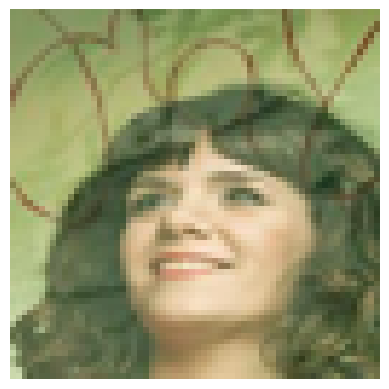

Accuracy: 1.0
Prediction: face | True label: face


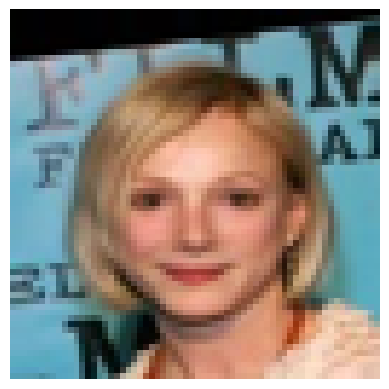

Accuracy: 1.0
Prediction: face | True label: face


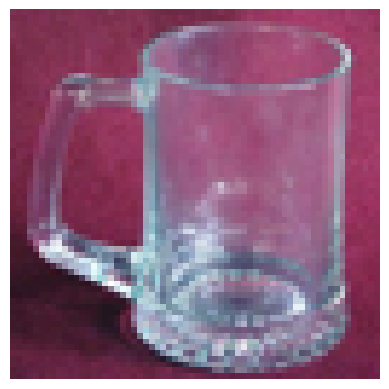

Accuracy: 0.0
Prediction: face | True label: no_face


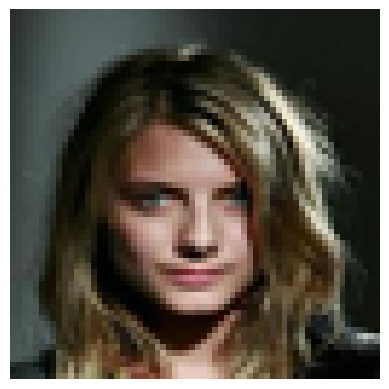

Accuracy: 1.0
Prediction: face | True label: face


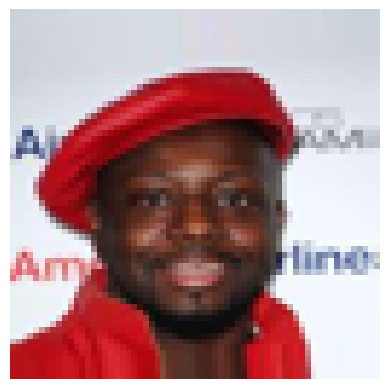

Accuracy: 1.0
Prediction: face | True label: face


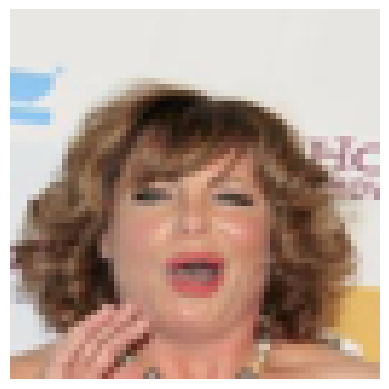

Accuracy: 1.0
Prediction: face | True label: face


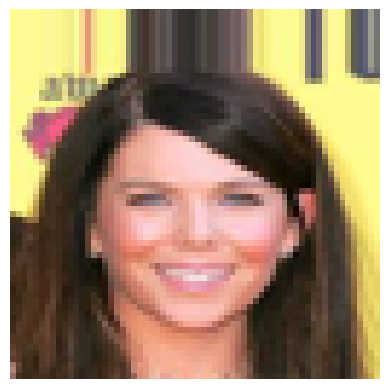

Accuracy: 1.0
Prediction: face | True label: face


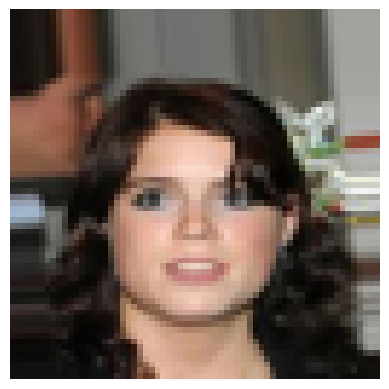

Accuracy: 1.0
Prediction: face | True label: face


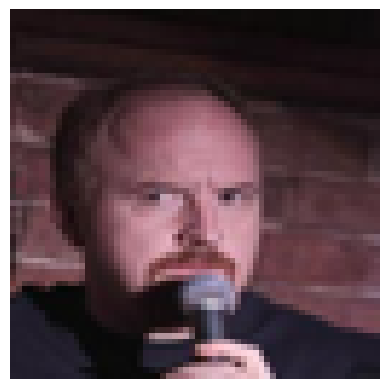

Accuracy: 1.0
Prediction: face | True label: face


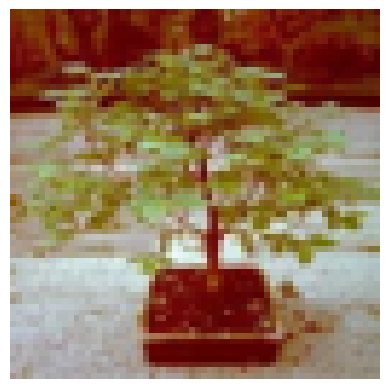

Accuracy: 0.0
Prediction: face | True label: no_face


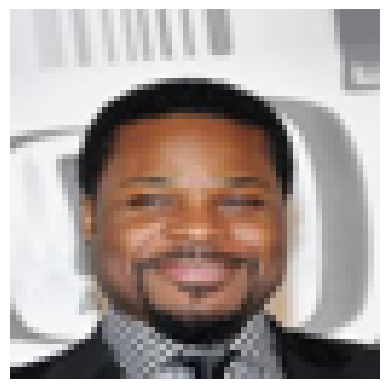

Accuracy: 1.0
Prediction: face | True label: face


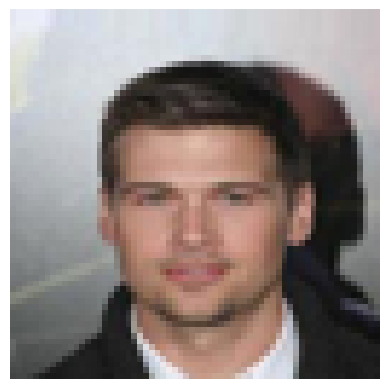

Accuracy: 1.0
Prediction: face | True label: face


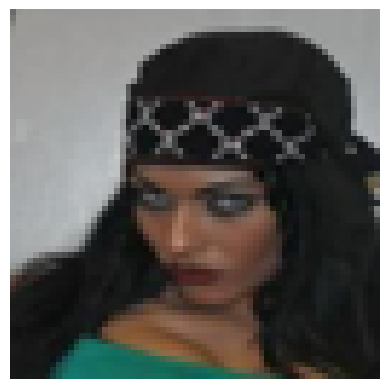

Accuracy: 0.0
Prediction: no_face | True label: face


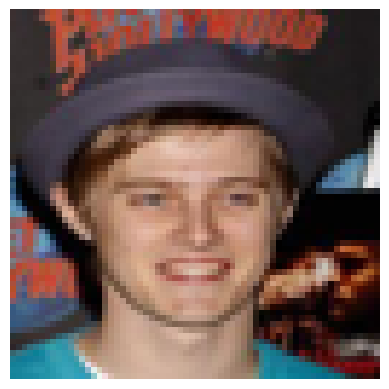

Accuracy: 1.0
Prediction: face | True label: face


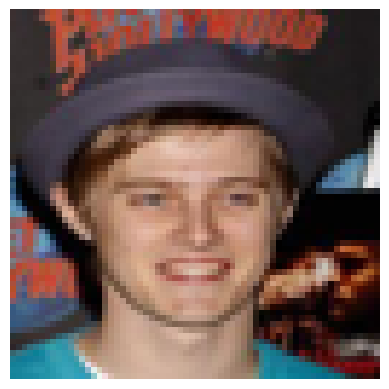

Accuracy: 1.0
Prediction: face | True label: face


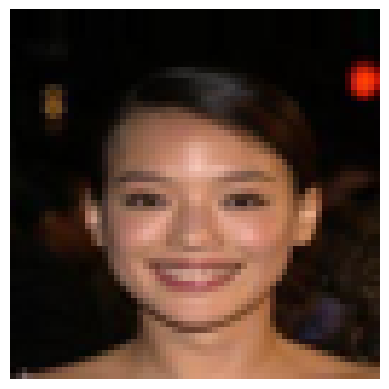

Accuracy: 1.0
Prediction: face | True label: face


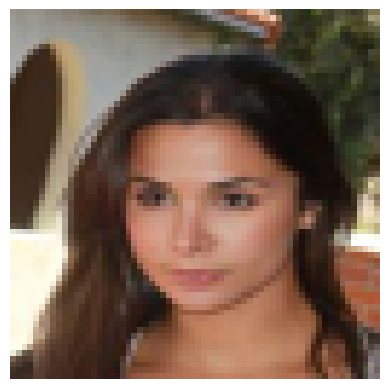

Accuracy: 1.0
Prediction: face | True label: face


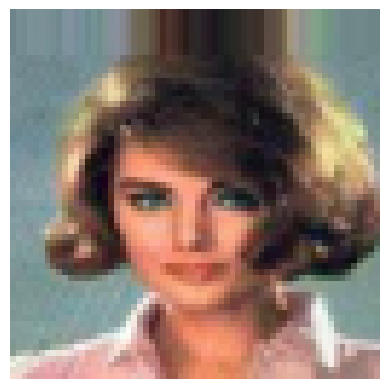

Accuracy: 1.0
Prediction: face | True label: face


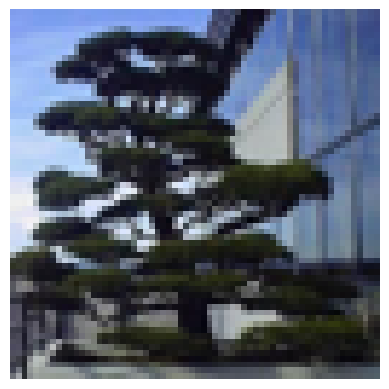

Accuracy: 1.0
Prediction: no_face | True label: no_face


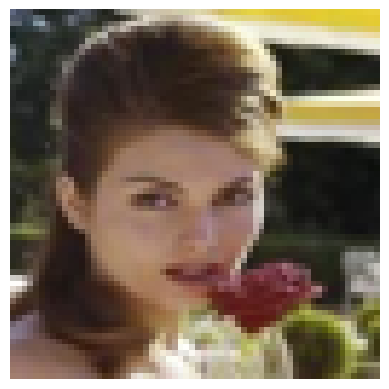

Accuracy: 1.0
Prediction: face | True label: face


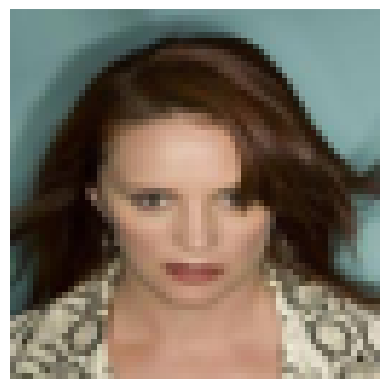

Accuracy: 1.0
Prediction: face | True label: face


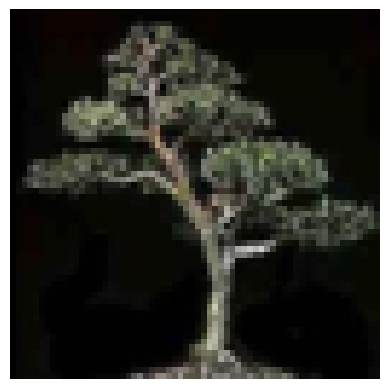

Accuracy: 1.0
Prediction: no_face | True label: no_face


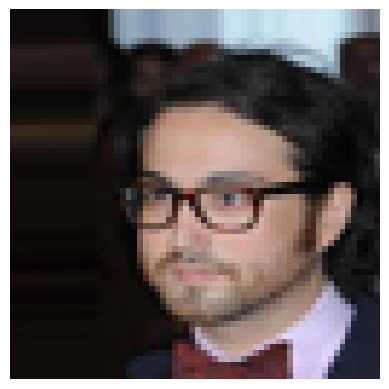

Accuracy: 1.0
Prediction: face | True label: face


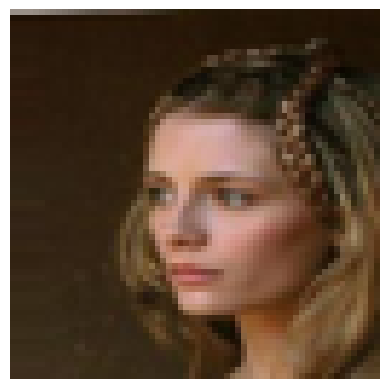

Accuracy: 1.0
Prediction: face | True label: face


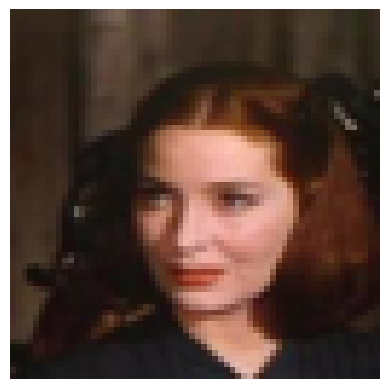

Accuracy: 1.0
Prediction: face | True label: face


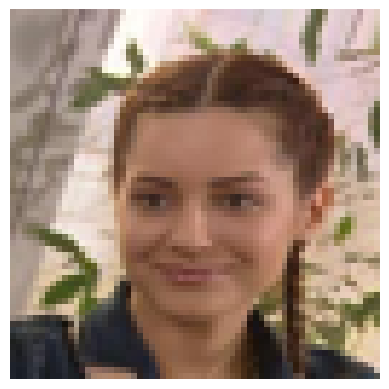

Accuracy: 1.0
Prediction: face | True label: face


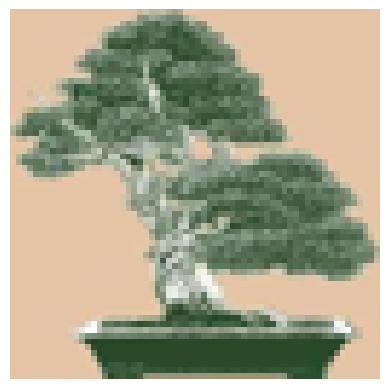

Accuracy: 1.0
Prediction: no_face | True label: no_face


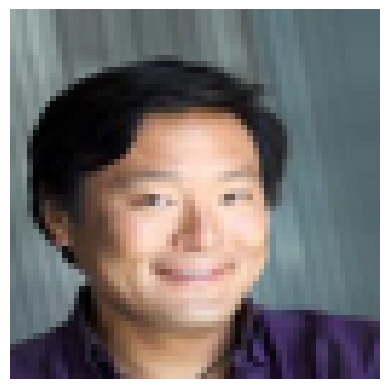

Accuracy: 1.0
Prediction: face | True label: face


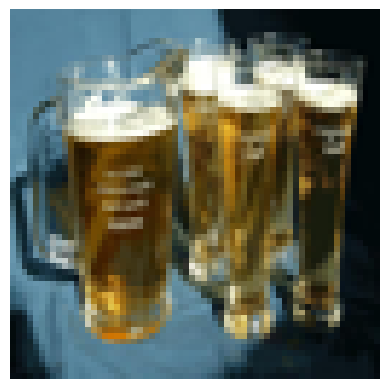

Accuracy: 1.0
Prediction: no_face | True label: no_face


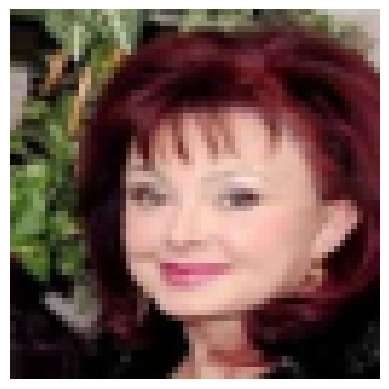

Accuracy: 1.0
Prediction: face | True label: face


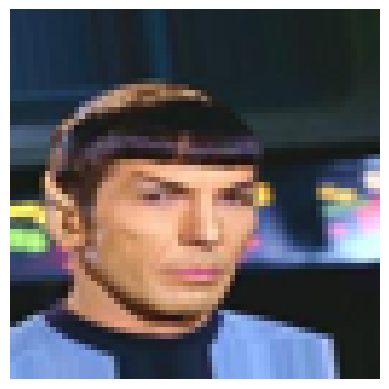

Accuracy: 1.0
Prediction: face | True label: face


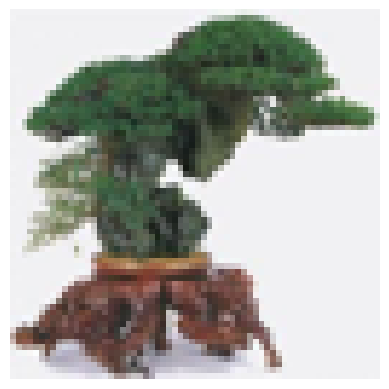

Accuracy: 1.0
Prediction: no_face | True label: no_face


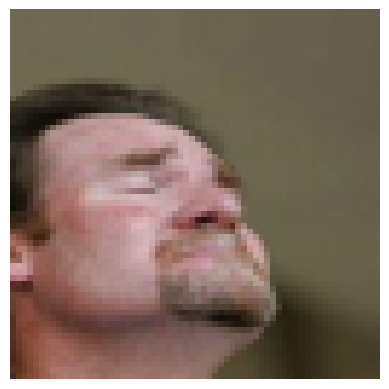

Accuracy: 0.0
Prediction: no_face | True label: face


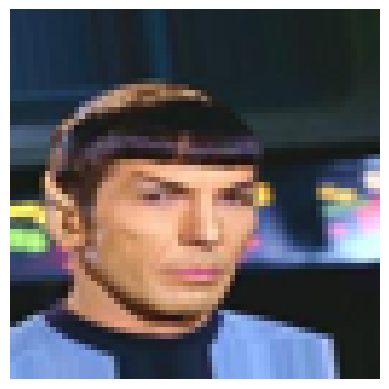

Accuracy: 1.0
Prediction: face | True label: face


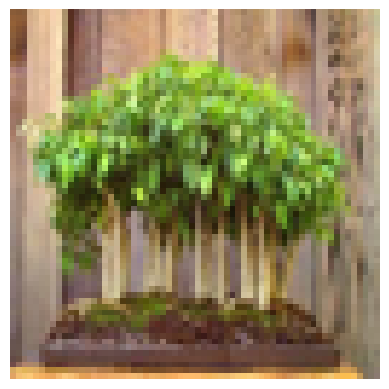

Accuracy: 1.0
Prediction: no_face | True label: no_face


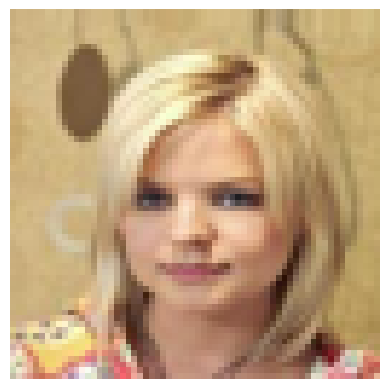

Accuracy: 1.0
Prediction: face | True label: face


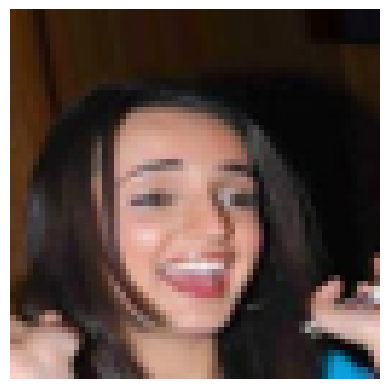

Accuracy: 1.0
Prediction: face | True label: face


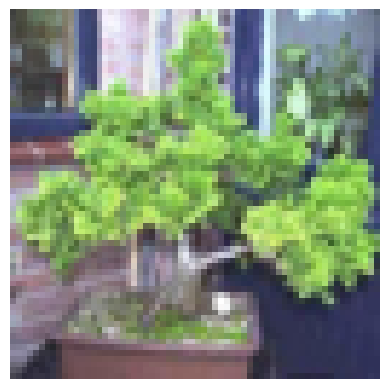

Accuracy: 1.0
Prediction: no_face | True label: no_face


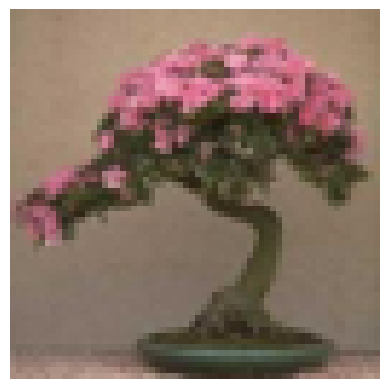

Accuracy: 0.0
Prediction: face | True label: no_face


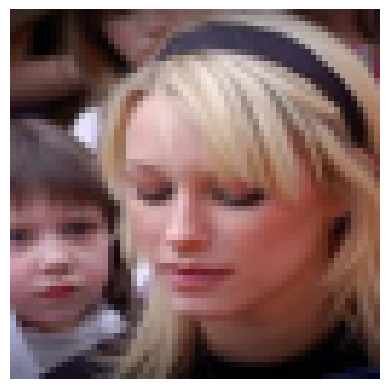

Accuracy: 1.0
Prediction: face | True label: face


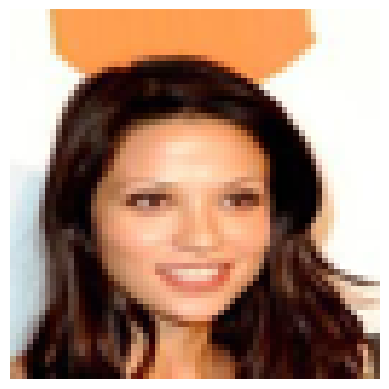

Accuracy: 1.0
Prediction: face | True label: face


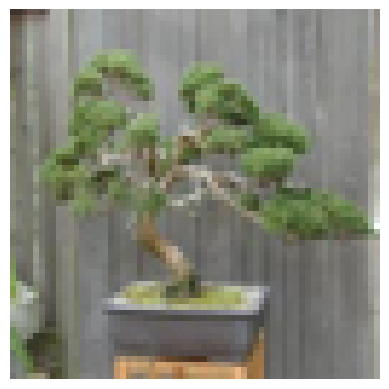

Accuracy: 1.0
Prediction: no_face | True label: no_face


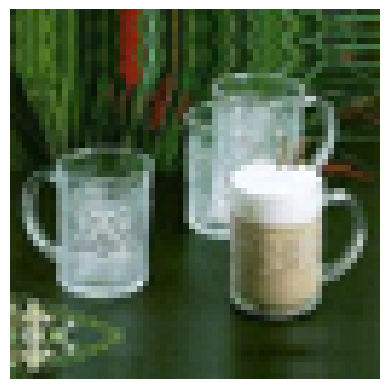

Accuracy: 1.0
Prediction: no_face | True label: no_face


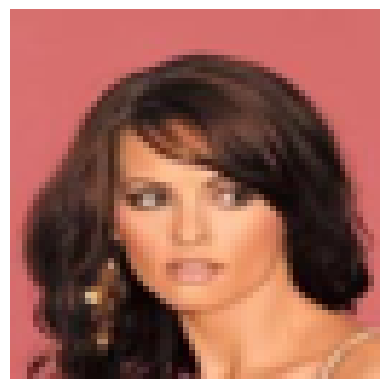

Accuracy: 1.0
Prediction: face | True label: face


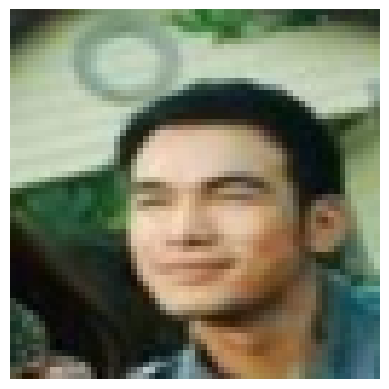

Accuracy: 1.0
Prediction: face | True label: face


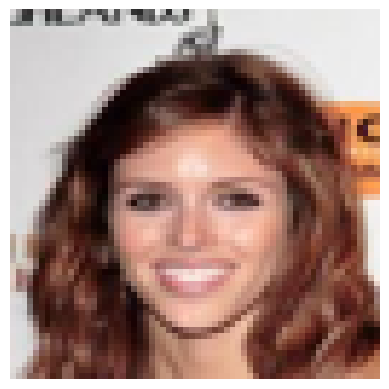

Accuracy: 1.0
Prediction: face | True label: face


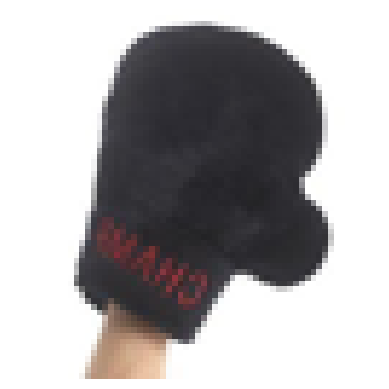

Accuracy: 1.0
Prediction: no_face | True label: no_face


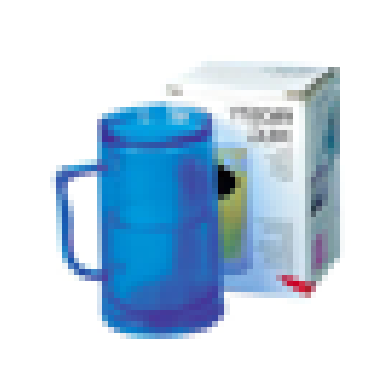

Accuracy: 1.0
Prediction: no_face | True label: no_face


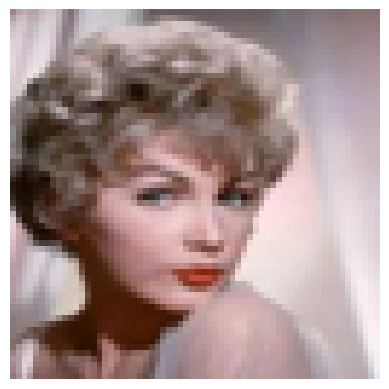

Accuracy: 1.0
Prediction: face | True label: face


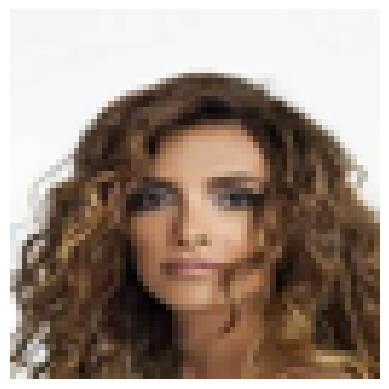

Accuracy: 1.0
Prediction: face | True label: face


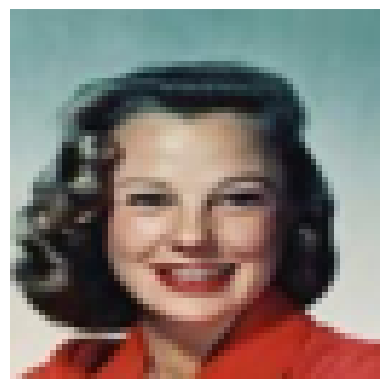

Accuracy: 1.0
Prediction: face | True label: face


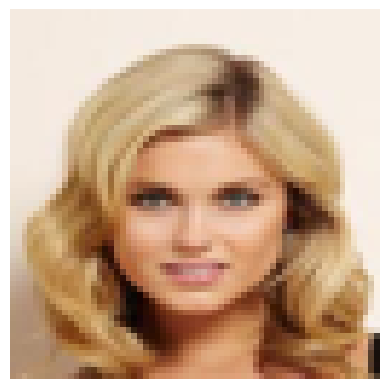

Accuracy: 1.0
Prediction: face | True label: face


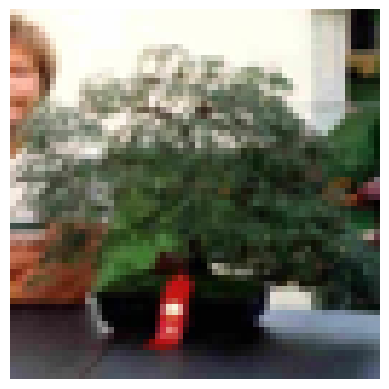

Accuracy: 1.0
Prediction: no_face | True label: no_face


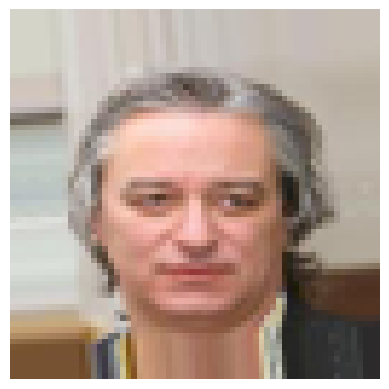

Accuracy: 1.0
Prediction: face | True label: face


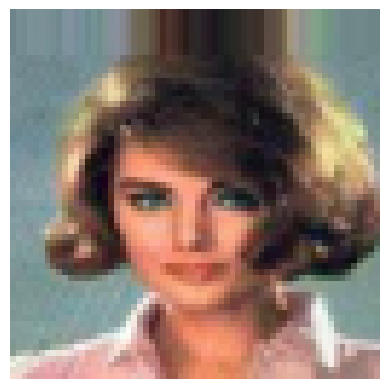

Accuracy: 1.0
Prediction: face | True label: face


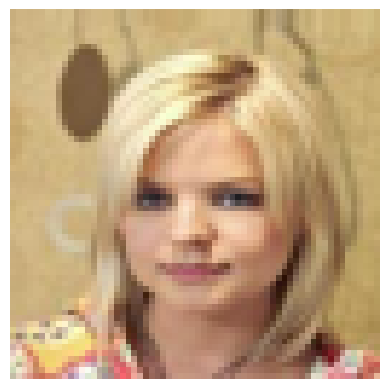

Accuracy: 1.0
Prediction: face | True label: face


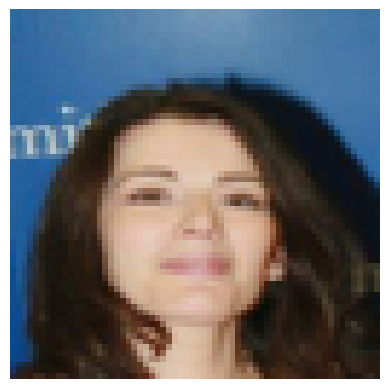

Accuracy: 1.0
Prediction: face | True label: face


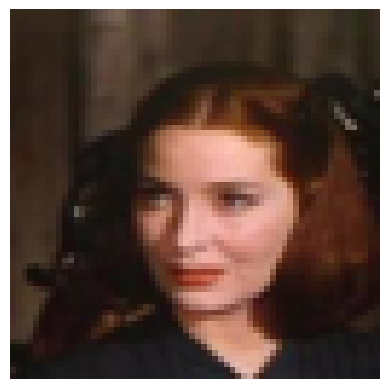

Accuracy: 1.0
Prediction: face | True label: face


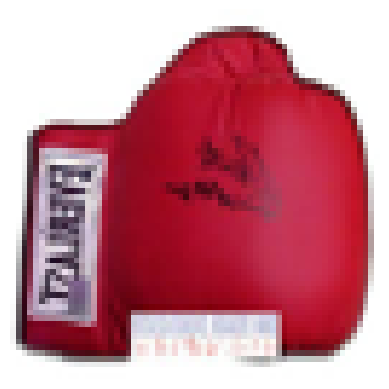

Accuracy: 1.0
Prediction: no_face | True label: no_face


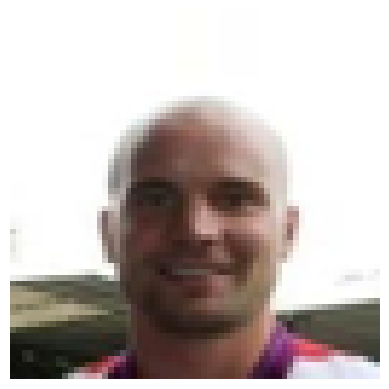

Accuracy: 0.0
Prediction: no_face | True label: face


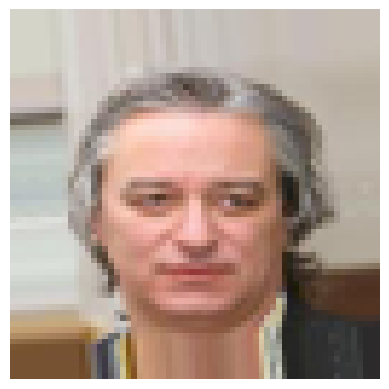

Accuracy: 1.0
Prediction: face | True label: face


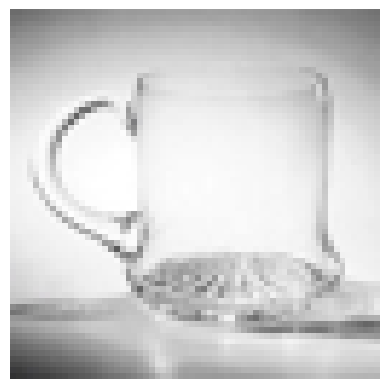

Accuracy: 1.0
Prediction: no_face | True label: no_face


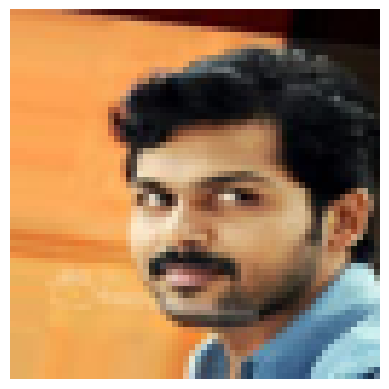

Accuracy: 1.0
Prediction: face | True label: face


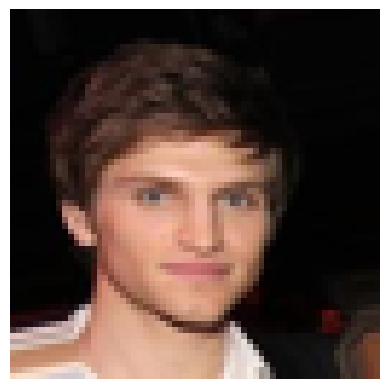

Accuracy: 1.0
Prediction: face | True label: face


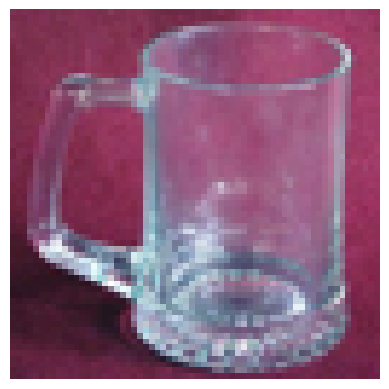

Accuracy: 0.0
Prediction: face | True label: no_face


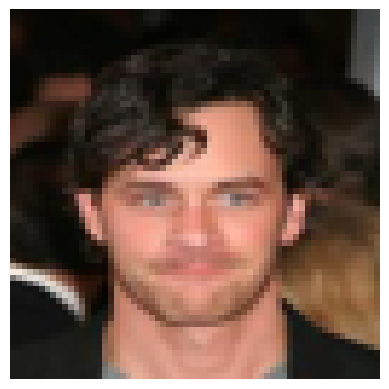

Accuracy: 1.0
Prediction: face | True label: face


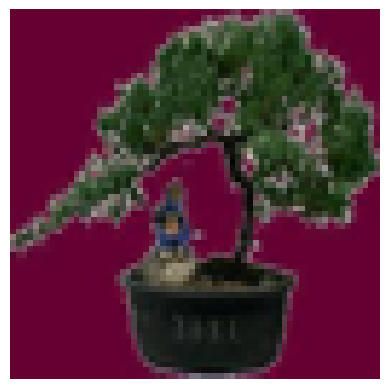

Accuracy: 0.0
Prediction: face | True label: no_face


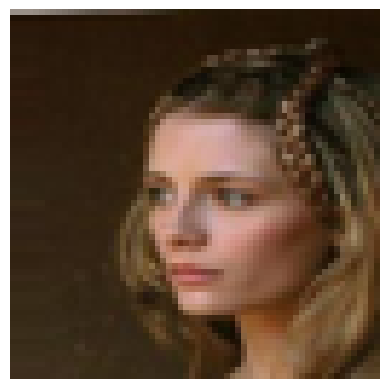

Accuracy: 1.0
Prediction: face | True label: face


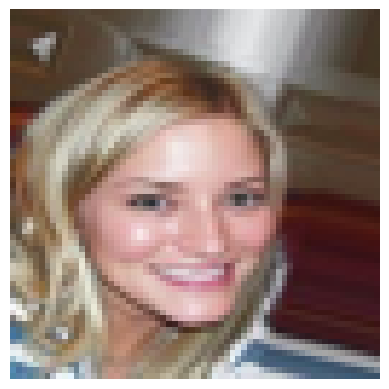

Accuracy: 1.0
Prediction: face | True label: face


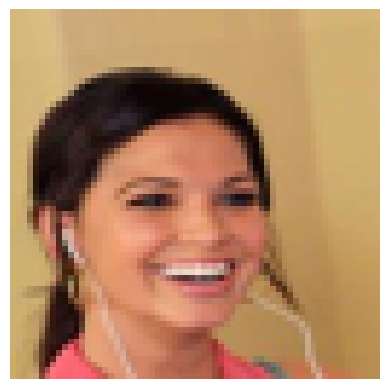

Accuracy: 1.0
Prediction: face | True label: face


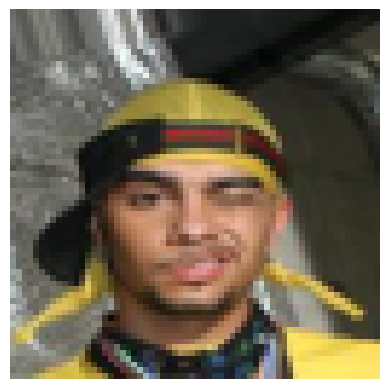

Accuracy: 1.0
Prediction: face | True label: face


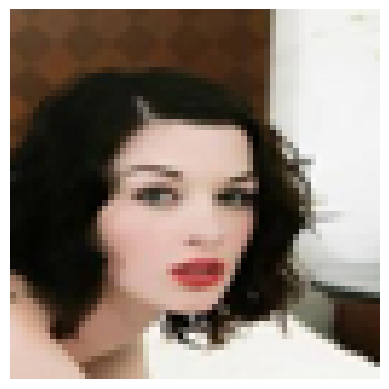

Accuracy: 1.0
Prediction: face | True label: face


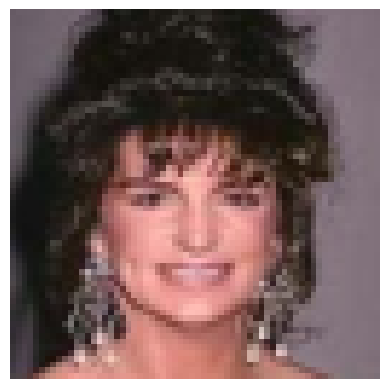

Accuracy: 1.0
Prediction: face | True label: face


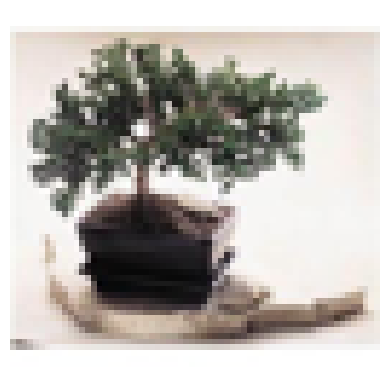

Accuracy: 1.0
Prediction: no_face | True label: no_face


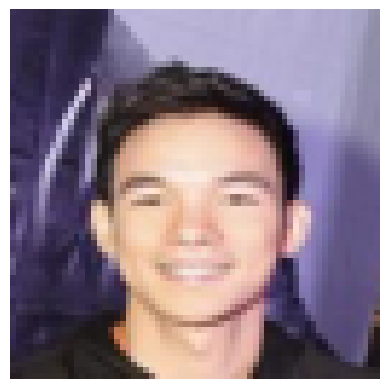

Accuracy: 1.0
Prediction: face | True label: face


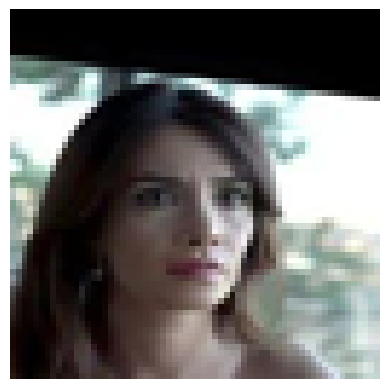

Accuracy: 1.0
Prediction: face | True label: face


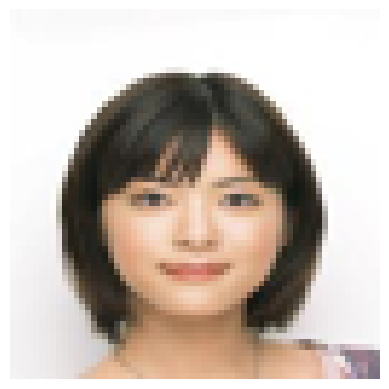

Accuracy: 1.0
Prediction: face | True label: face


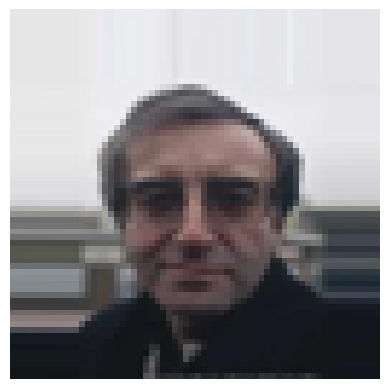

Accuracy: 1.0
Prediction: face | True label: face


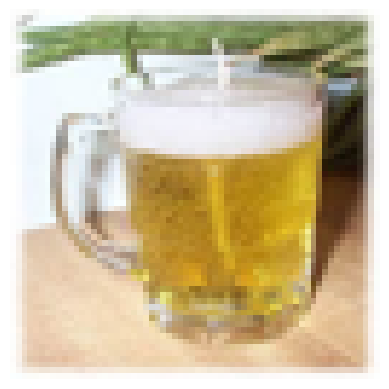

Accuracy: 1.0
Prediction: no_face | True label: no_face


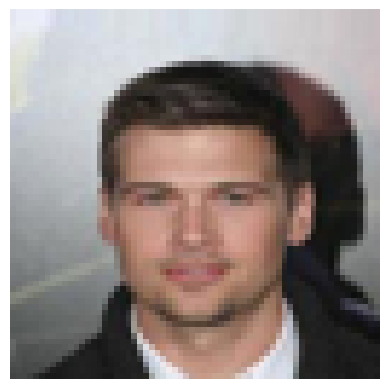

Accuracy: 1.0
Prediction: face | True label: face


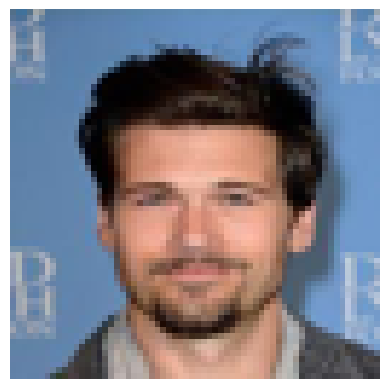

Accuracy: 1.0
Prediction: face | True label: face


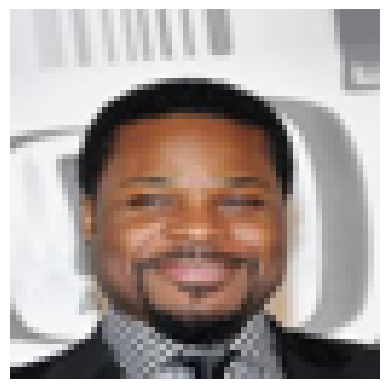

Accuracy: 1.0
Prediction: face | True label: face


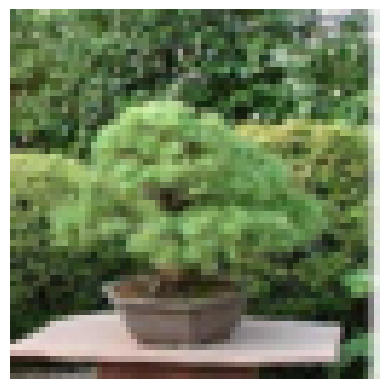

Accuracy: 1.0
Prediction: no_face | True label: no_face


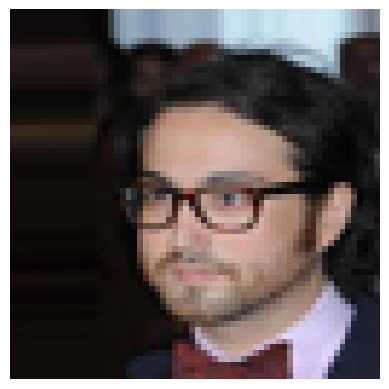

Accuracy: 1.0
Prediction: face | True label: face


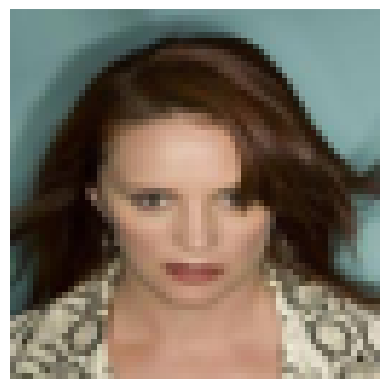

Accuracy: 1.0
Prediction: face | True label: face


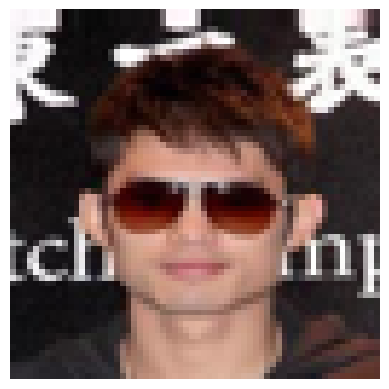

Accuracy: 1.0
Prediction: face | True label: face


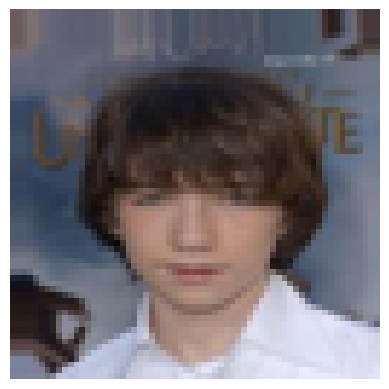

Accuracy: 1.0
Prediction: face | True label: face


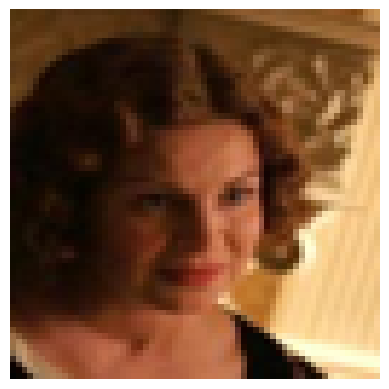

Accuracy: 1.0
Prediction: face | True label: face


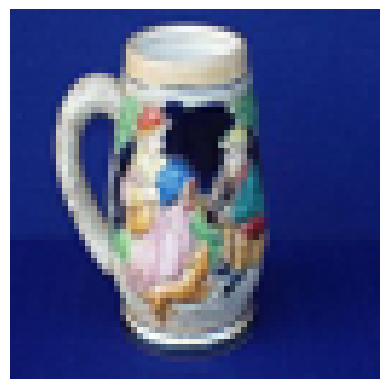

Accuracy: 0.0
Prediction: face | True label: no_face


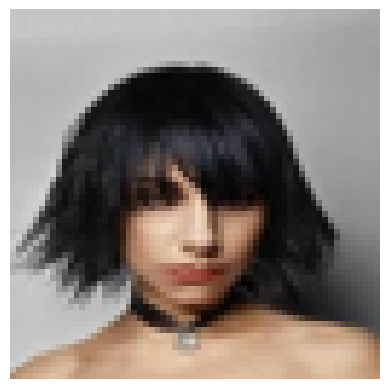

Accuracy: 1.0
Prediction: face | True label: face


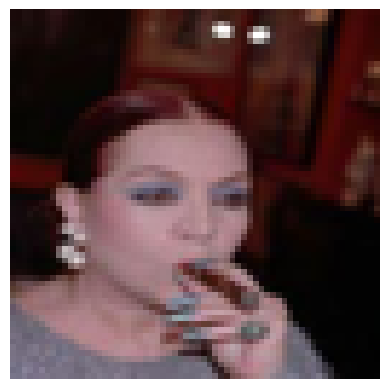

Accuracy: 1.0
Prediction: face | True label: face


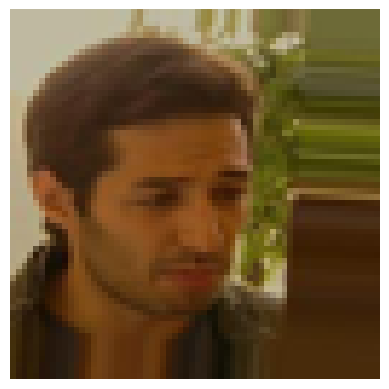

Accuracy: 1.0
Prediction: face | True label: face


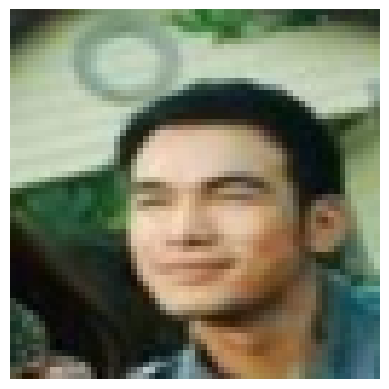

Accuracy: 1.0
Prediction: face | True label: face


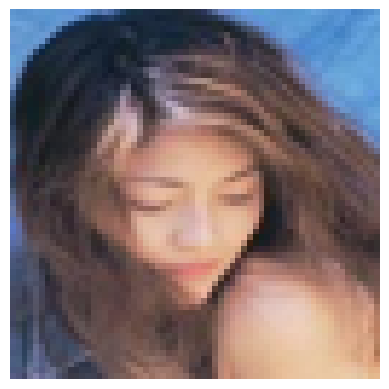

Accuracy: 1.0
Prediction: face | True label: face


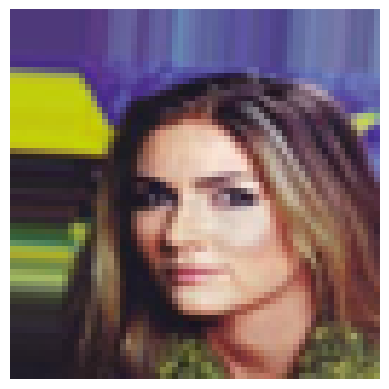

Accuracy: 1.0
Prediction: face | True label: face


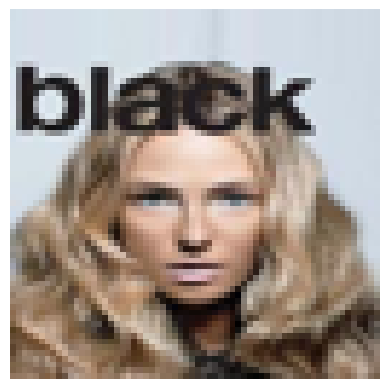

Accuracy: 1.0
Prediction: face | True label: face


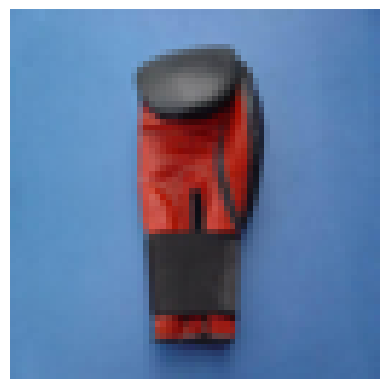

Accuracy: 1.0
Prediction: no_face | True label: no_face


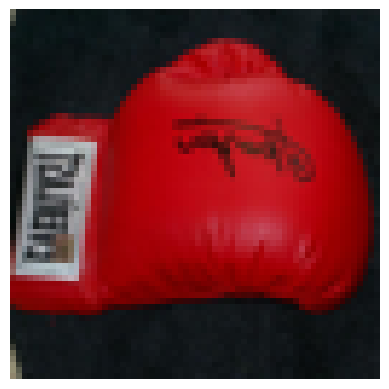

Accuracy: 0.0
Prediction: face | True label: no_face


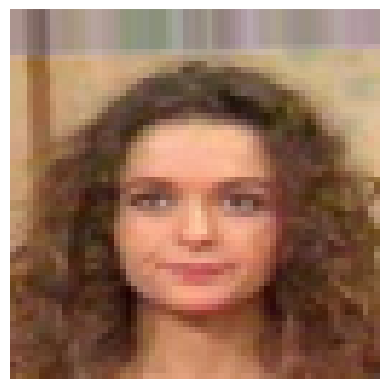

Accuracy: 1.0
Prediction: face | True label: face


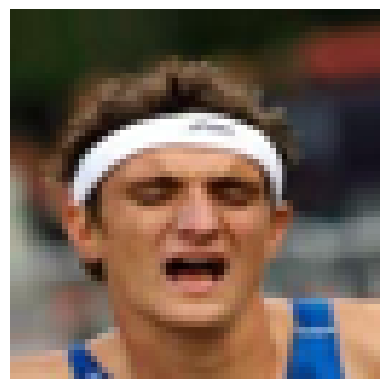

Accuracy: 1.0
Prediction: face | True label: face


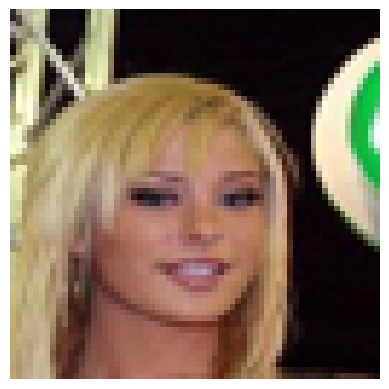

Accuracy: 1.0
Prediction: face | True label: face


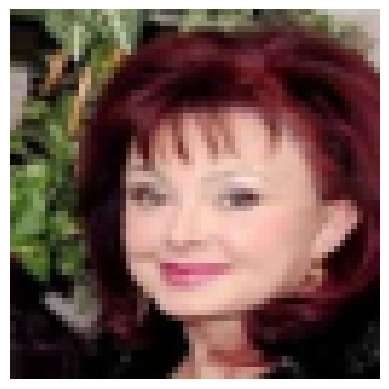

Accuracy: 1.0
Prediction: face | True label: face


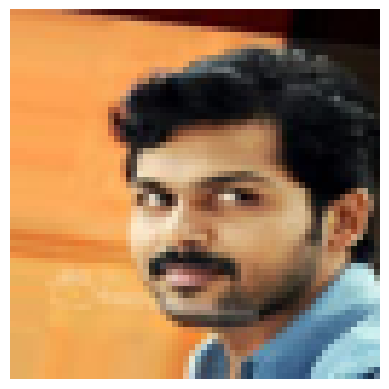

Accuracy: 1.0
Prediction: face | True label: face


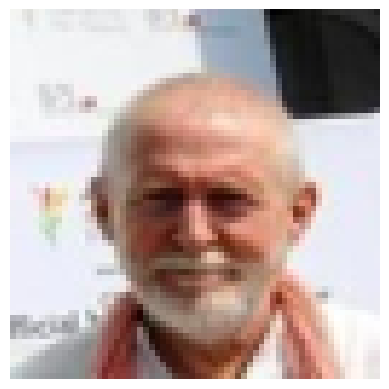

Accuracy: 0.0
Prediction: no_face | True label: face


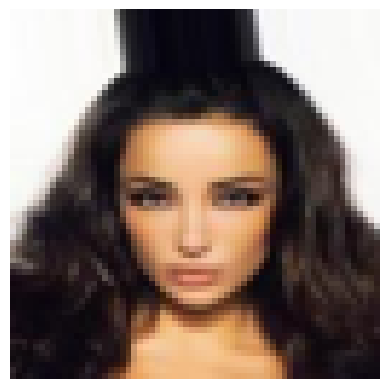

Accuracy: 1.0
Prediction: face | True label: face


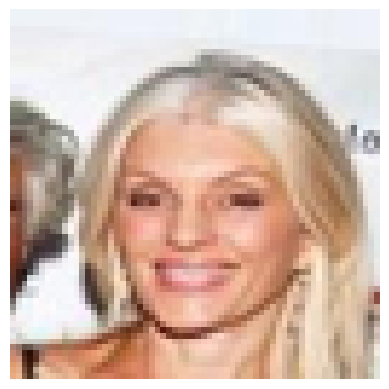

Accuracy: 1.0
Prediction: face | True label: face


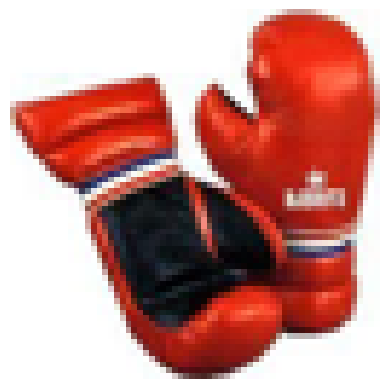

Accuracy: 1.0
Prediction: no_face | True label: no_face


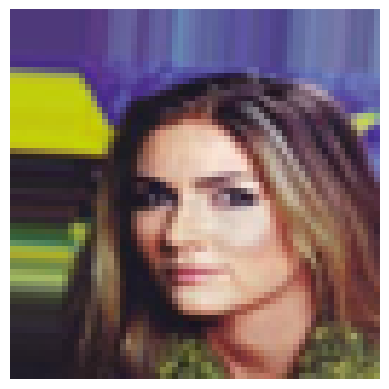

Accuracy: 1.0
Prediction: face | True label: face


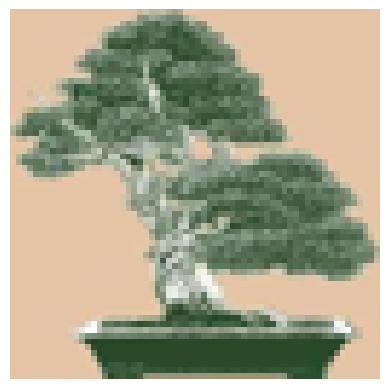

Accuracy: 1.0
Prediction: no_face | True label: no_face


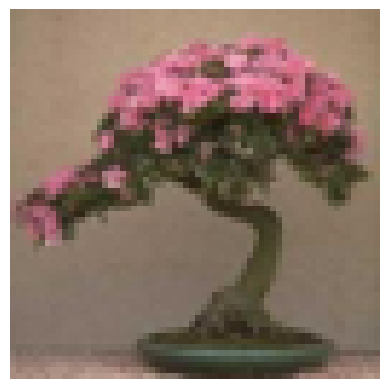

Accuracy: 0.0
Prediction: face | True label: no_face


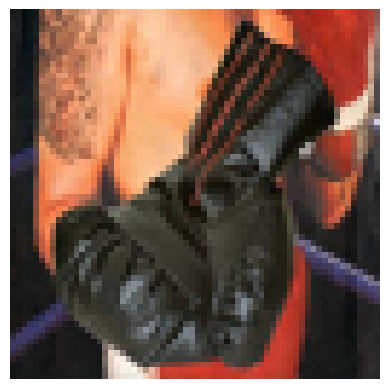

Accuracy: 1.0
Prediction: no_face | True label: no_face


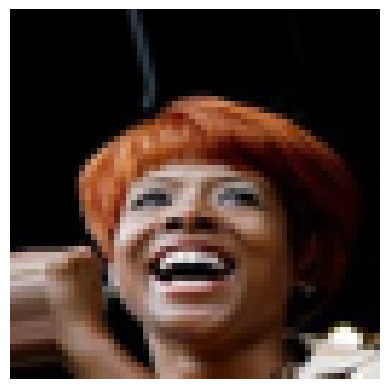

Accuracy: 1.0
Prediction: face | True label: face


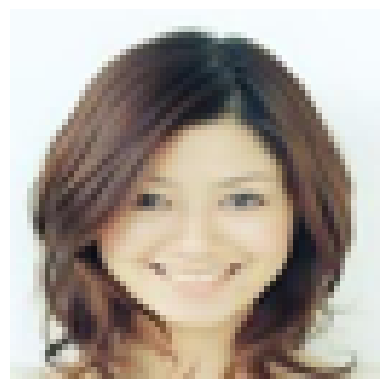

Accuracy: 1.0
Prediction: face | True label: face


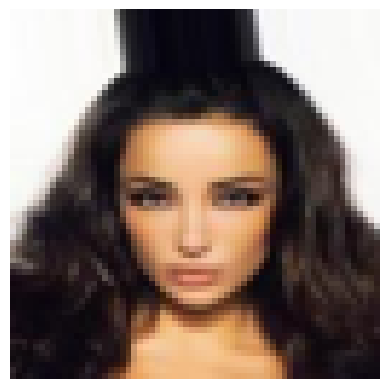

Accuracy: 1.0
Prediction: face | True label: face


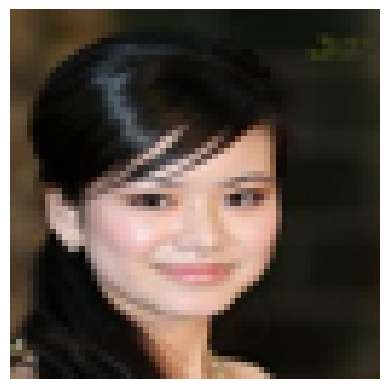

Accuracy: 1.0
Prediction: face | True label: face


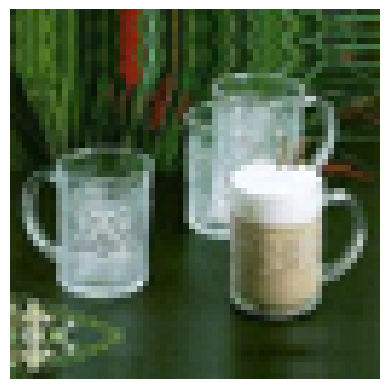

Accuracy: 1.0
Prediction: no_face | True label: no_face


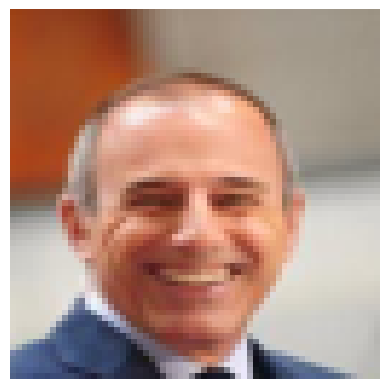

Accuracy: 1.0
Prediction: face | True label: face


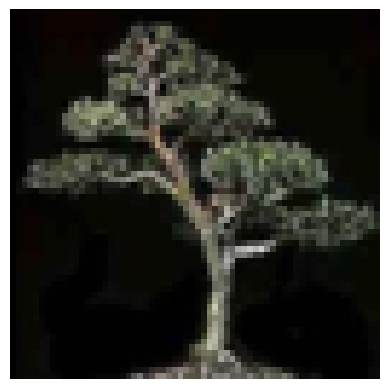

Accuracy: 1.0
Prediction: no_face | True label: no_face


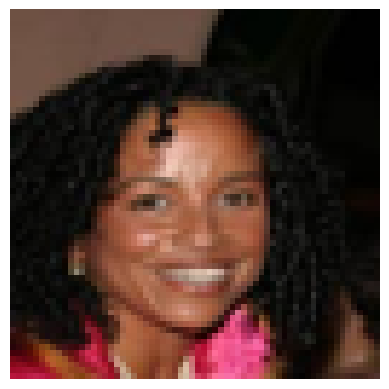

Accuracy: 1.0
Prediction: face | True label: face


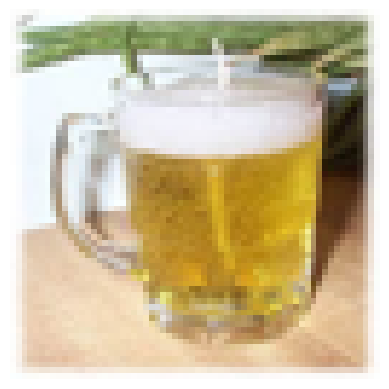

Accuracy: 1.0
Prediction: no_face | True label: no_face


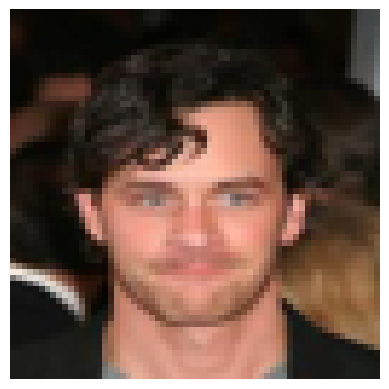

Accuracy: 1.0
Prediction: face | True label: face


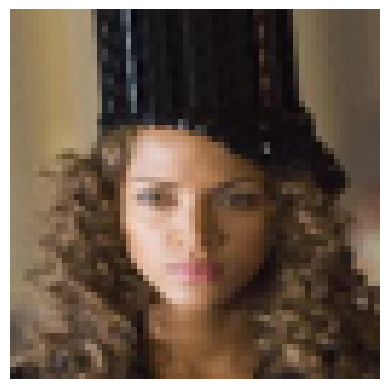

Accuracy: 1.0
Prediction: face | True label: face


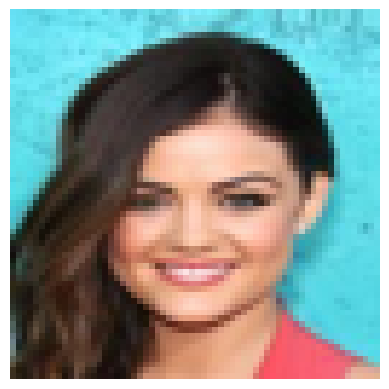

Accuracy: 1.0
Prediction: face | True label: face


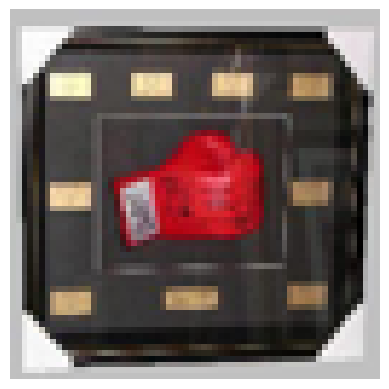

Accuracy: 1.0
Prediction: no_face | True label: no_face


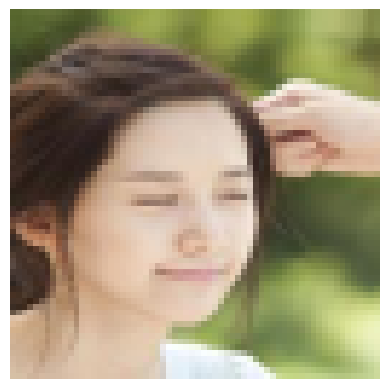

Accuracy: 0.0
Prediction: no_face | True label: face


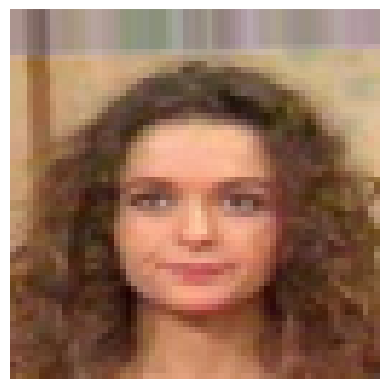

Accuracy: 1.0
Prediction: face | True label: face


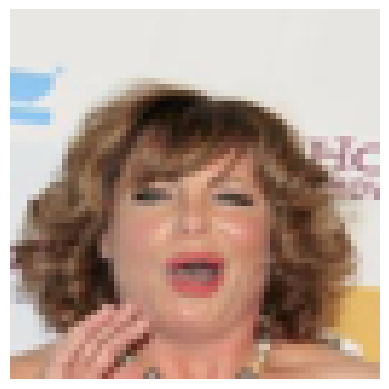

Accuracy: 1.0
Prediction: face | True label: face


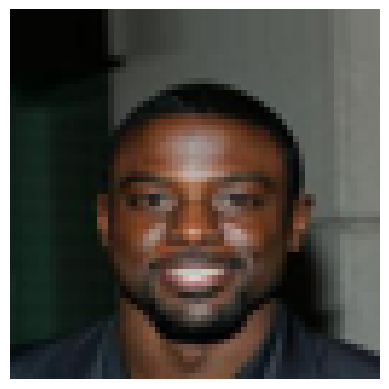

Accuracy: 1.0
Prediction: face | True label: face


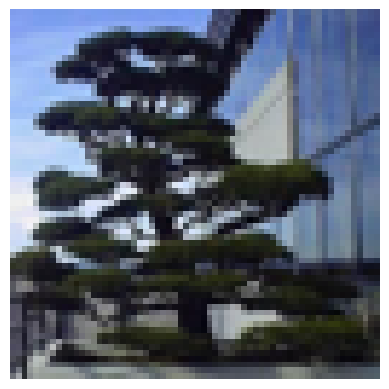

Accuracy: 1.0
Prediction: no_face | True label: no_face


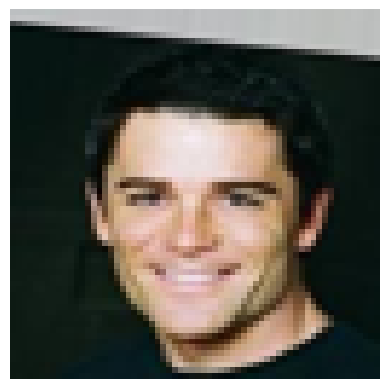

Accuracy: 1.0
Prediction: face | True label: face


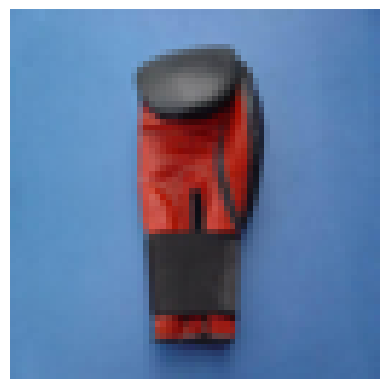

Accuracy: 1.0
Prediction: no_face | True label: no_face


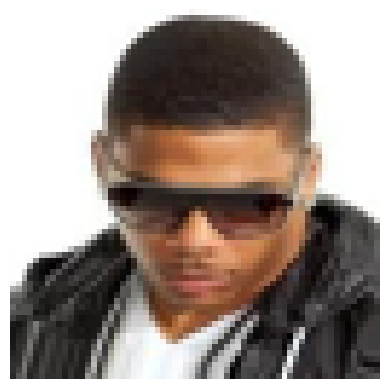

Accuracy: 1.0
Prediction: face | True label: face


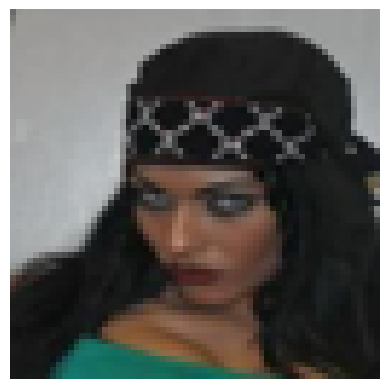

Accuracy: 0.0
Prediction: no_face | True label: face


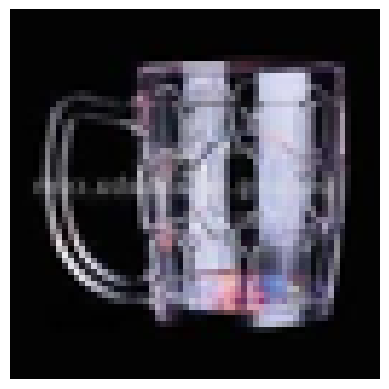

Accuracy: 1.0
Prediction: no_face | True label: no_face


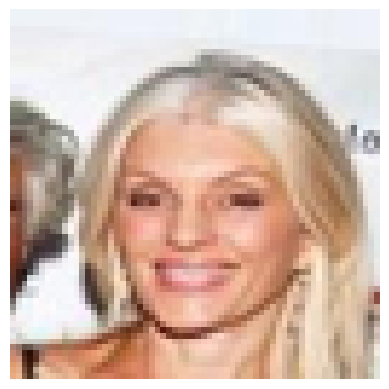

Accuracy: 1.0
Prediction: face | True label: face


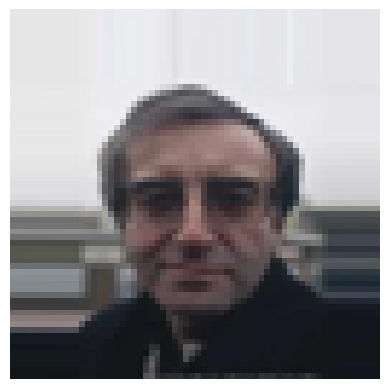

Accuracy: 1.0
Prediction: face | True label: face


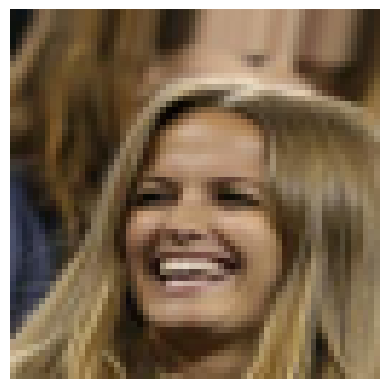

Accuracy: 1.0
Prediction: face | True label: face


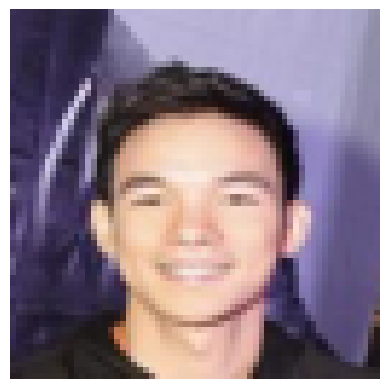

Accuracy: 1.0
Prediction: face | True label: face


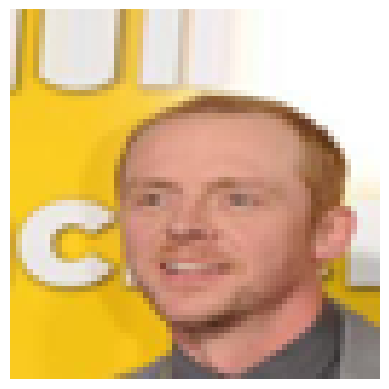

Accuracy: 1.0
Prediction: face | True label: face


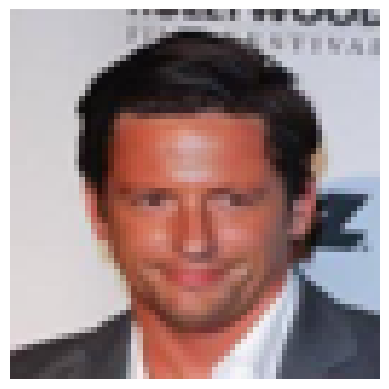

Accuracy: 1.0
Prediction: face | True label: face


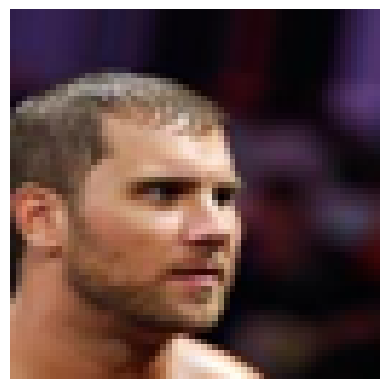

Accuracy: 1.0
Prediction: face | True label: face


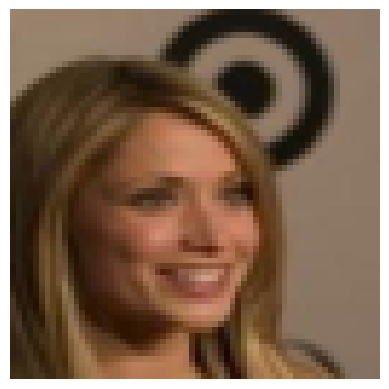

Accuracy: 1.0
Prediction: face | True label: face


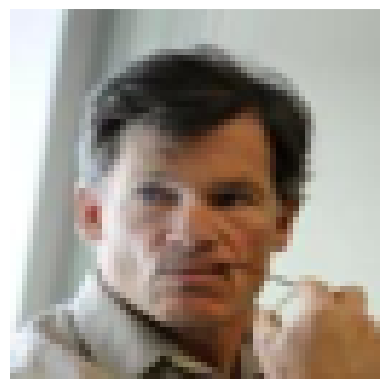

Accuracy: 1.0
Prediction: face | True label: face


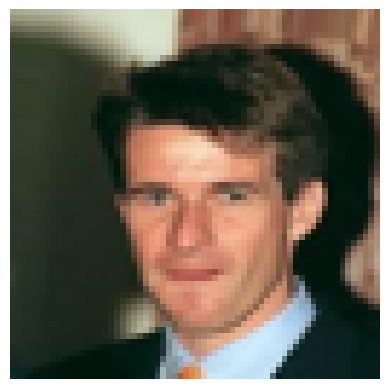

Accuracy: 1.0
Prediction: face | True label: face


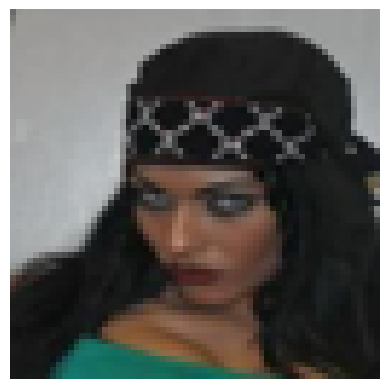

Accuracy: 0.0
Prediction: no_face | True label: face


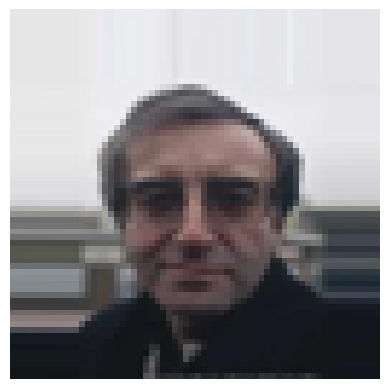

Accuracy: 1.0
Prediction: face | True label: face


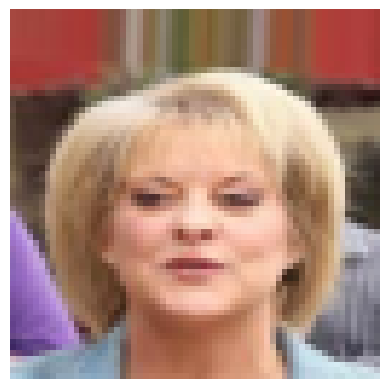

Accuracy: 1.0
Prediction: face | True label: face


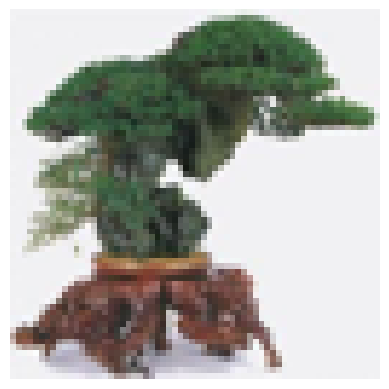

Accuracy: 1.0
Prediction: no_face | True label: no_face


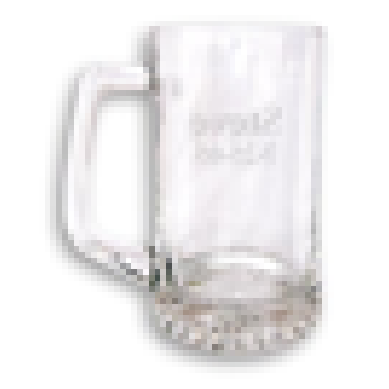

Accuracy: 1.0
Prediction: no_face | True label: no_face


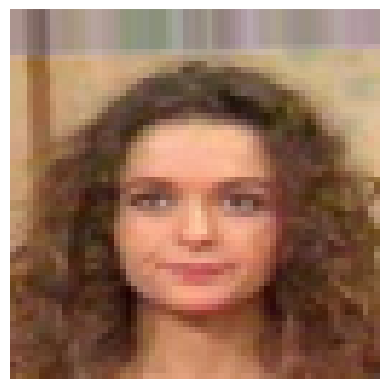

Accuracy: 1.0
Prediction: face | True label: face


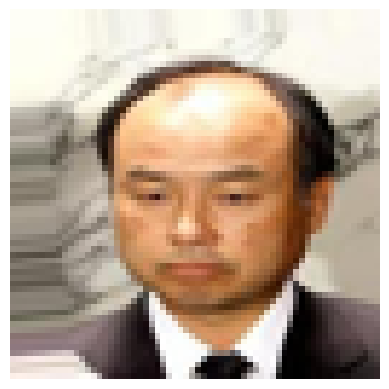

Accuracy: 0.0
Prediction: no_face | True label: face


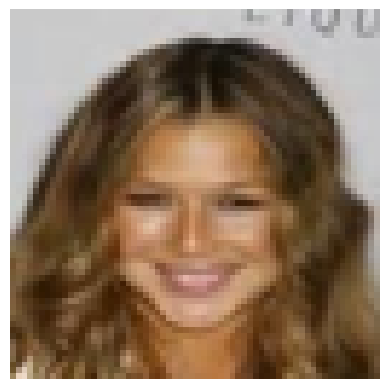

Accuracy: 1.0
Prediction: face | True label: face


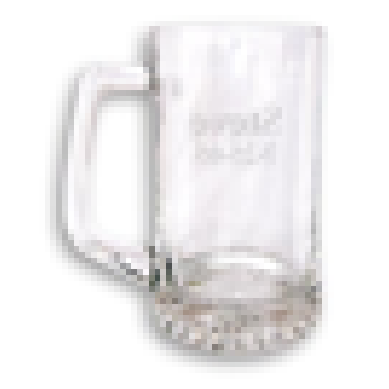

Accuracy: 1.0
Prediction: no_face | True label: no_face


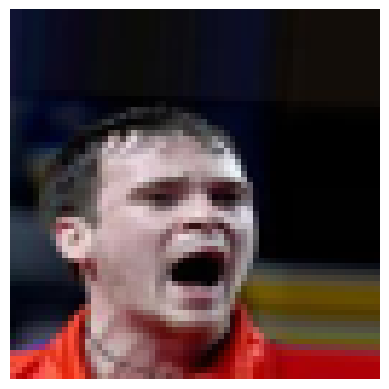

Accuracy: 1.0
Prediction: face | True label: face


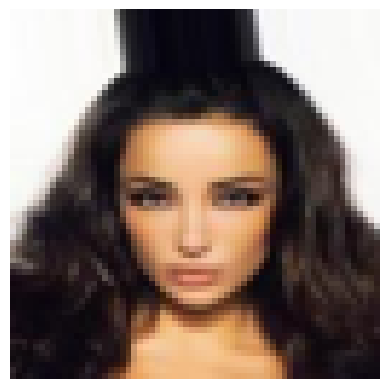

Accuracy: 1.0
Prediction: face | True label: face


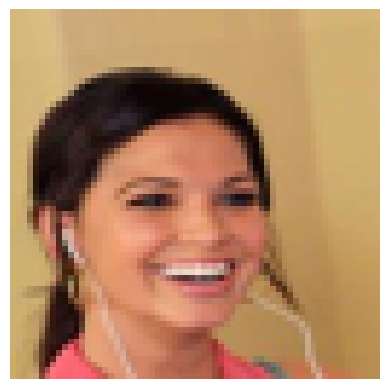

Accuracy: 1.0
Prediction: face | True label: face


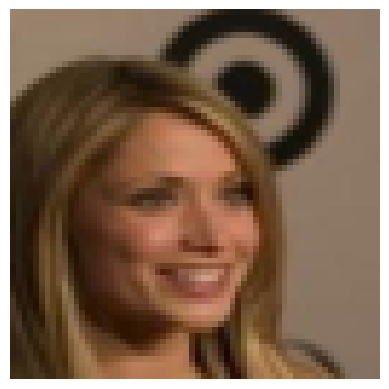

Accuracy: 1.0
Prediction: face | True label: face


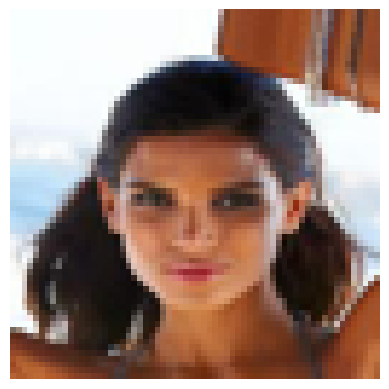

Accuracy: 1.0
Prediction: face | True label: face


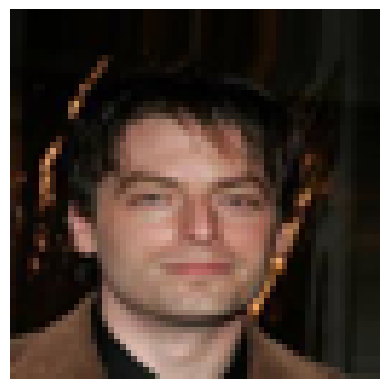

Accuracy: 1.0
Prediction: face | True label: face


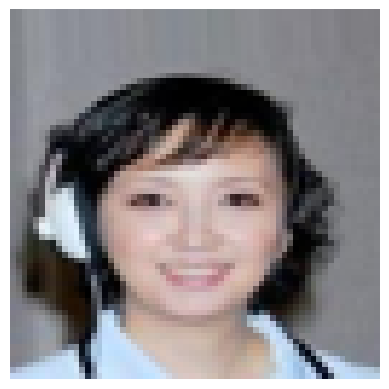

Accuracy: 1.0
Prediction: face | True label: face


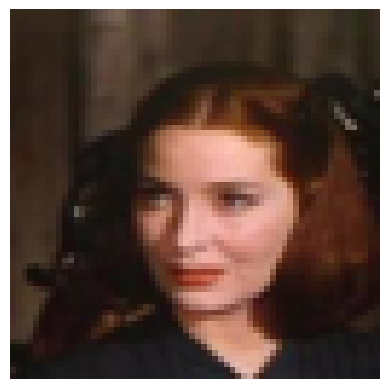

Accuracy: 1.0
Prediction: face | True label: face


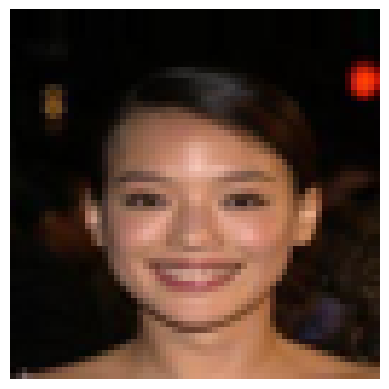

Accuracy: 1.0
Prediction: face | True label: face


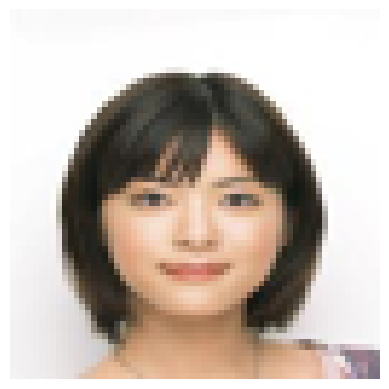

Accuracy: 1.0
Prediction: face | True label: face


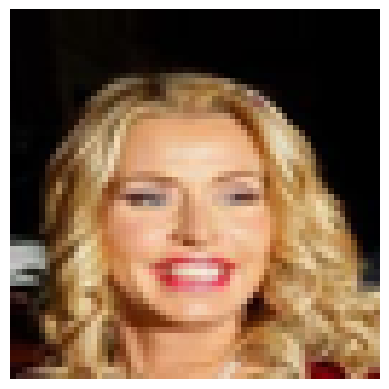

Accuracy: 1.0
Prediction: face | True label: face


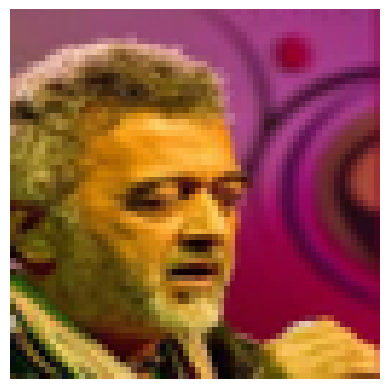

Accuracy: 1.0
Prediction: face | True label: face


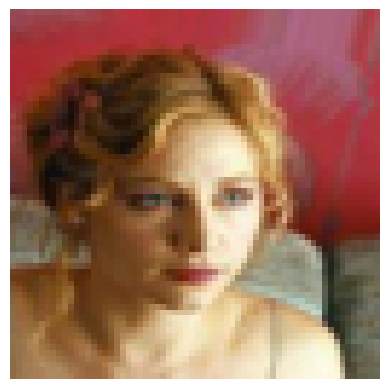

Accuracy: 1.0
Prediction: face | True label: face


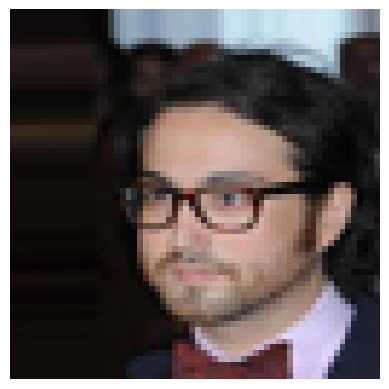

Accuracy: 1.0
Prediction: face | True label: face


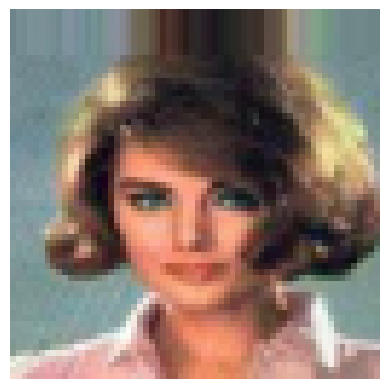

Accuracy: 1.0
Prediction: face | True label: face


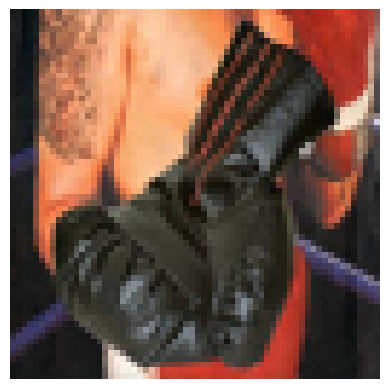

Accuracy: 1.0
Prediction: no_face | True label: no_face


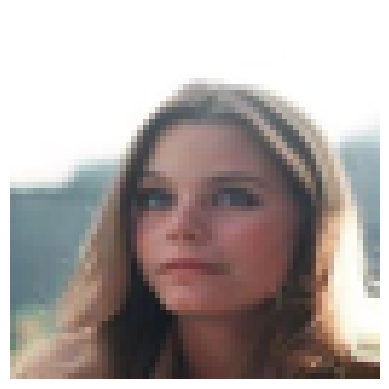

Accuracy: 1.0
Prediction: face | True label: face


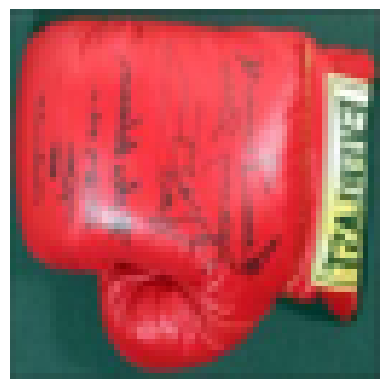

Accuracy: 0.0
Prediction: face | True label: no_face


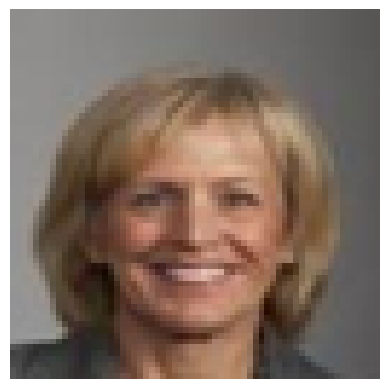

Accuracy: 1.0
Prediction: face | True label: face


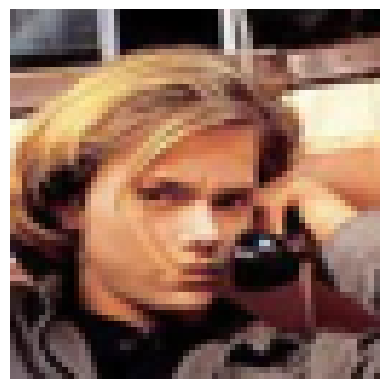

Accuracy: 1.0
Prediction: face | True label: face


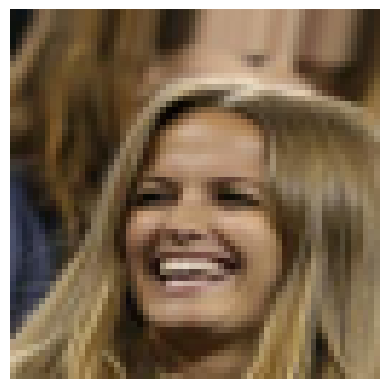

Accuracy: 1.0
Prediction: face | True label: face


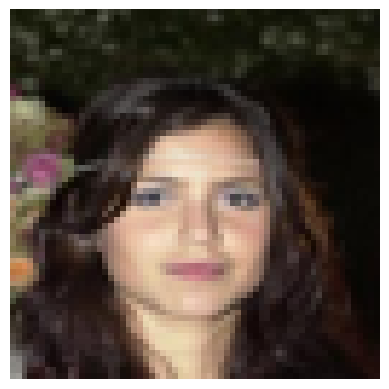

Accuracy: 1.0
Prediction: face | True label: face


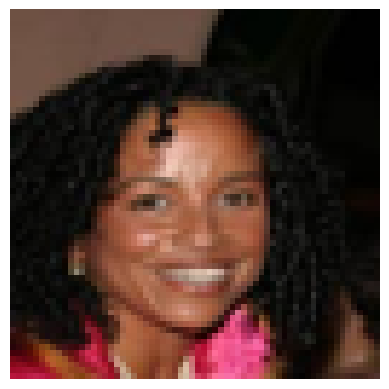

Accuracy: 1.0
Prediction: face | True label: face


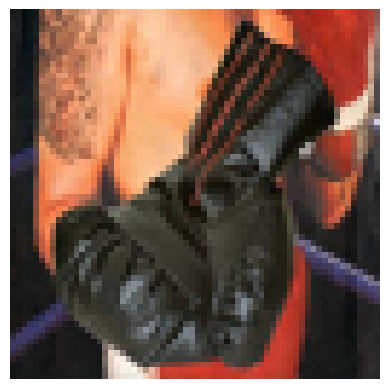

Accuracy: 1.0
Prediction: no_face | True label: no_face


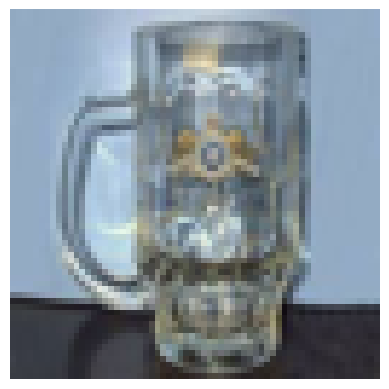

Accuracy: 1.0
Prediction: no_face | True label: no_face


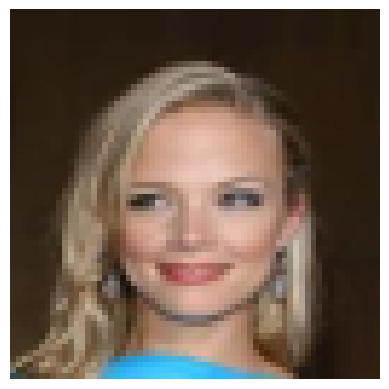

Accuracy: 1.0
Prediction: face | True label: face


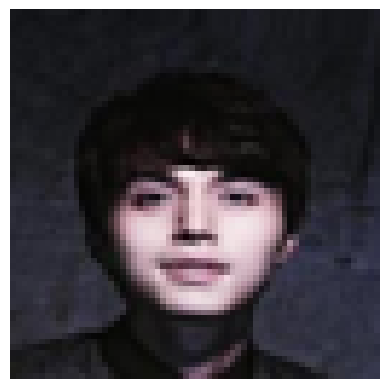

Accuracy: 1.0
Prediction: face | True label: face


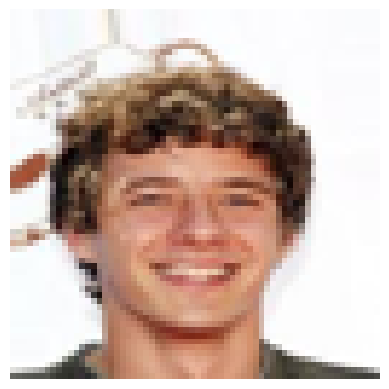

Accuracy: 1.0
Prediction: face | True label: face


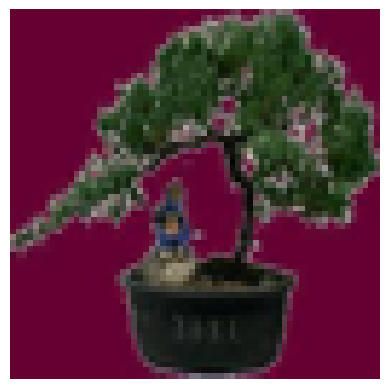

Accuracy: 0.0
Prediction: face | True label: no_face


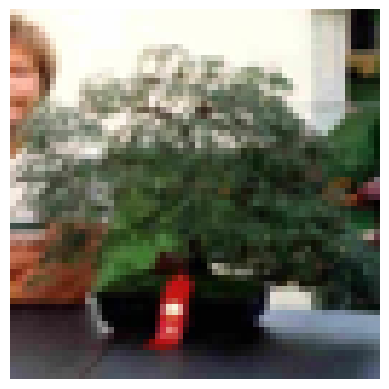

Accuracy: 1.0
Prediction: no_face | True label: no_face


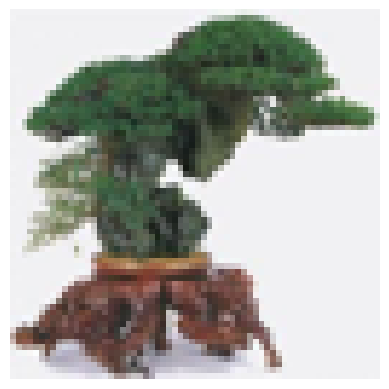

Accuracy: 1.0
Prediction: no_face | True label: no_face


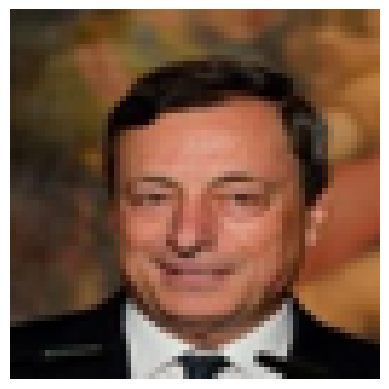

Accuracy: 1.0
Prediction: face | True label: face


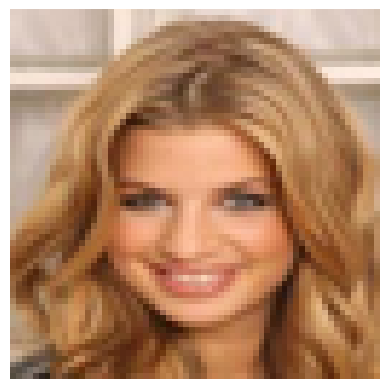

Accuracy: 1.0
Prediction: face | True label: face


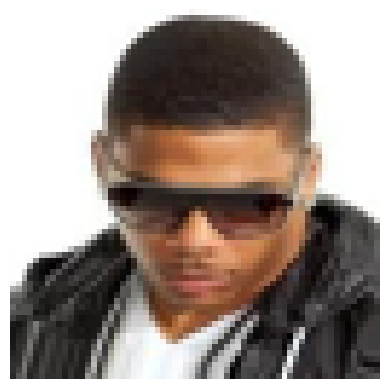

Accuracy: 1.0
Prediction: face | True label: face


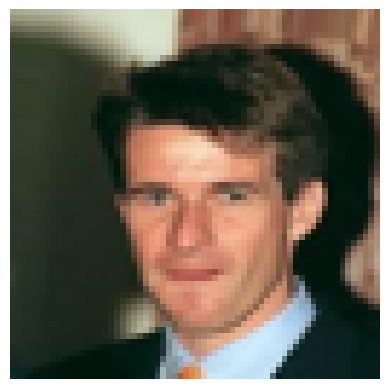

Accuracy: 1.0
Prediction: face | True label: face


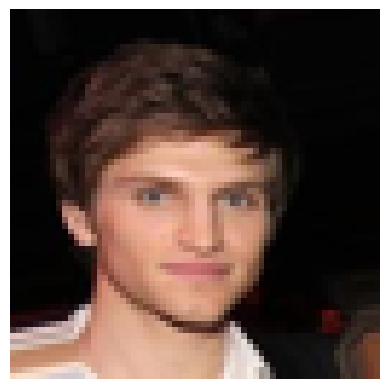

Accuracy: 1.0
Prediction: face | True label: face


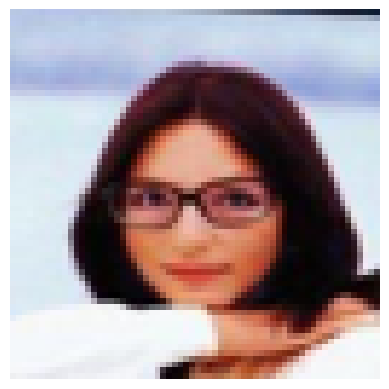

Accuracy: 1.0
Prediction: face | True label: face


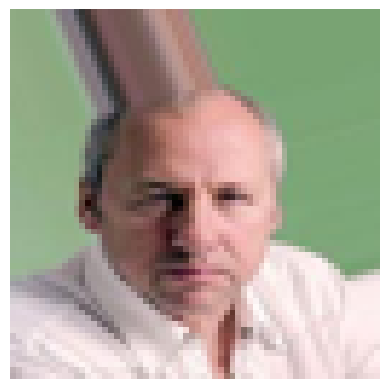

Accuracy: 0.0
Prediction: no_face | True label: face


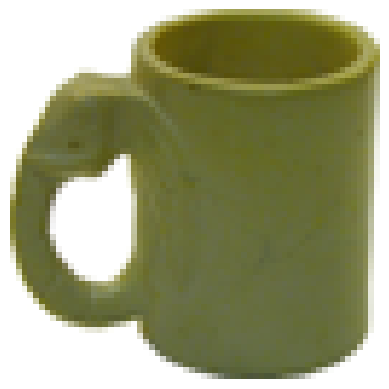

Accuracy: 1.0
Prediction: no_face | True label: no_face


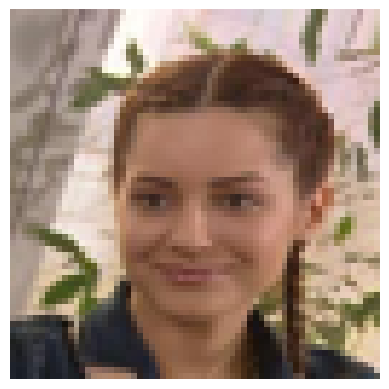

Accuracy: 1.0
Prediction: face | True label: face


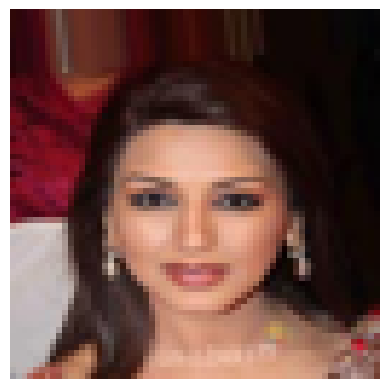

Accuracy: 1.0
Prediction: face | True label: face


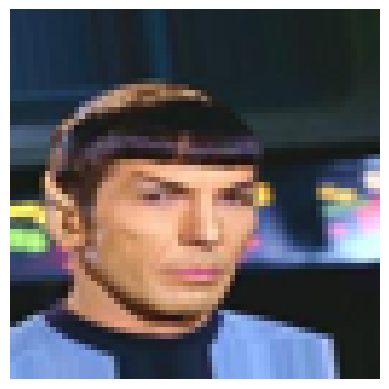

Accuracy: 1.0
Prediction: face | True label: face


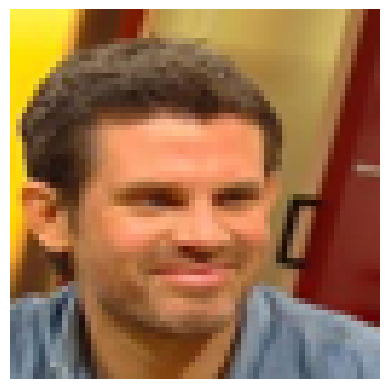

Accuracy: 1.0
Prediction: face | True label: face


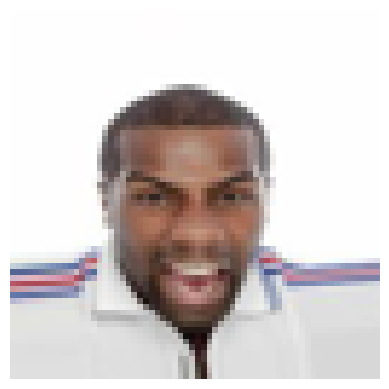

Accuracy: 0.0
Prediction: no_face | True label: face


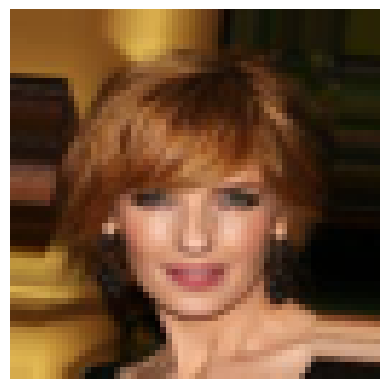

Accuracy: 1.0
Prediction: face | True label: face


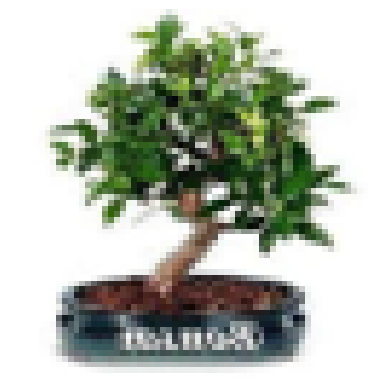

Accuracy: 1.0
Prediction: no_face | True label: no_face


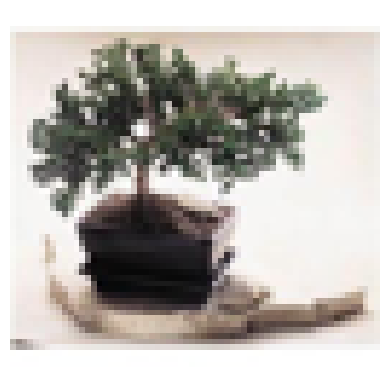

Accuracy: 1.0
Prediction: no_face | True label: no_face


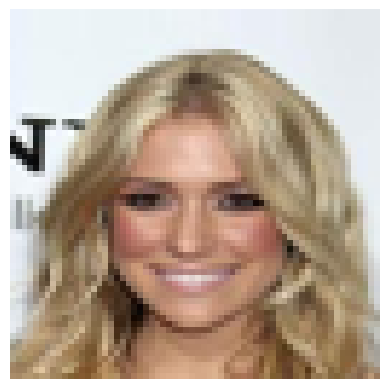

Accuracy: 1.0
Prediction: face | True label: face


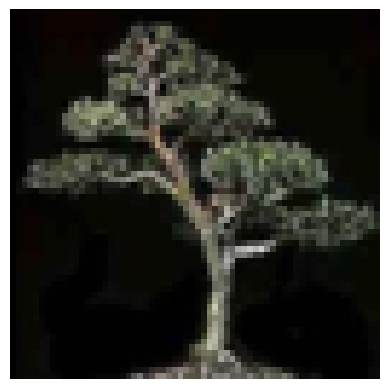

Accuracy: 1.0
Prediction: no_face | True label: no_face


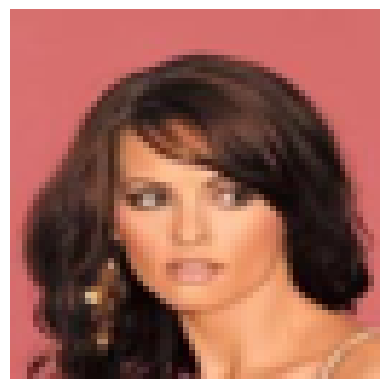

Accuracy: 1.0
Prediction: face | True label: face


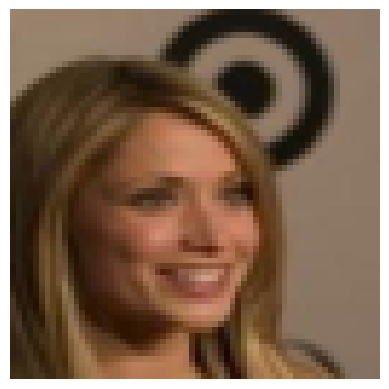

Accuracy: 1.0
Prediction: face | True label: face


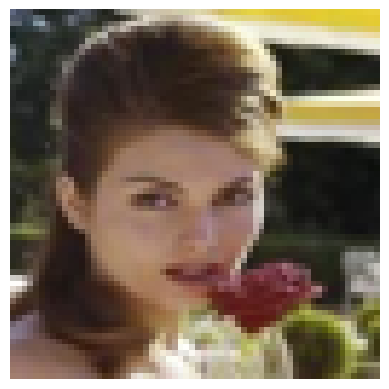

Accuracy: 1.0
Prediction: face | True label: face


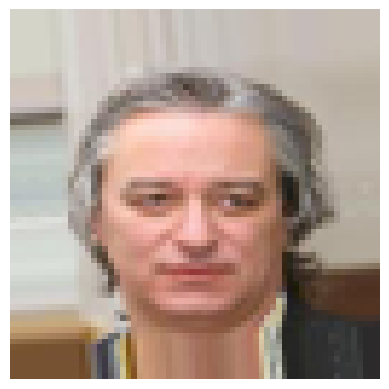

Accuracy: 1.0
Prediction: face | True label: face


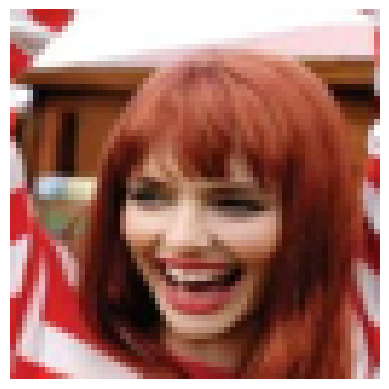

Accuracy: 1.0
Prediction: face | True label: face


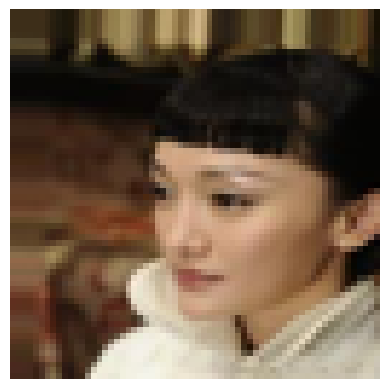

Accuracy: 1.0
Prediction: face | True label: face


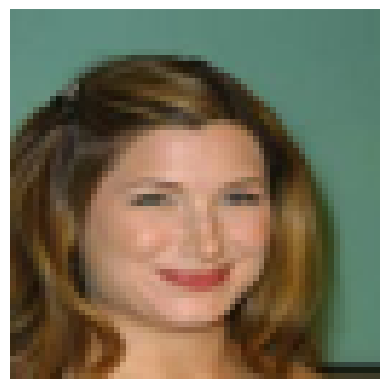

Accuracy: 1.0
Prediction: face | True label: face


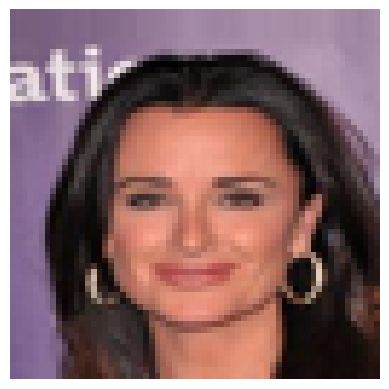

Accuracy: 1.0
Prediction: face | True label: face


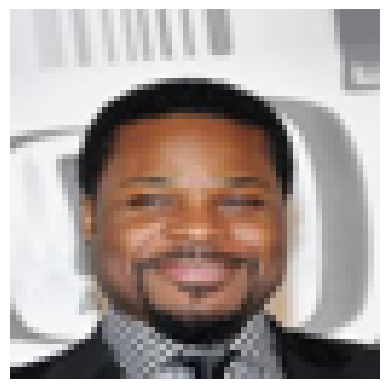

Accuracy: 1.0
Prediction: face | True label: face


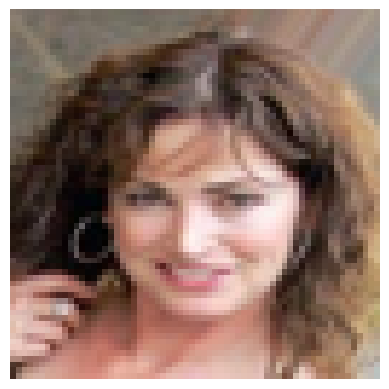

Accuracy: 1.0
Prediction: face | True label: face


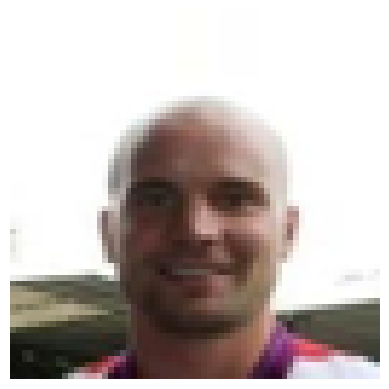

Accuracy: 0.0
Prediction: no_face | True label: face


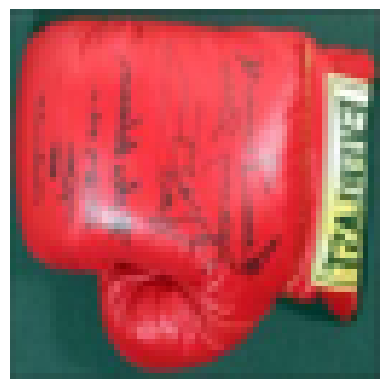

Accuracy: 0.0
Prediction: face | True label: no_face


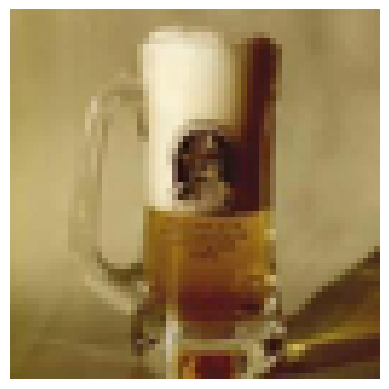

Accuracy: 1.0
Prediction: no_face | True label: no_face


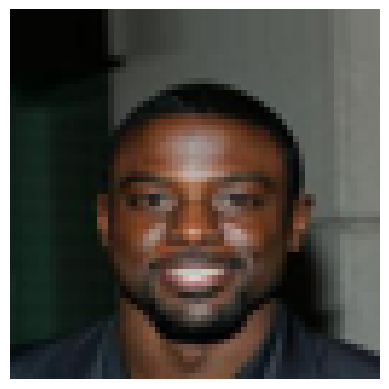

Accuracy: 1.0
Prediction: face | True label: face


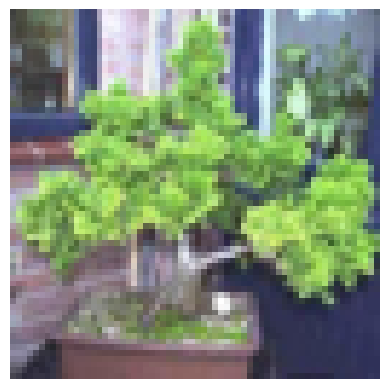

Accuracy: 1.0
Prediction: no_face | True label: no_face


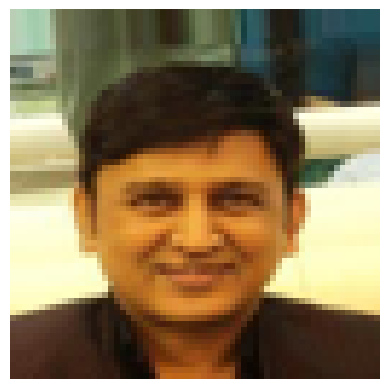

Accuracy: 1.0
Prediction: face | True label: face


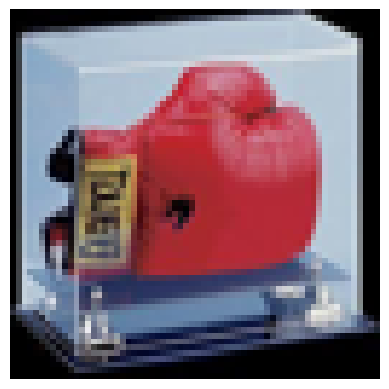

Accuracy: 0.0
Prediction: face | True label: no_face


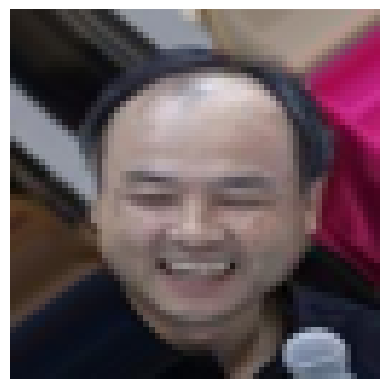

Accuracy: 1.0
Prediction: face | True label: face


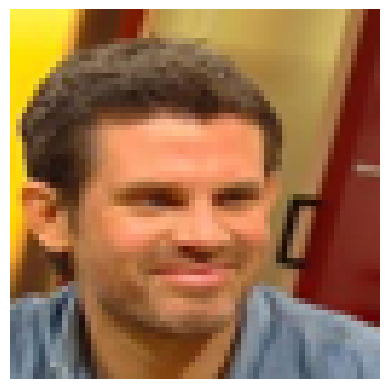

Accuracy: 1.0
Prediction: face | True label: face


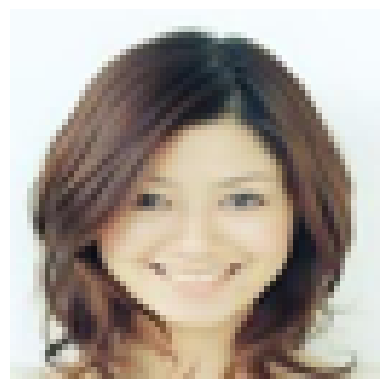

Accuracy: 1.0
Prediction: face | True label: face


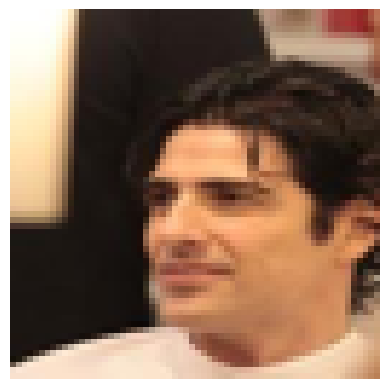

Accuracy: 1.0
Prediction: face | True label: face


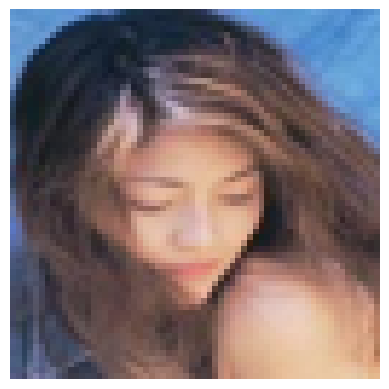

Accuracy: 1.0
Prediction: face | True label: face


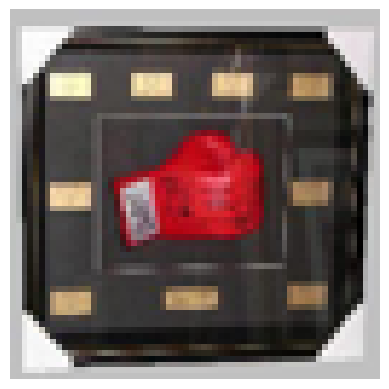

Accuracy: 1.0
Prediction: no_face | True label: no_face


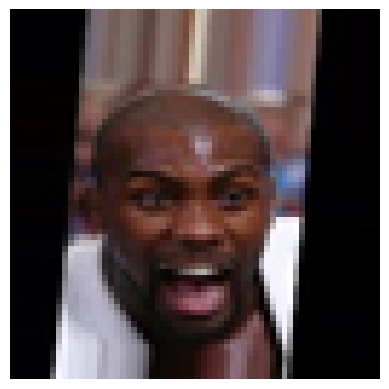

Accuracy: 1.0
Prediction: face | True label: face


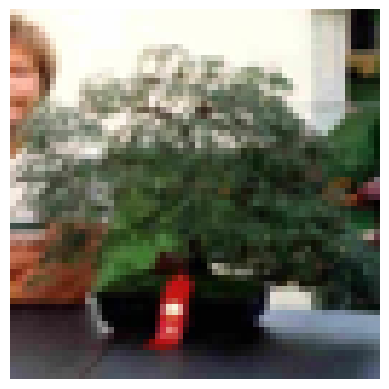

Accuracy: 1.0
Prediction: no_face | True label: no_face


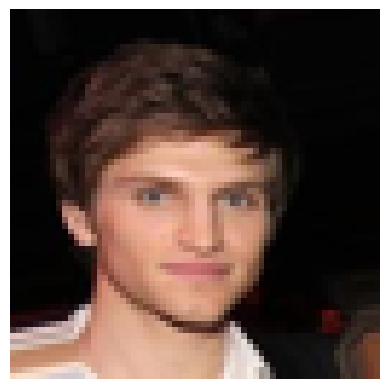

Accuracy: 1.0
Prediction: face | True label: face


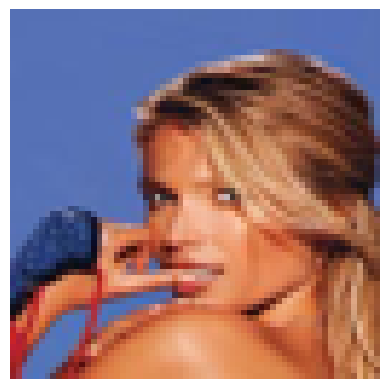

Accuracy: 1.0
Prediction: face | True label: face


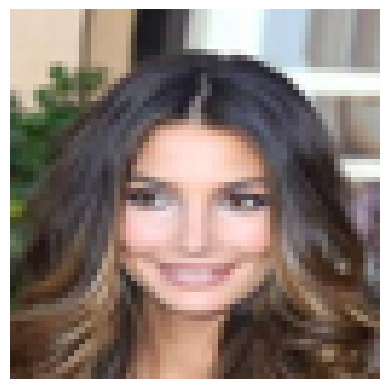

Accuracy: 1.0
Prediction: face | True label: face


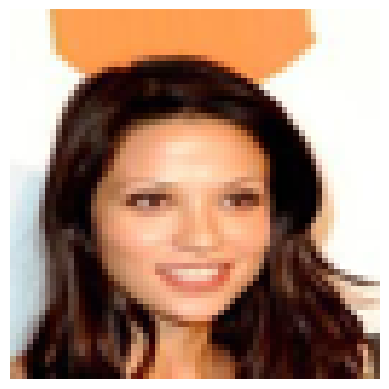

Accuracy: 1.0
Prediction: face | True label: face


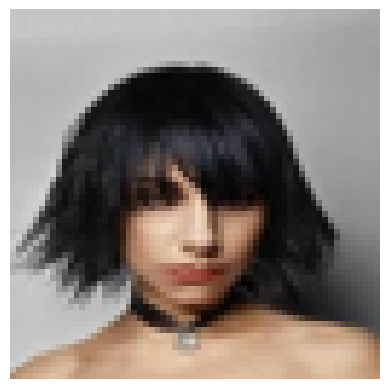

Accuracy: 1.0
Prediction: face | True label: face


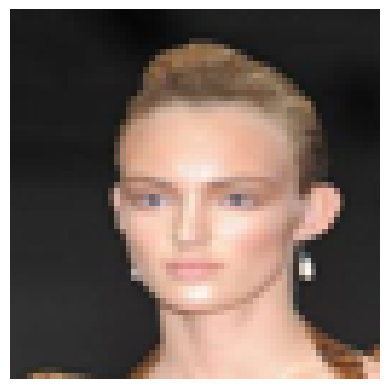

Accuracy: 1.0
Prediction: face | True label: face


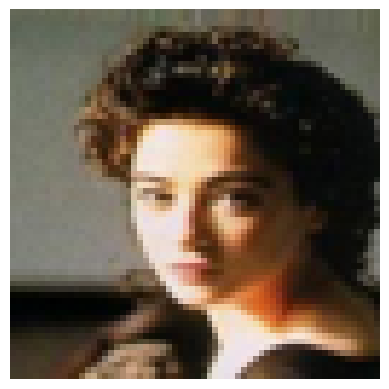

Accuracy: 1.0
Prediction: face | True label: face


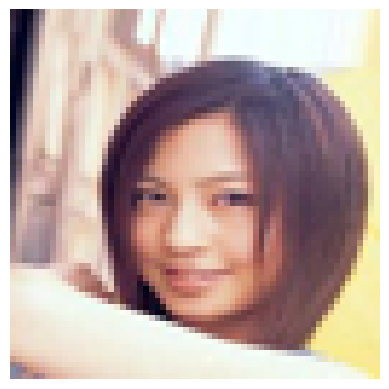

Accuracy: 1.0
Prediction: face | True label: face


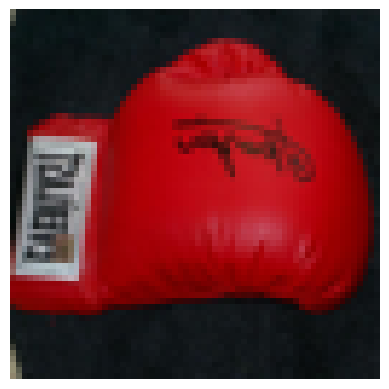

Accuracy: 0.0
Prediction: face | True label: no_face


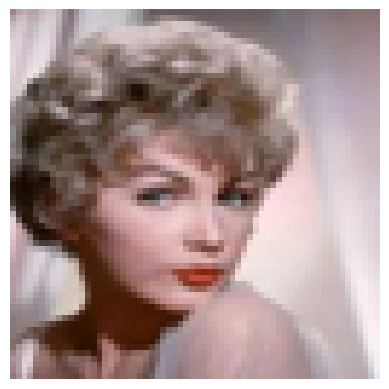

Accuracy: 1.0
Prediction: face | True label: face


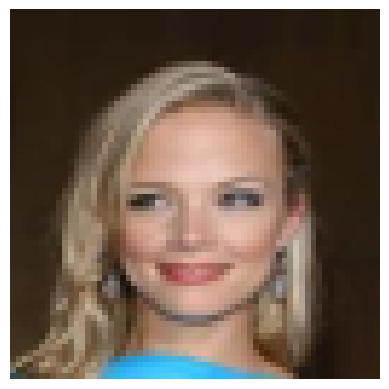

Accuracy: 1.0
Prediction: face | True label: face


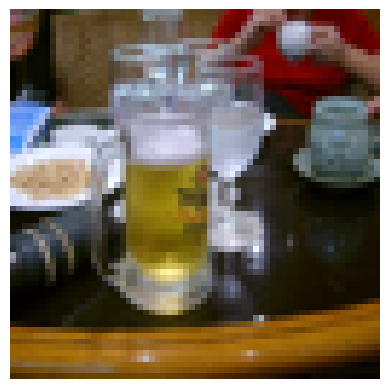

Accuracy: 1.0
Prediction: no_face | True label: no_face


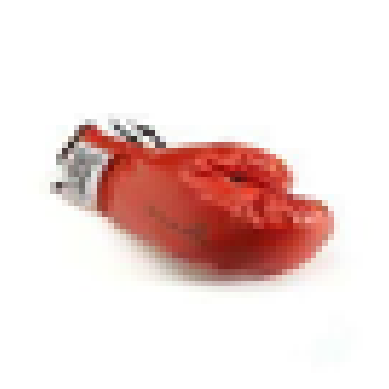

Accuracy: 1.0
Prediction: no_face | True label: no_face


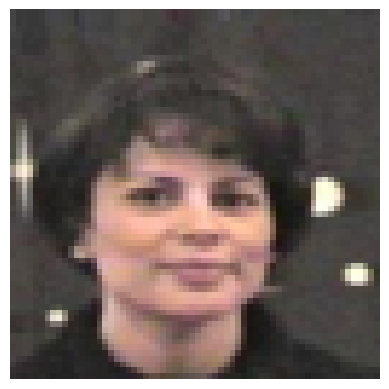

Accuracy: 1.0
Prediction: face | True label: face


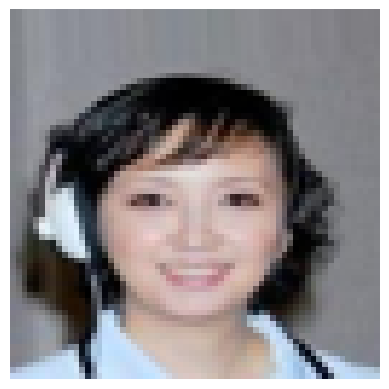

Accuracy: 1.0
Prediction: face | True label: face


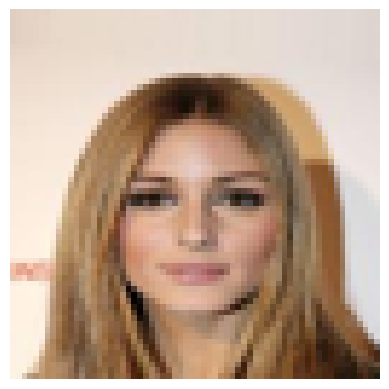

Accuracy: 1.0
Prediction: face | True label: face


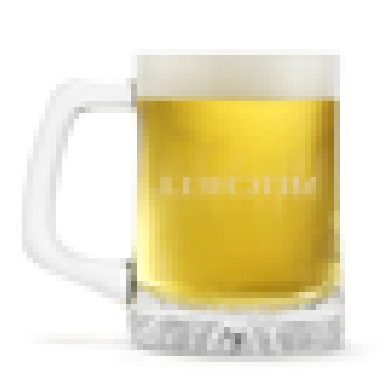

Accuracy: 1.0
Prediction: no_face | True label: no_face


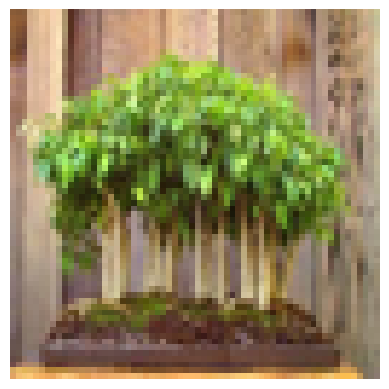

Accuracy: 1.0
Prediction: no_face | True label: no_face


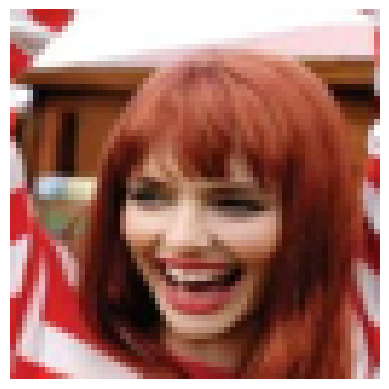

Accuracy: 1.0
Prediction: face | True label: face


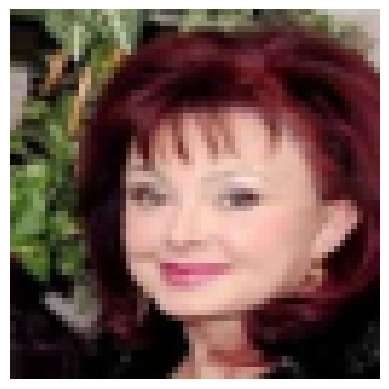

Accuracy: 1.0
Prediction: face | True label: face


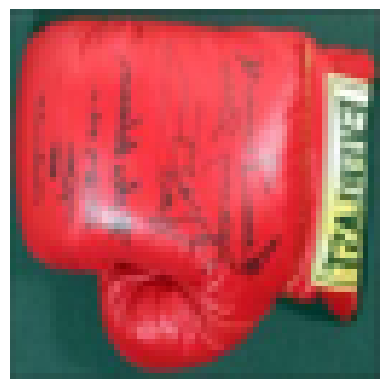

Accuracy: 0.0
Prediction: face | True label: no_face


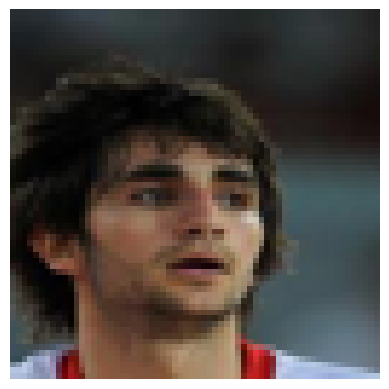

Accuracy: 1.0
Prediction: face | True label: face


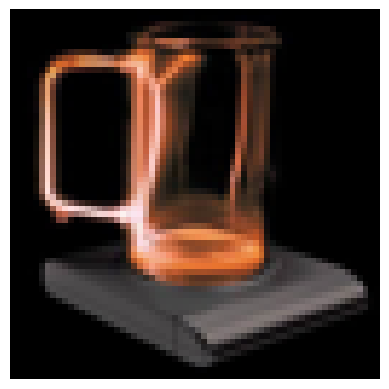

Accuracy: 0.0
Prediction: face | True label: no_face


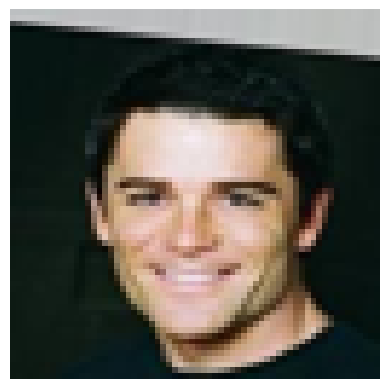

Accuracy: 1.0
Prediction: face | True label: face


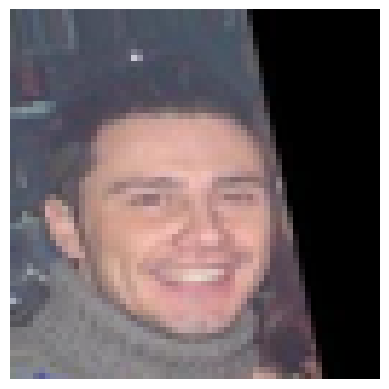

Accuracy: 1.0
Prediction: face | True label: face


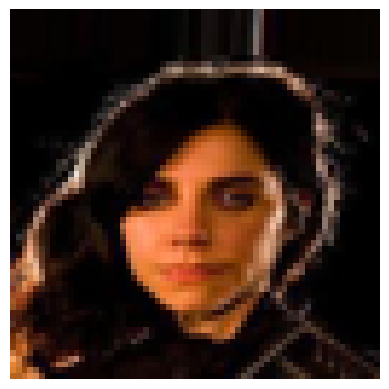

Accuracy: 1.0
Prediction: face | True label: face


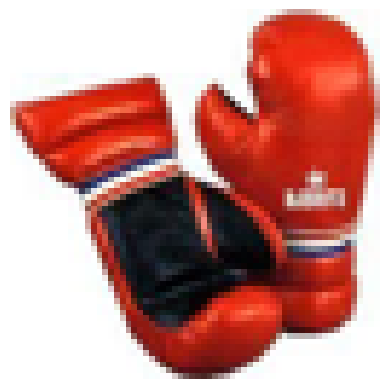

Accuracy: 1.0
Prediction: no_face | True label: no_face


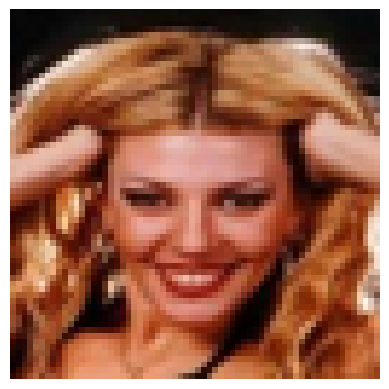

Accuracy: 1.0
Prediction: face | True label: face


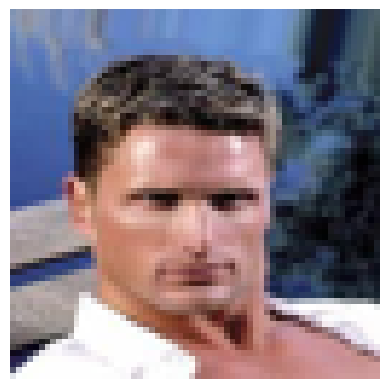

Accuracy: 1.0
Prediction: face | True label: face


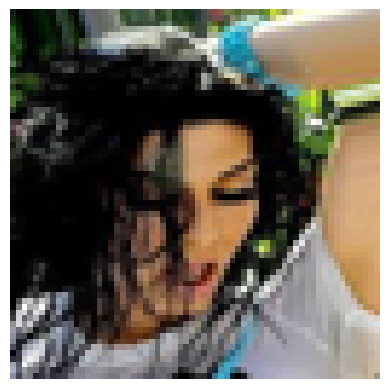

Accuracy: 1.0
Prediction: face | True label: face


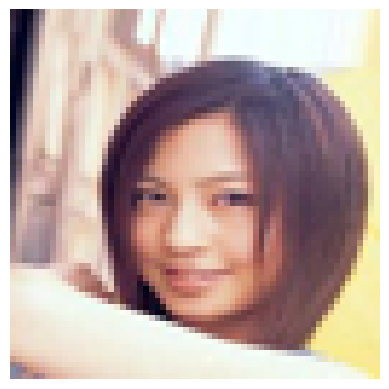

Accuracy: 1.0
Prediction: face | True label: face


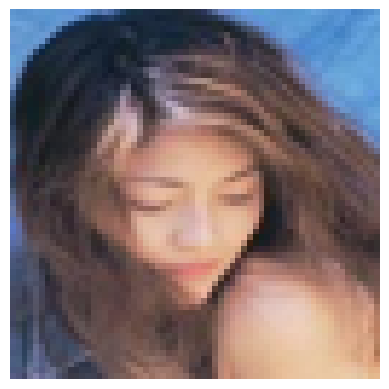

Accuracy: 1.0
Prediction: face | True label: face


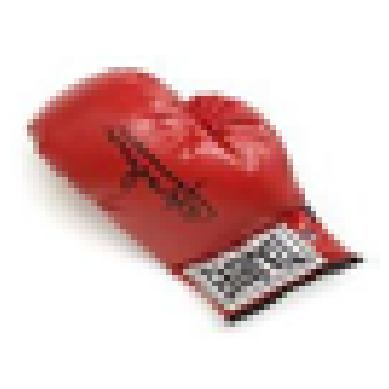

Accuracy: 1.0
Prediction: no_face | True label: no_face


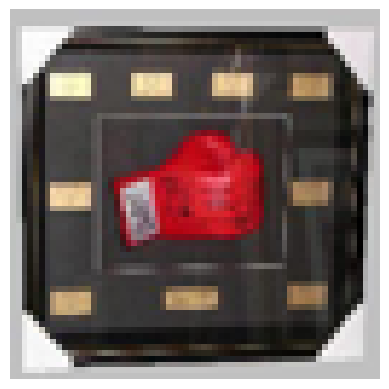

Accuracy: 1.0
Prediction: no_face | True label: no_face


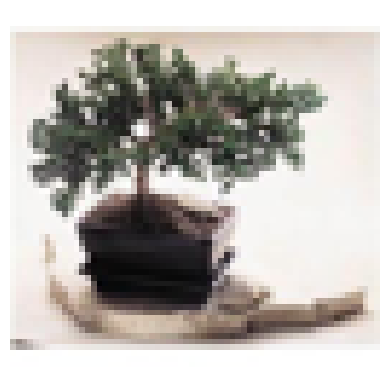

Accuracy: 1.0
Prediction: no_face | True label: no_face


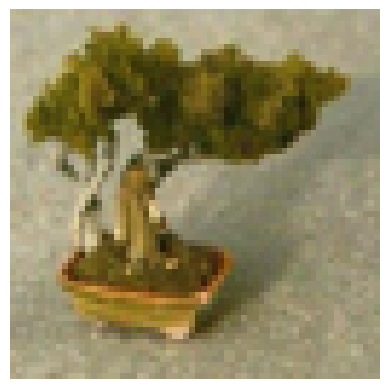

Accuracy: 1.0
Prediction: no_face | True label: no_face


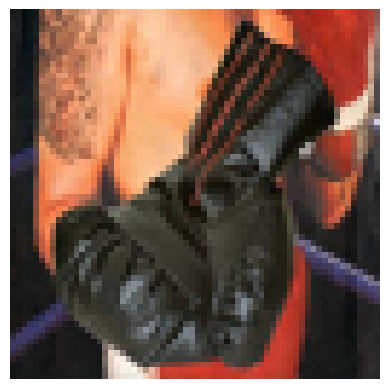

Accuracy: 1.0
Prediction: no_face | True label: no_face


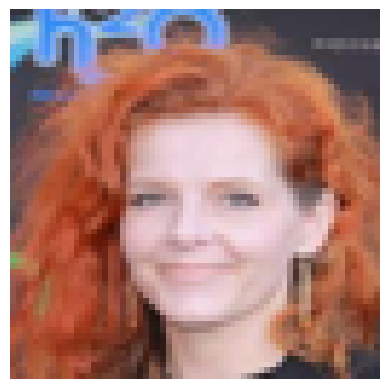

Accuracy: 1.0
Prediction: face | True label: face


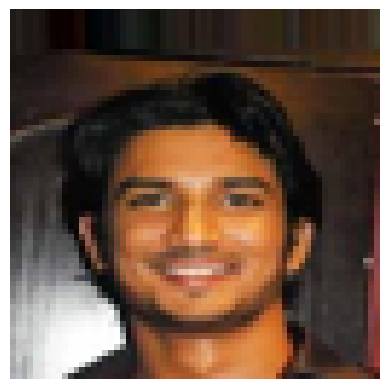

Accuracy: 1.0
Prediction: face | True label: face


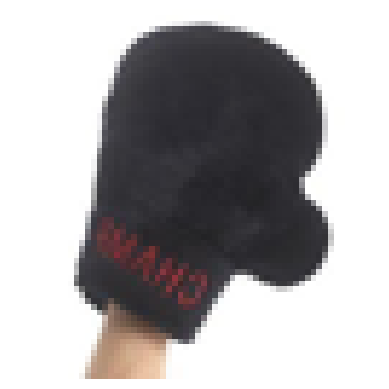

Accuracy: 1.0
Prediction: no_face | True label: no_face


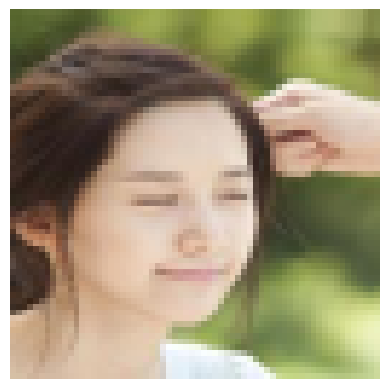

Accuracy: 0.0
Prediction: no_face | True label: face


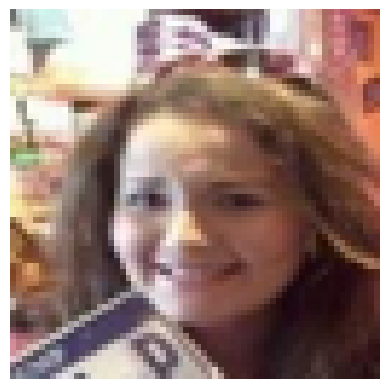

Accuracy: 1.0
Prediction: face | True label: face


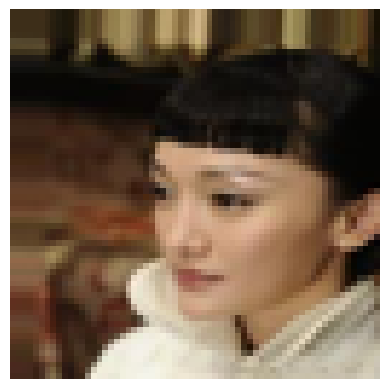

Accuracy: 1.0
Prediction: face | True label: face


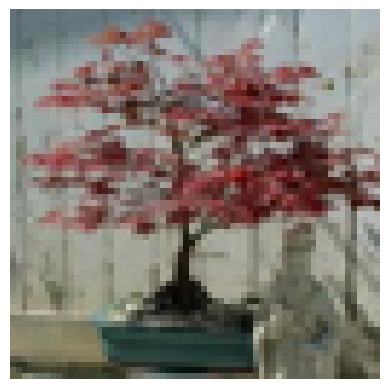

Accuracy: 0.0
Prediction: face | True label: no_face


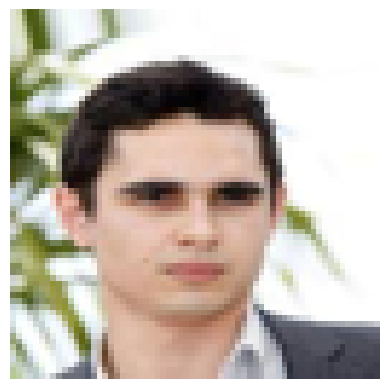

Accuracy: 1.0
Prediction: face | True label: face


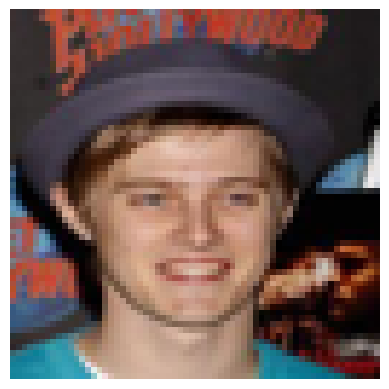

Accuracy: 1.0
Prediction: face | True label: face


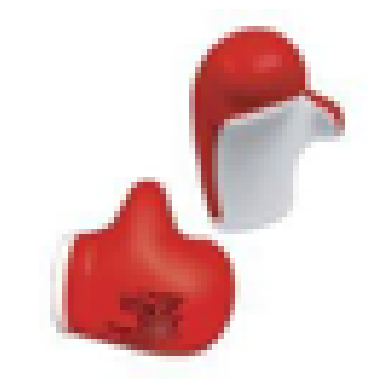

Accuracy: 1.0
Prediction: no_face | True label: no_face


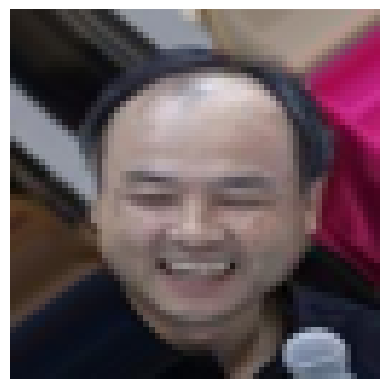

Accuracy: 1.0
Prediction: face | True label: face


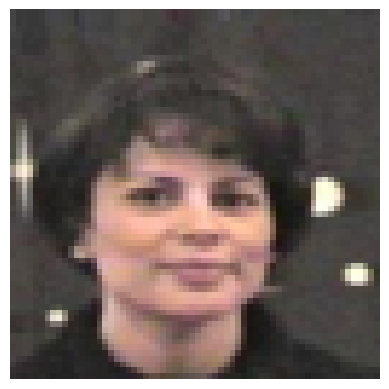

Accuracy: 1.0
Prediction: face | True label: face


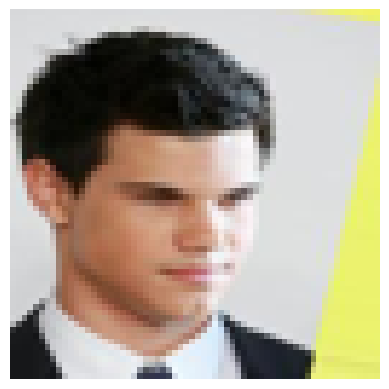

Accuracy: 1.0
Prediction: face | True label: face


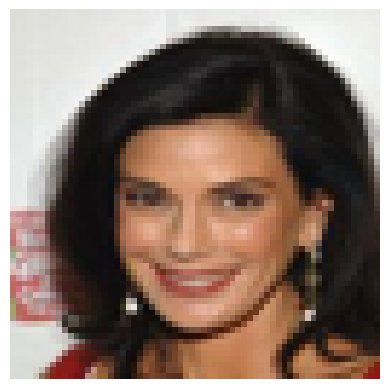

Accuracy: 1.0
Prediction: face | True label: face


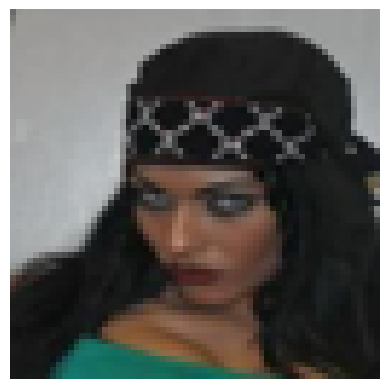

Accuracy: 0.0
Prediction: no_face | True label: face


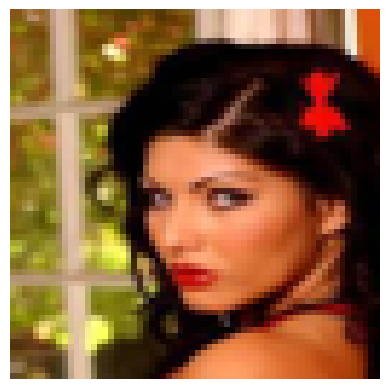

Accuracy: 1.0
Prediction: face | True label: face


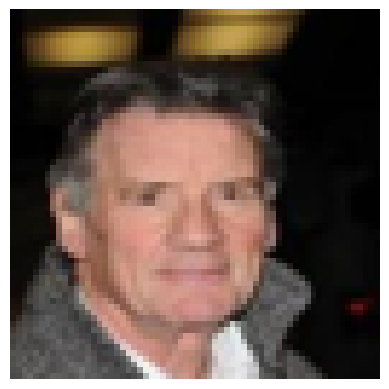

Accuracy: 1.0
Prediction: face | True label: face


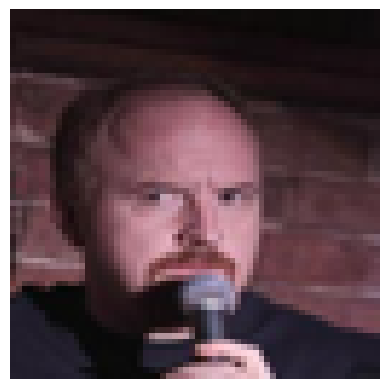

Accuracy: 1.0
Prediction: face | True label: face


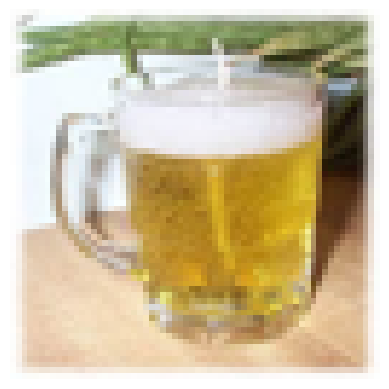

Accuracy: 1.0
Prediction: no_face | True label: no_face


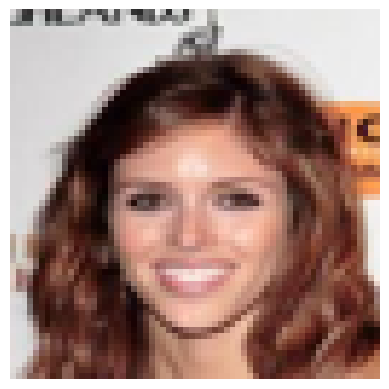

Accuracy: 1.0
Prediction: face | True label: face


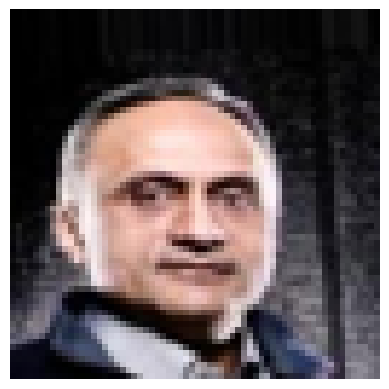

Accuracy: 1.0
Prediction: face | True label: face


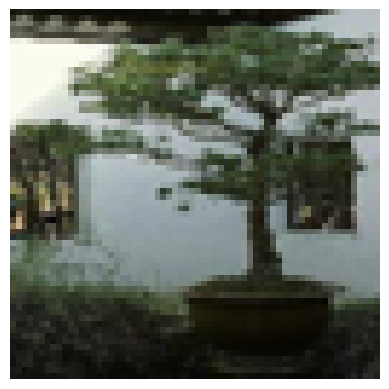

Accuracy: 1.0
Prediction: no_face | True label: no_face


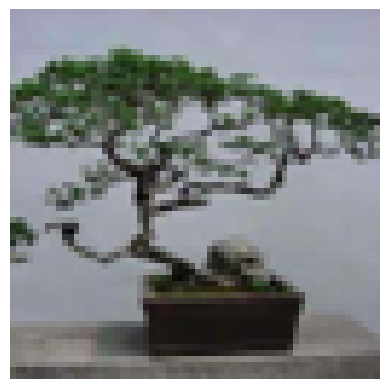

Accuracy: 1.0
Prediction: no_face | True label: no_face


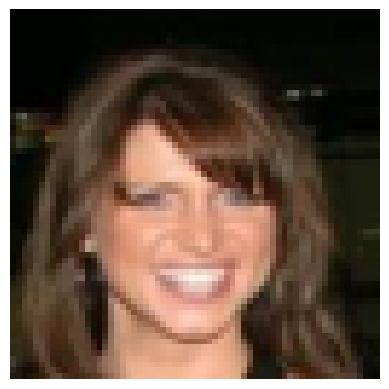

Accuracy: 1.0
Prediction: face | True label: face


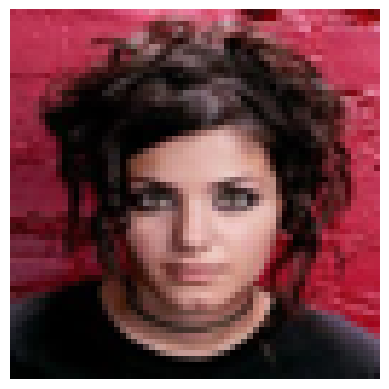

Accuracy: 1.0
Prediction: face | True label: face


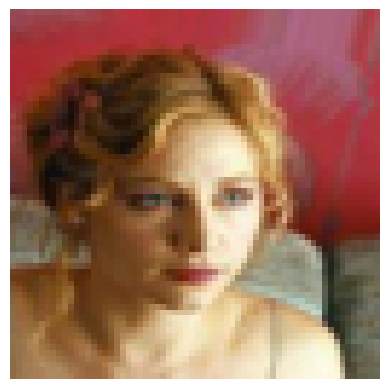

Accuracy: 1.0
Prediction: face | True label: face


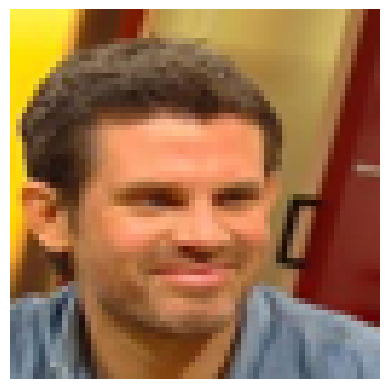

Accuracy: 1.0
Prediction: face | True label: face


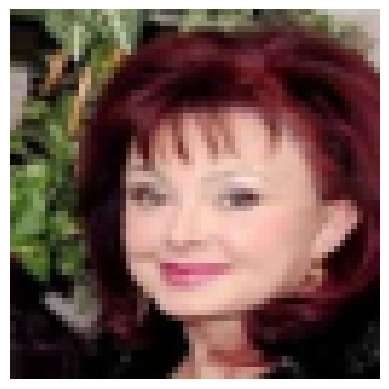

Accuracy: 1.0
Prediction: face | True label: face


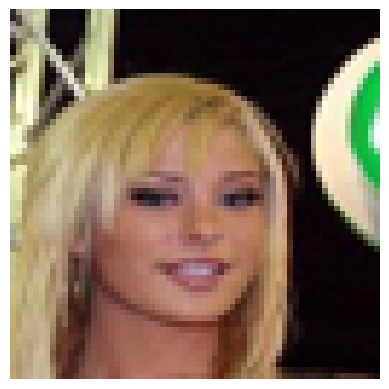

Accuracy: 1.0
Prediction: face | True label: face


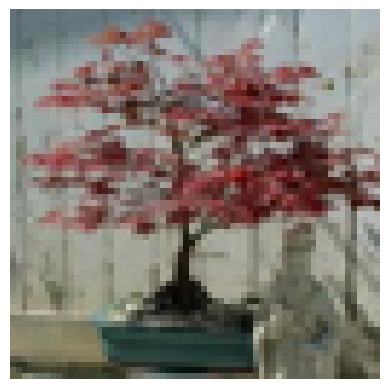

Accuracy: 0.0
Prediction: face | True label: no_face


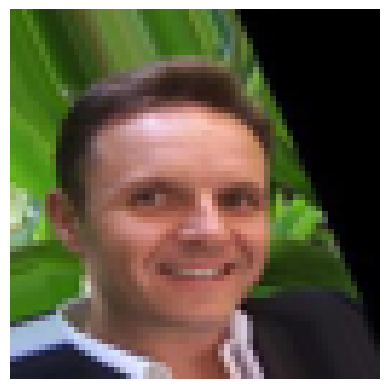

Accuracy: 1.0
Prediction: face | True label: face


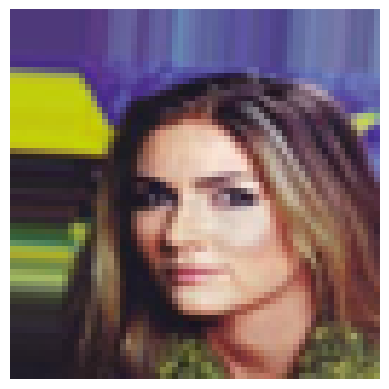

Accuracy: 1.0
Prediction: face | True label: face


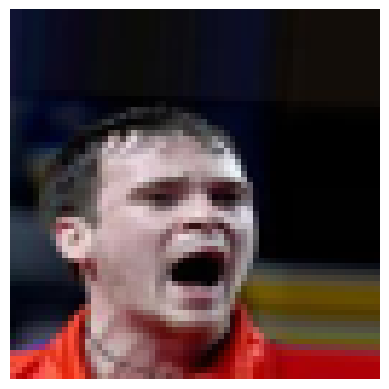

Accuracy: 1.0
Prediction: face | True label: face


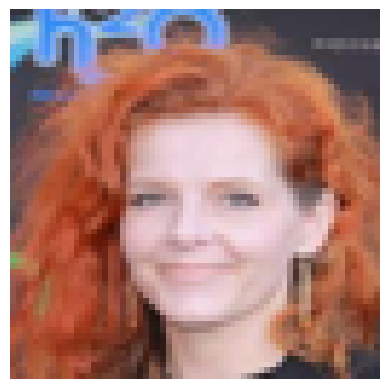

Accuracy: 1.0
Prediction: face | True label: face


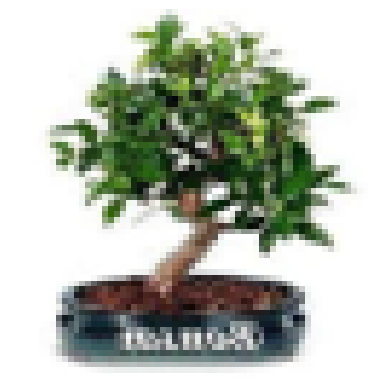

Accuracy: 1.0
Prediction: no_face | True label: no_face


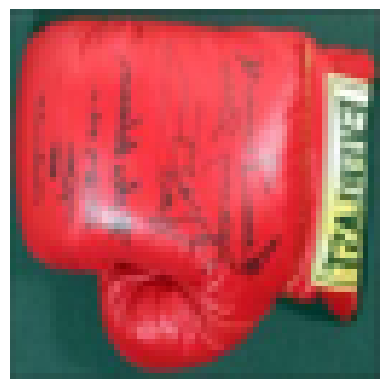

Accuracy: 0.0
Prediction: face | True label: no_face


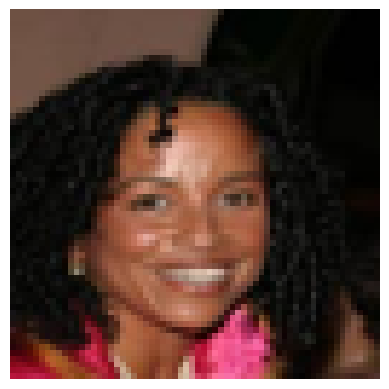

Accuracy: 1.0
Prediction: face | True label: face


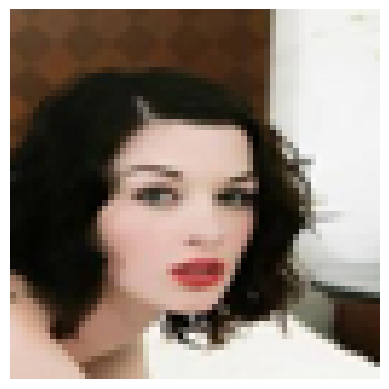

Accuracy: 1.0
Prediction: face | True label: face


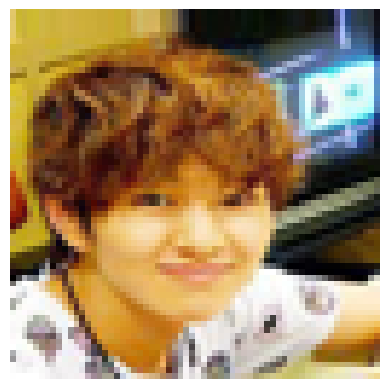

Accuracy: 1.0
Prediction: face | True label: face


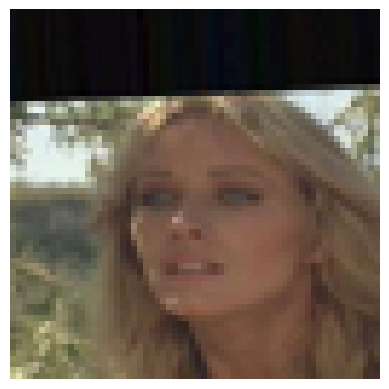

Accuracy: 1.0
Prediction: face | True label: face


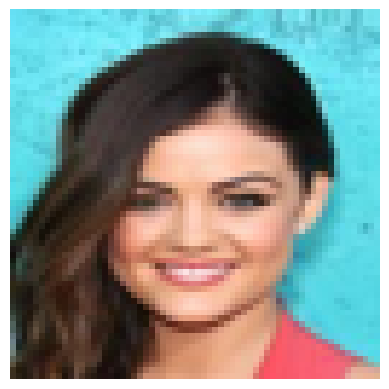

Accuracy: 1.0
Prediction: face | True label: face


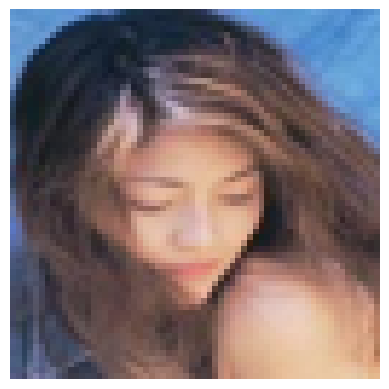

Accuracy: 1.0
Prediction: face | True label: face


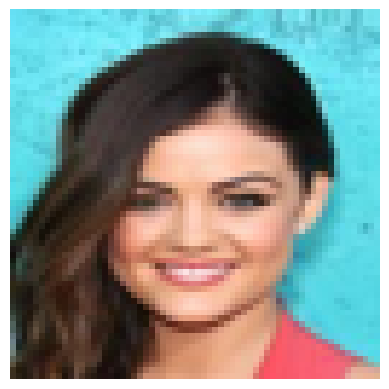

Accuracy: 1.0
Prediction: face | True label: face


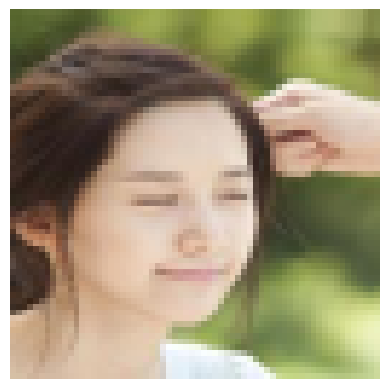

Accuracy: 0.0
Prediction: no_face | True label: face


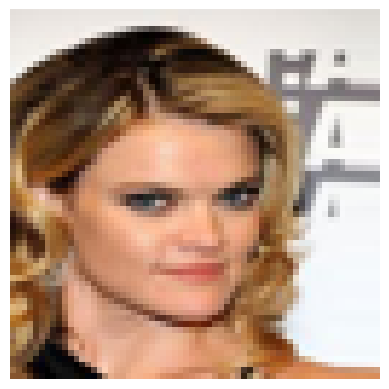

Accuracy: 1.0
Prediction: face | True label: face


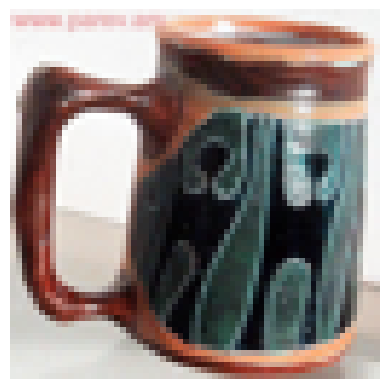

Accuracy: 1.0
Prediction: no_face | True label: no_face


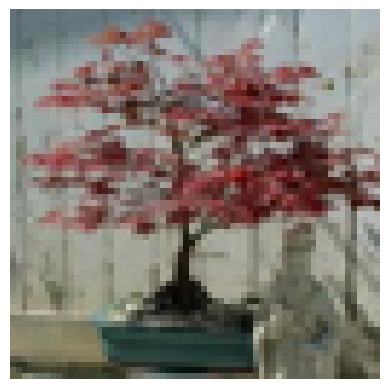

Accuracy: 0.0
Prediction: face | True label: no_face


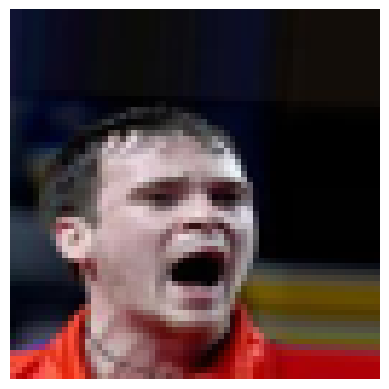

Accuracy: 1.0
Prediction: face | True label: face


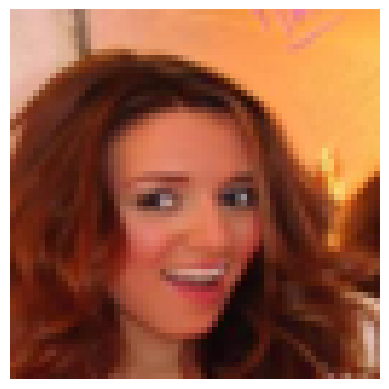

Accuracy: 1.0
Prediction: face | True label: face


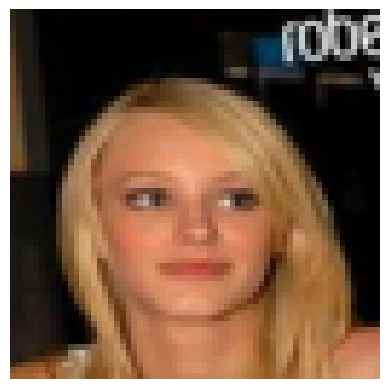

Accuracy: 1.0
Prediction: face | True label: face


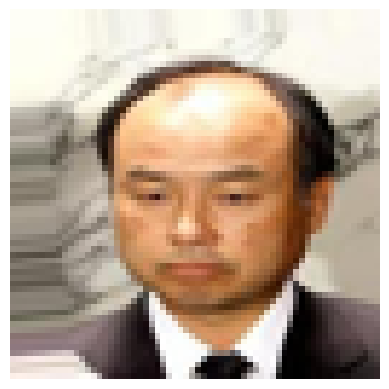

Accuracy: 0.0
Prediction: no_face | True label: face


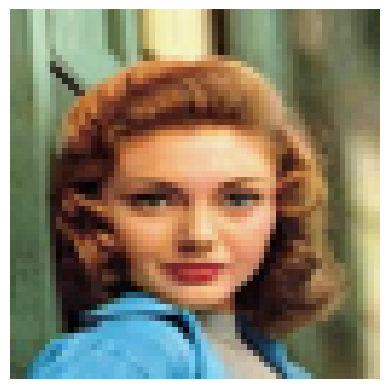

Accuracy: 1.0
Prediction: face | True label: face


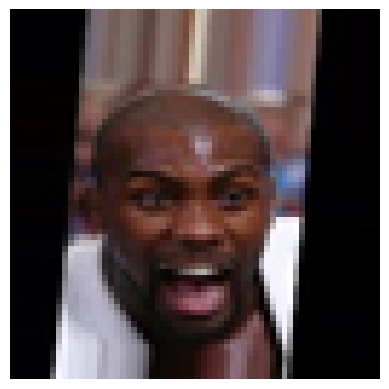

Accuracy: 1.0
Prediction: face | True label: face


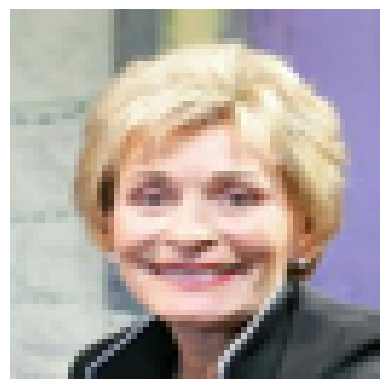

Accuracy: 1.0
Prediction: face | True label: face


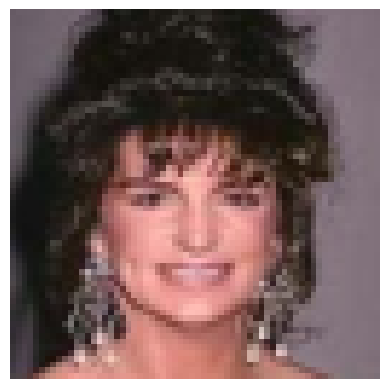

Accuracy: 1.0
Prediction: face | True label: face


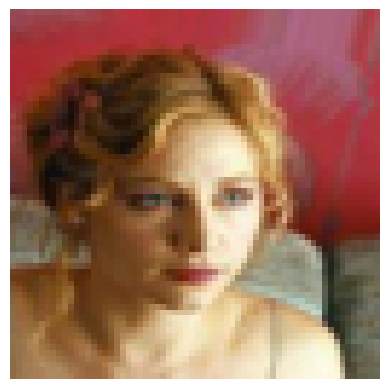

Accuracy: 1.0
Prediction: face | True label: face


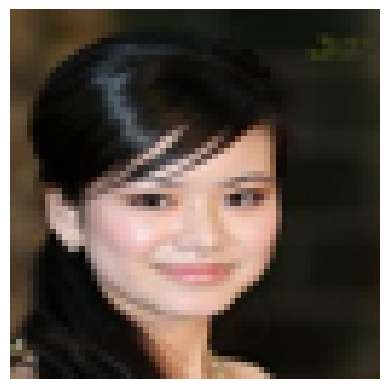

Accuracy: 1.0
Prediction: face | True label: face


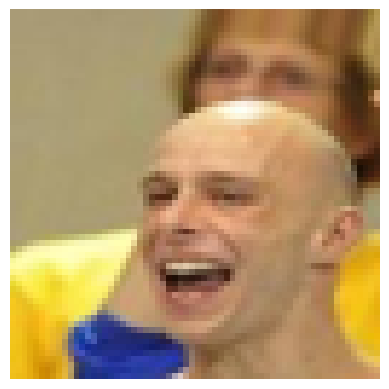

Accuracy: 0.0
Prediction: no_face | True label: face


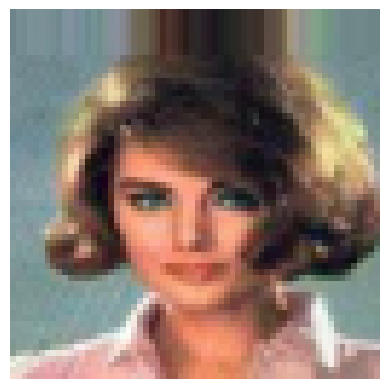

Accuracy: 1.0
Prediction: face | True label: face


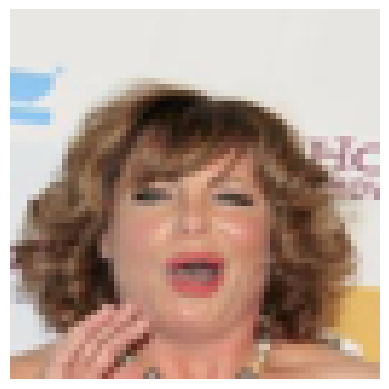

Accuracy: 1.0
Prediction: face | True label: face


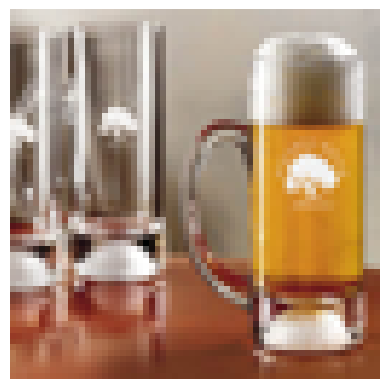

Accuracy: 1.0
Prediction: no_face | True label: no_face


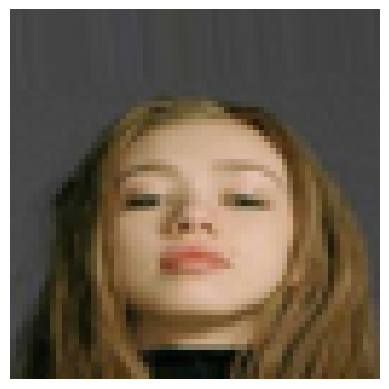

Accuracy: 1.0
Prediction: face | True label: face


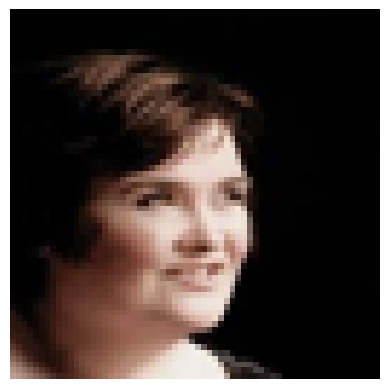

Accuracy: 1.0
Prediction: face | True label: face


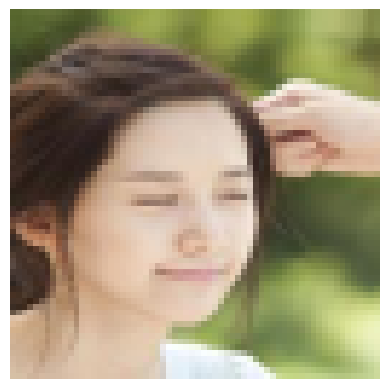

Accuracy: 0.0
Prediction: no_face | True label: face


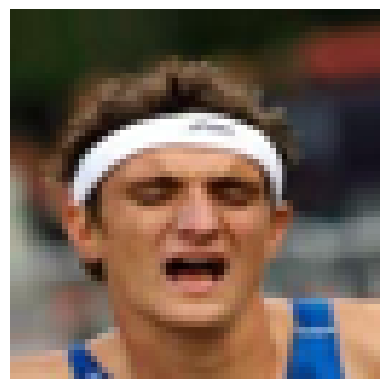

Accuracy: 1.0
Prediction: face | True label: face


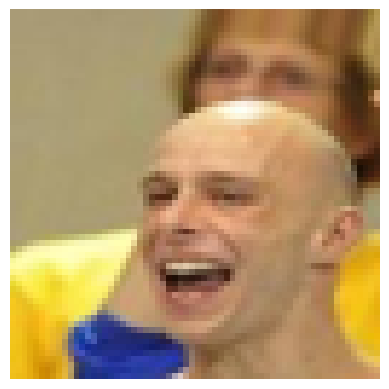

Accuracy: 0.0
Prediction: no_face | True label: face


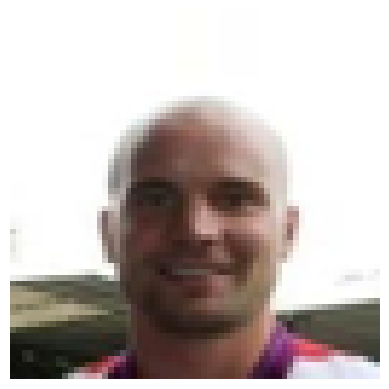

Accuracy: 0.0
Prediction: no_face | True label: face


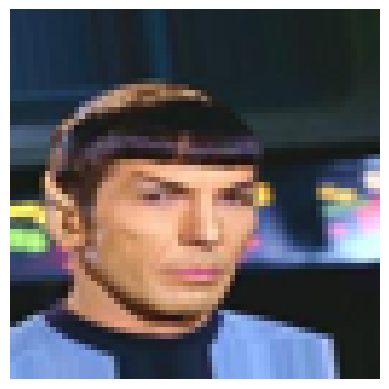

Accuracy: 1.0
Prediction: face | True label: face


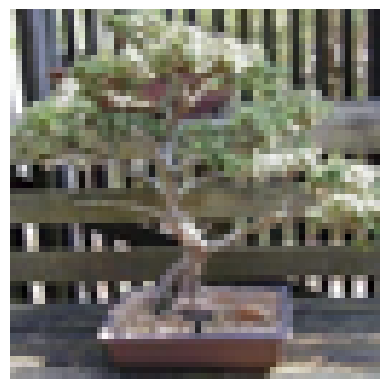

Accuracy: 1.0
Prediction: no_face | True label: no_face


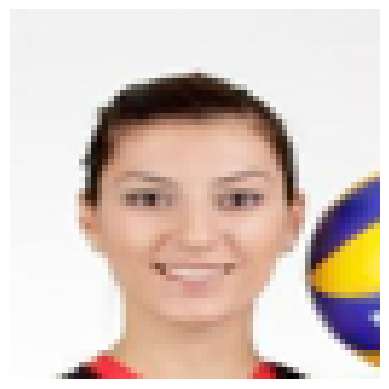

Accuracy: 1.0
Prediction: face | True label: face


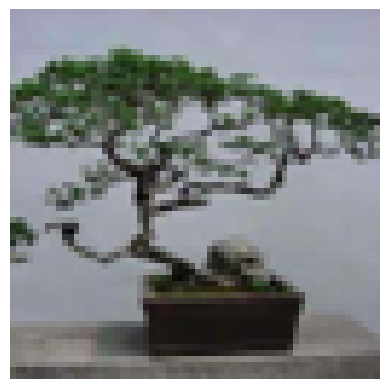

Accuracy: 1.0
Prediction: no_face | True label: no_face


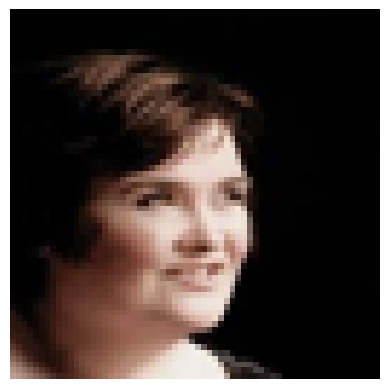

Accuracy: 1.0
Prediction: face | True label: face


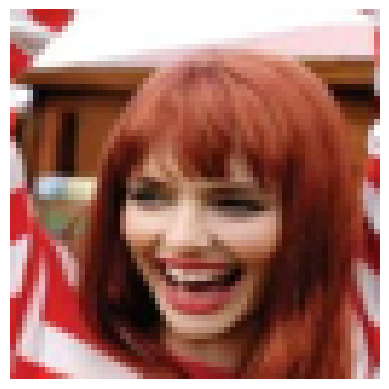

Accuracy: 1.0
Prediction: face | True label: face


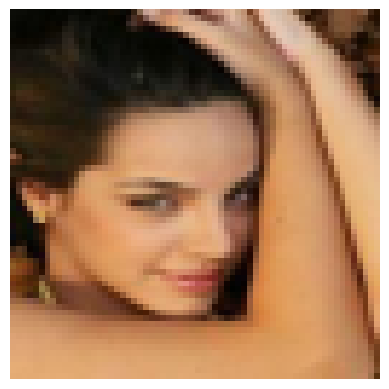

Accuracy: 1.0
Prediction: face | True label: face


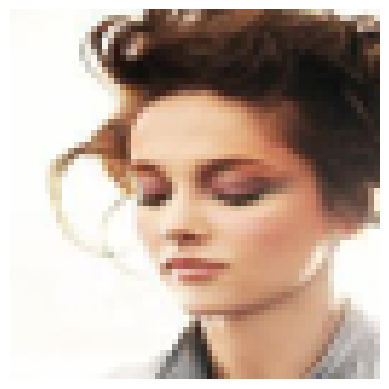

Accuracy: 0.0
Prediction: no_face | True label: face


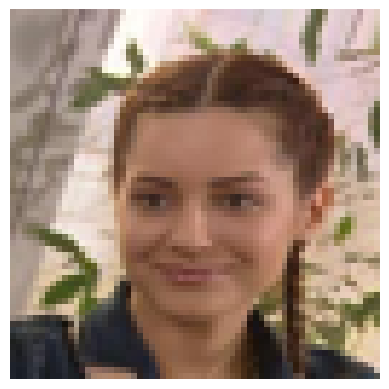

Accuracy: 1.0
Prediction: face | True label: face


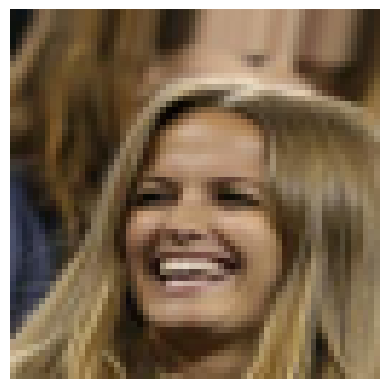

Accuracy: 1.0
Prediction: face | True label: face


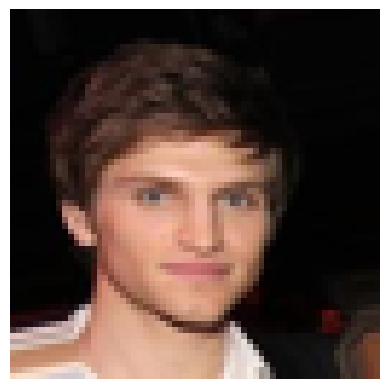

Accuracy: 1.0
Prediction: face | True label: face


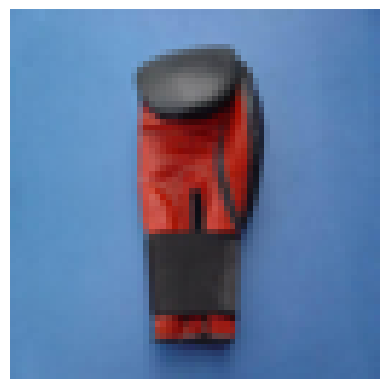

Accuracy: 1.0
Prediction: no_face | True label: no_face


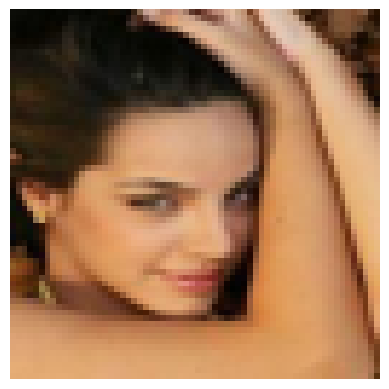

Accuracy: 1.0
Prediction: face | True label: face


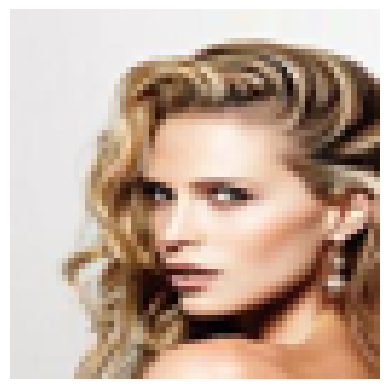

Accuracy: 1.0
Prediction: face | True label: face


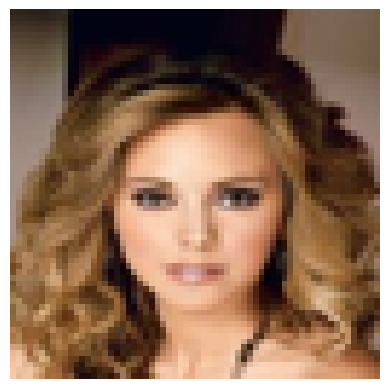

Accuracy: 1.0
Prediction: face | True label: face


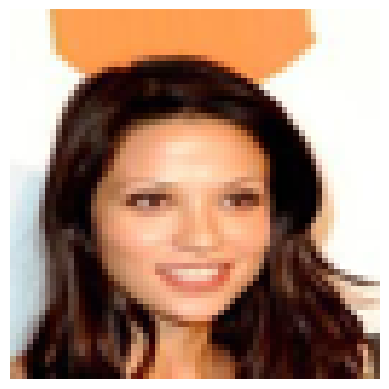

Accuracy: 1.0
Prediction: face | True label: face


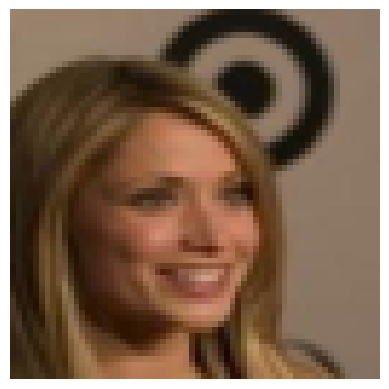

Accuracy: 1.0
Prediction: face | True label: face


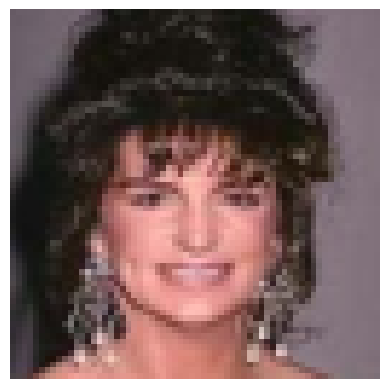

Accuracy: 1.0
Prediction: face | True label: face


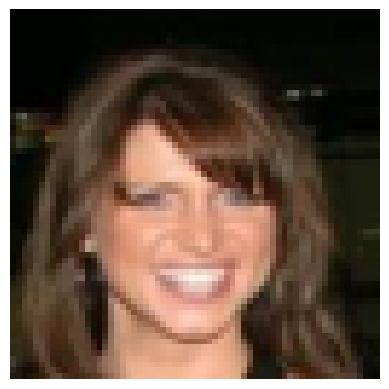

Accuracy: 1.0
Prediction: face | True label: face


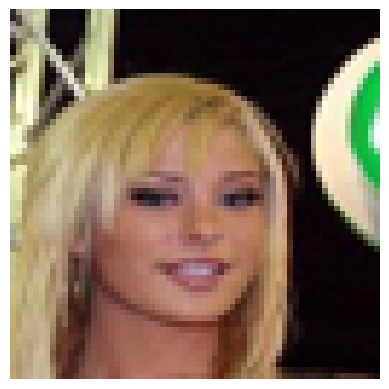

Accuracy: 1.0
Prediction: face | True label: face


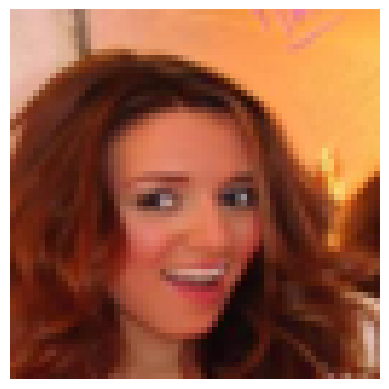

Accuracy: 1.0
Prediction: face | True label: face


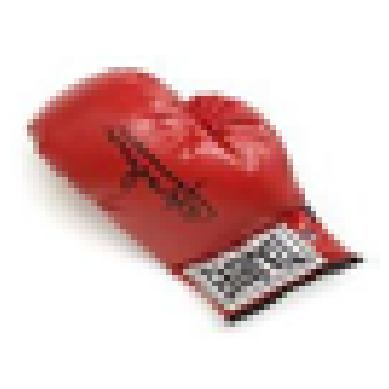

Accuracy: 1.0
Prediction: no_face | True label: no_face


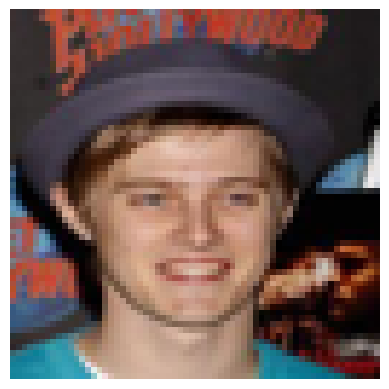

Accuracy: 1.0
Prediction: face | True label: face


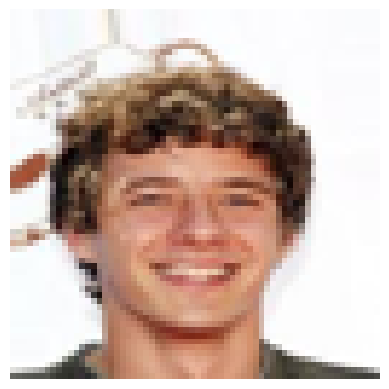

Accuracy: 1.0
Prediction: face | True label: face


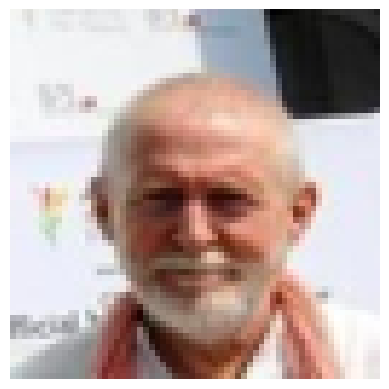

Accuracy: 0.0
Prediction: no_face | True label: face


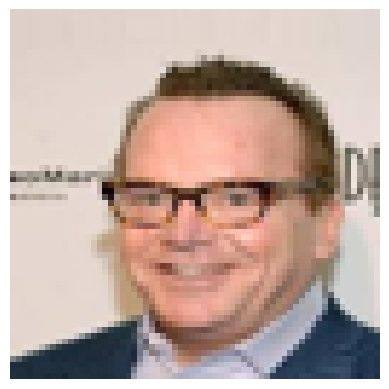

Accuracy: 1.0
Prediction: face | True label: face


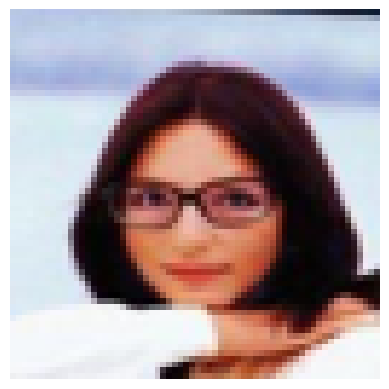

Accuracy: 1.0
Prediction: face | True label: face


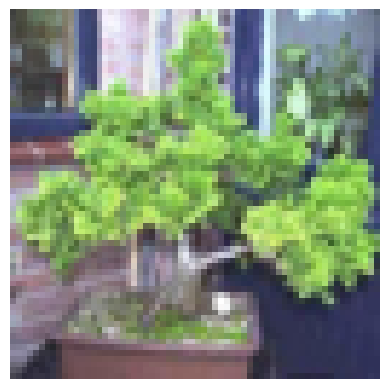

Accuracy: 1.0
Prediction: no_face | True label: no_face


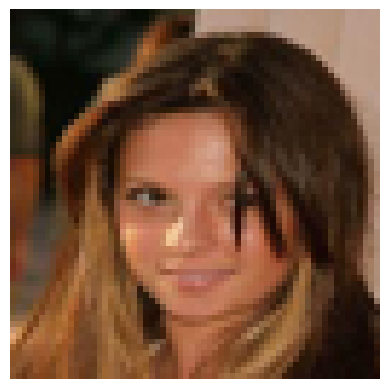

Accuracy: 1.0
Prediction: face | True label: face


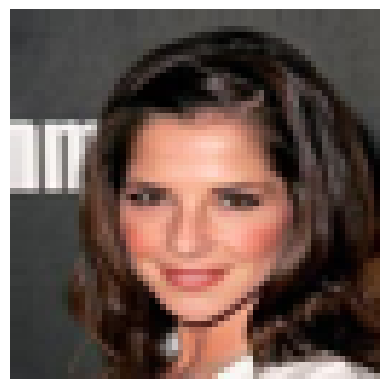

Accuracy: 1.0
Prediction: face | True label: face


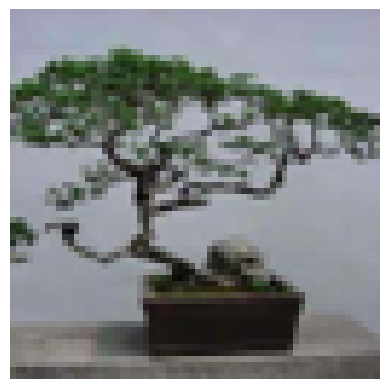

Accuracy: 1.0
Prediction: no_face | True label: no_face


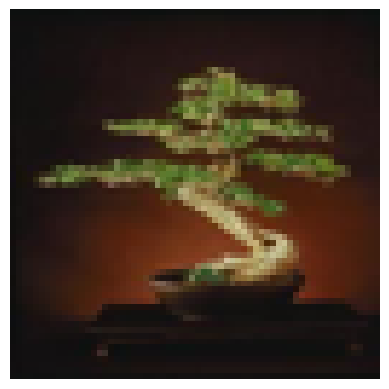

Accuracy: 0.0
Prediction: face | True label: no_face


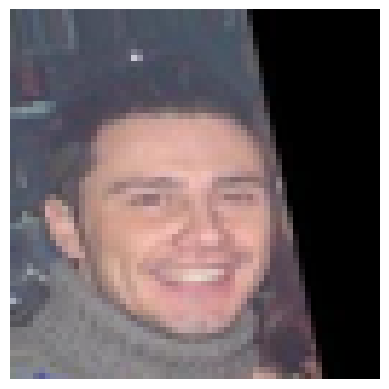

Accuracy: 1.0
Prediction: face | True label: face


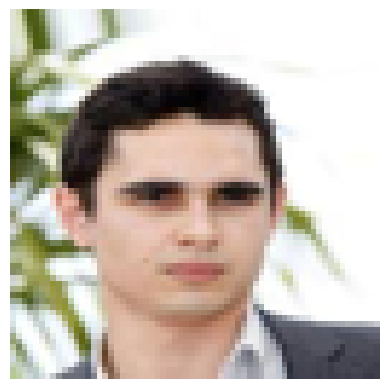

Accuracy: 1.0
Prediction: face | True label: face


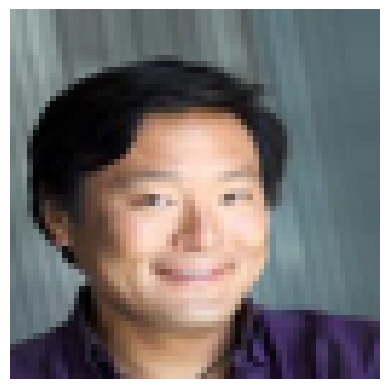

Accuracy: 1.0
Prediction: face | True label: face


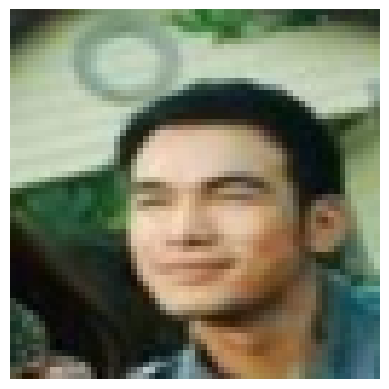

Accuracy: 1.0
Prediction: face | True label: face


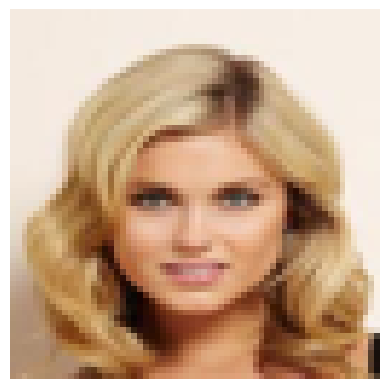

Accuracy: 1.0
Prediction: face | True label: face


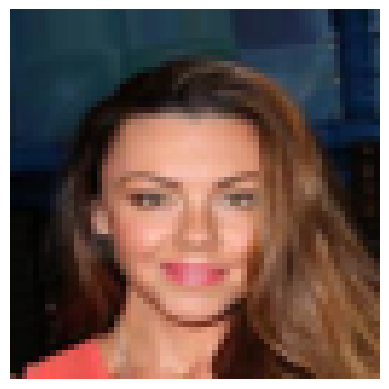

Accuracy: 1.0
Prediction: face | True label: face


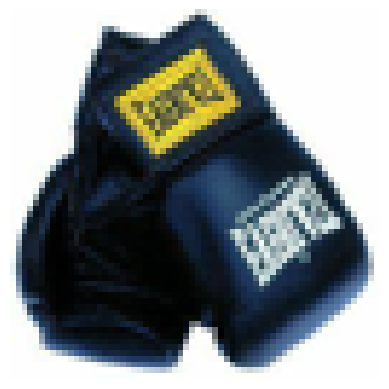

Accuracy: 1.0
Prediction: no_face | True label: no_face


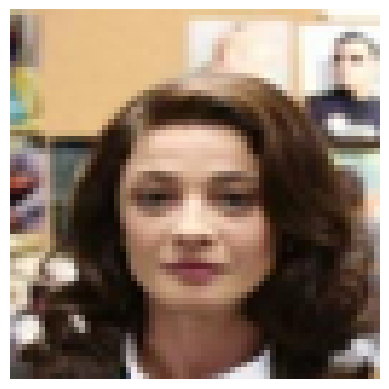

Accuracy: 1.0
Prediction: face | True label: face


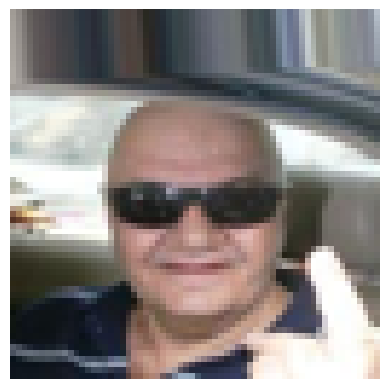

Accuracy: 1.0
Prediction: face | True label: face


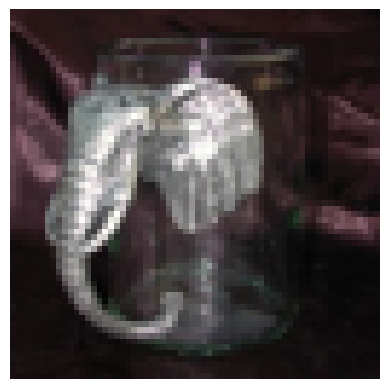

Accuracy: 1.0
Prediction: no_face | True label: no_face


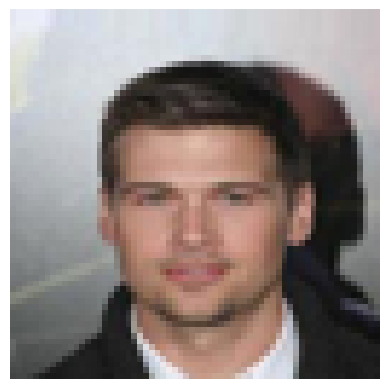

Accuracy: 1.0
Prediction: face | True label: face


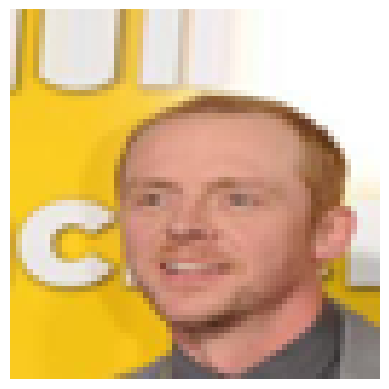

Accuracy: 1.0
Prediction: face | True label: face


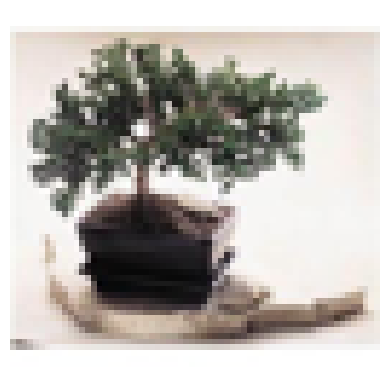

Accuracy: 1.0
Prediction: no_face | True label: no_face


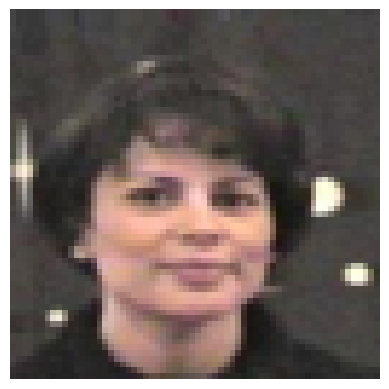

Accuracy: 1.0
Prediction: face | True label: face


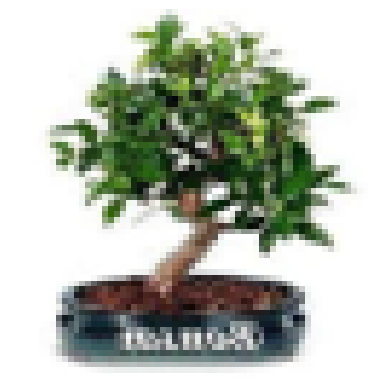

Accuracy: 1.0
Prediction: no_face | True label: no_face


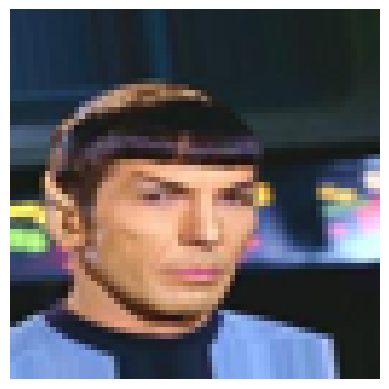

Accuracy: 1.0
Prediction: face | True label: face


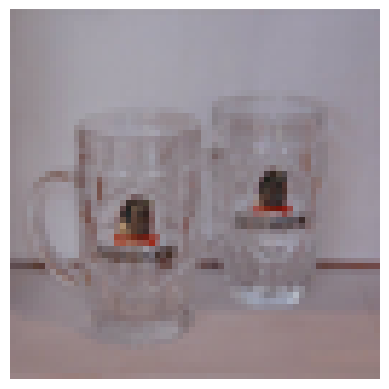

Accuracy: 1.0
Prediction: no_face | True label: no_face


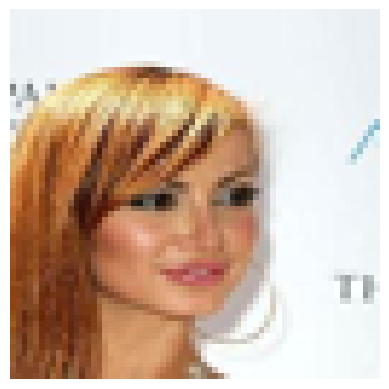

Accuracy: 1.0
Prediction: face | True label: face


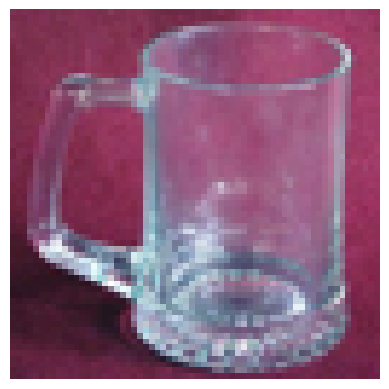

Accuracy: 0.0
Prediction: face | True label: no_face


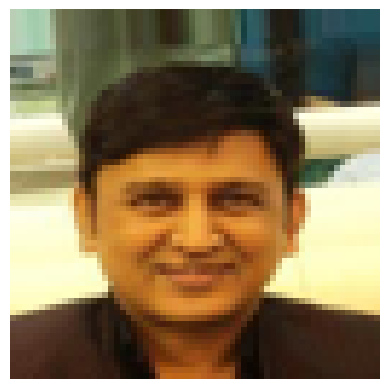

Accuracy: 1.0
Prediction: face | True label: face


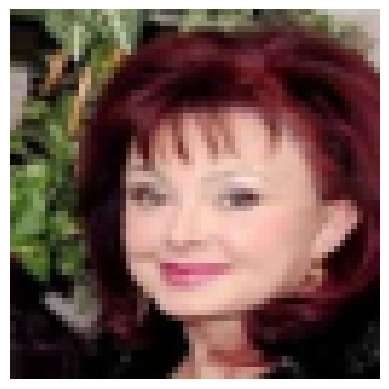

Accuracy: 1.0
Prediction: face | True label: face


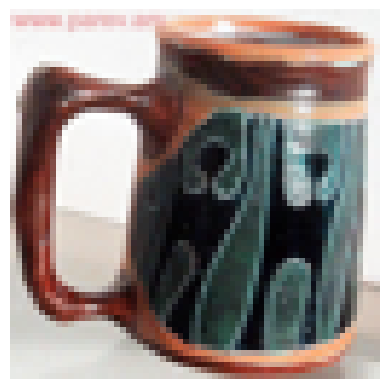

Accuracy: 1.0
Prediction: no_face | True label: no_face


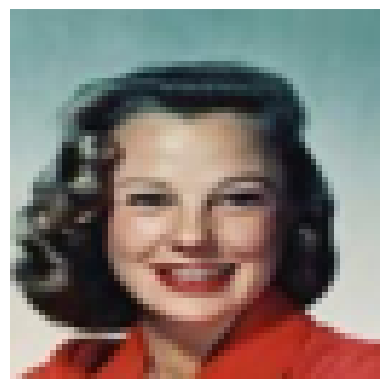

Accuracy: 1.0
Prediction: face | True label: face


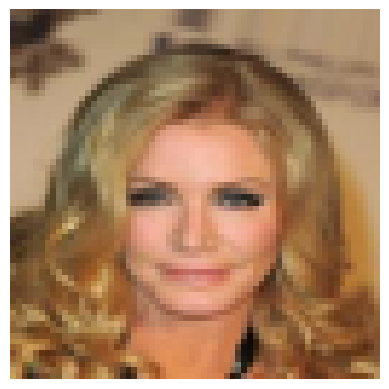

Accuracy: 1.0
Prediction: face | True label: face


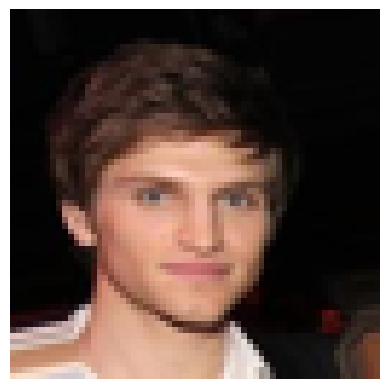

Accuracy: 1.0
Prediction: face | True label: face


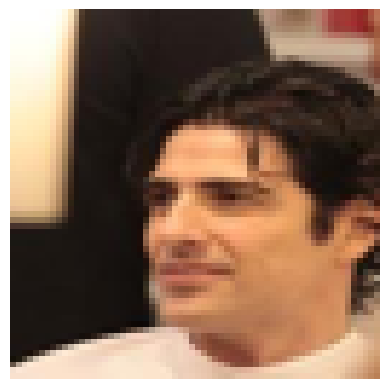

Accuracy: 1.0
Prediction: face | True label: face


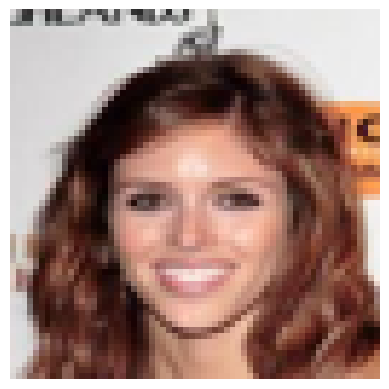

Accuracy: 1.0
Prediction: face | True label: face


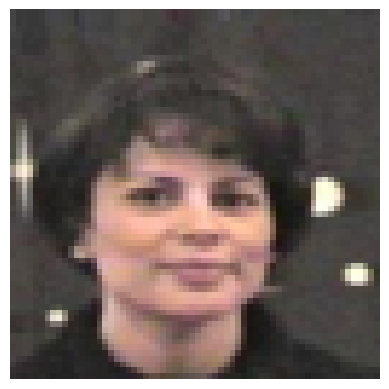

Accuracy: 1.0
Prediction: face | True label: face


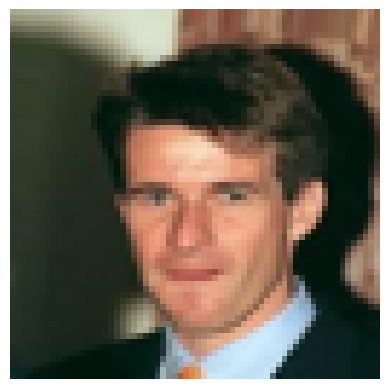

Accuracy: 1.0
Prediction: face | True label: face


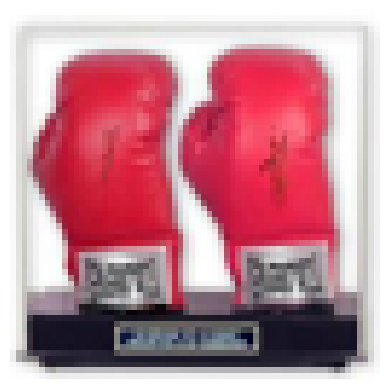

Accuracy: 1.0
Prediction: no_face | True label: no_face


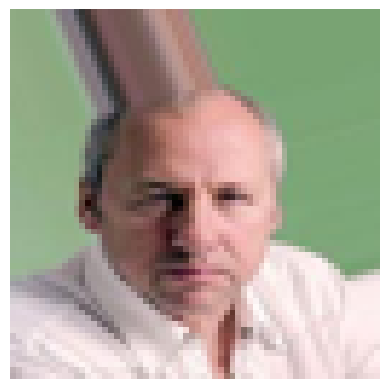

Accuracy: 0.0
Prediction: no_face | True label: face


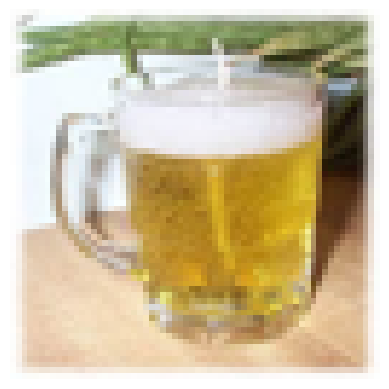

Accuracy: 1.0
Prediction: no_face | True label: no_face


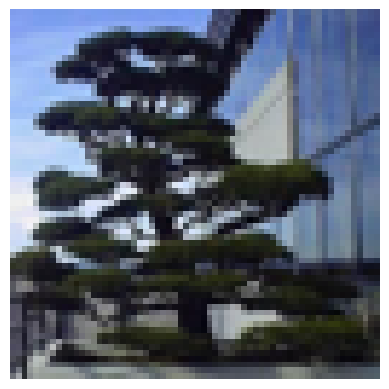

Accuracy: 1.0
Prediction: no_face | True label: no_face


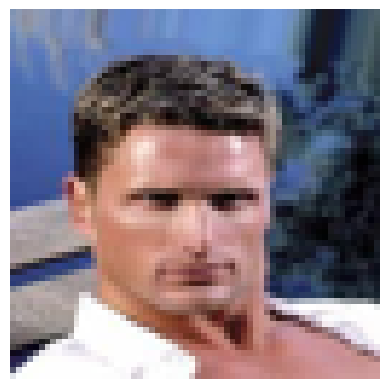

Accuracy: 1.0
Prediction: face | True label: face


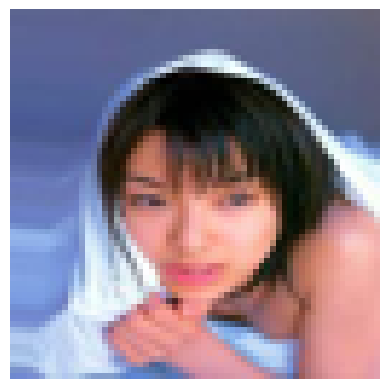

Accuracy: 1.0
Prediction: face | True label: face


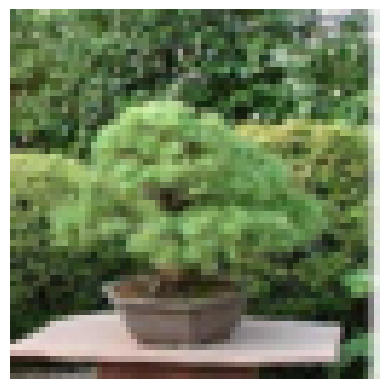

Accuracy: 1.0
Prediction: no_face | True label: no_face


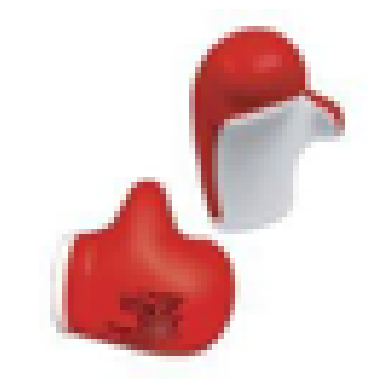

Accuracy: 1.0
Prediction: no_face | True label: no_face


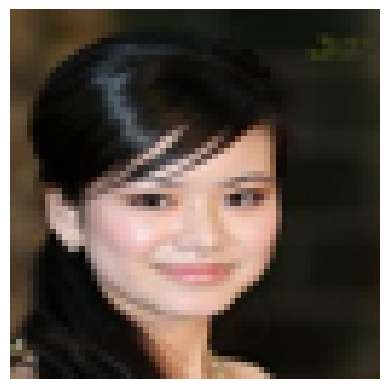

Accuracy: 1.0
Prediction: face | True label: face


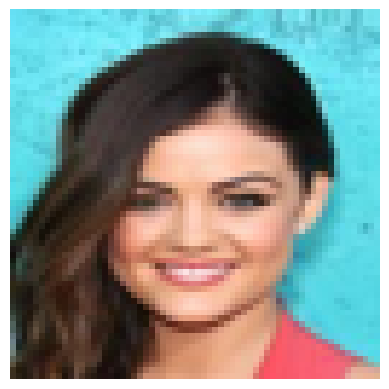

Accuracy: 1.0
Prediction: face | True label: face


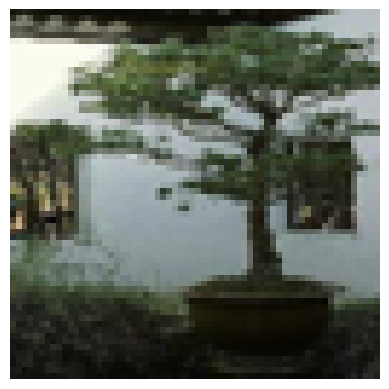

Accuracy: 1.0
Prediction: no_face | True label: no_face


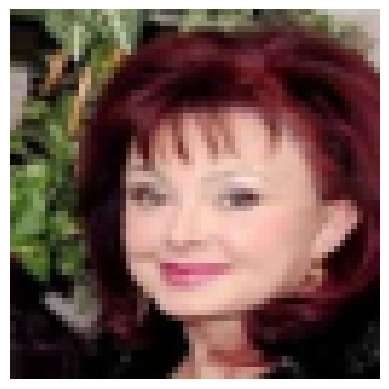

Accuracy: 1.0
Prediction: face | True label: face


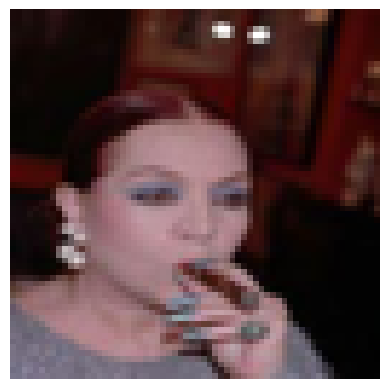

Accuracy: 1.0
Prediction: face | True label: face


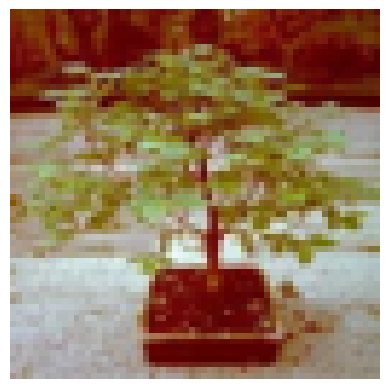

Accuracy: 0.0
Prediction: face | True label: no_face


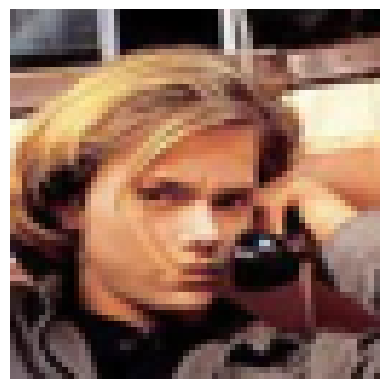

Accuracy: 1.0
Prediction: face | True label: face


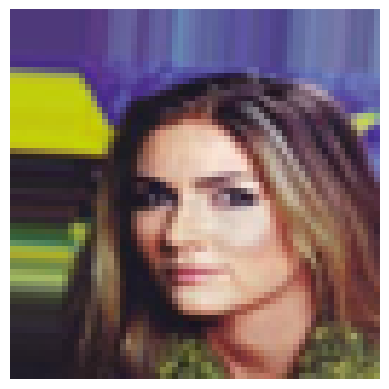

Accuracy: 1.0
Prediction: face | True label: face


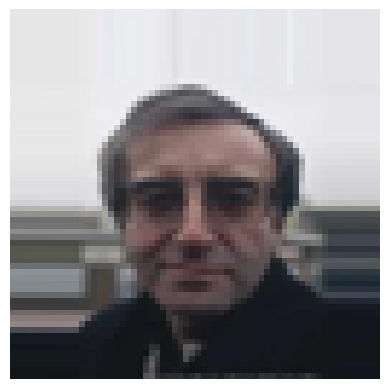

Accuracy: 1.0
Prediction: face | True label: face


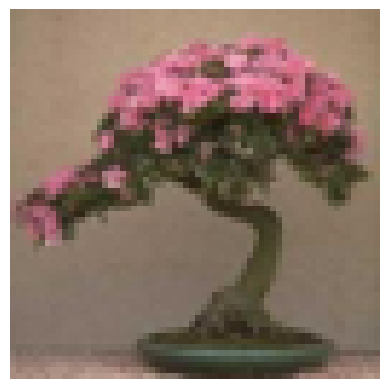

Accuracy: 0.0
Prediction: face | True label: no_face


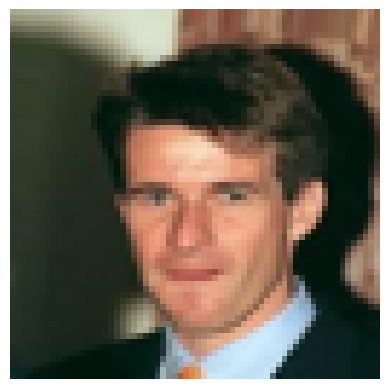

Accuracy: 1.0
Prediction: face | True label: face


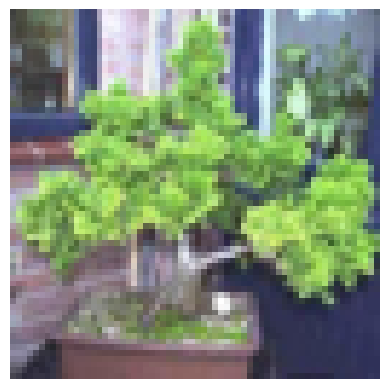

Accuracy: 1.0
Prediction: no_face | True label: no_face


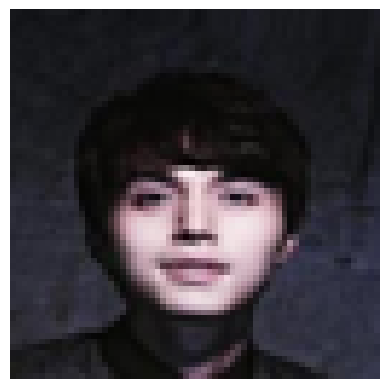

Accuracy: 1.0
Prediction: face | True label: face


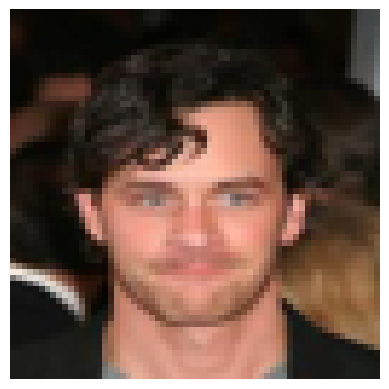

Accuracy: 1.0
Prediction: face | True label: face


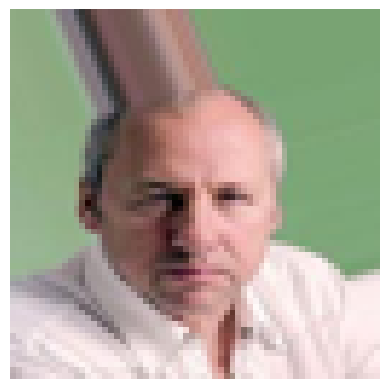

Accuracy: 0.0
Prediction: no_face | True label: face


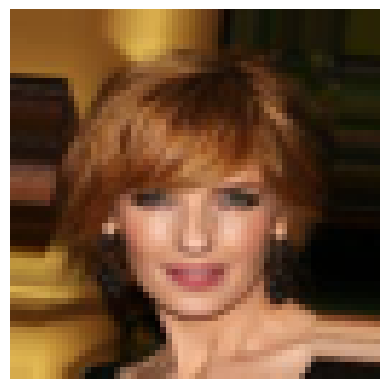

Accuracy: 1.0
Prediction: face | True label: face


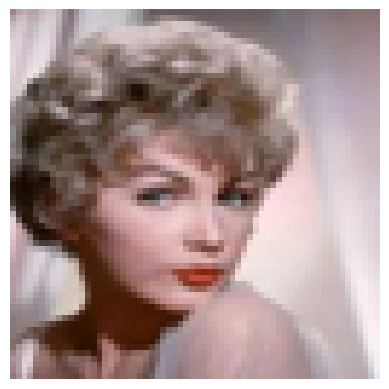

Accuracy: 1.0
Prediction: face | True label: face


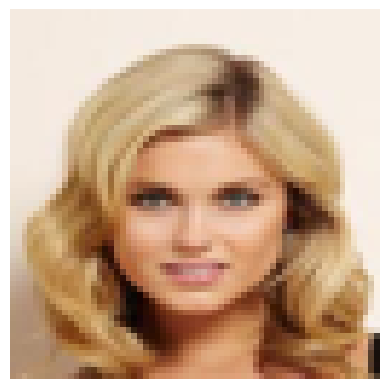

Accuracy: 1.0
Prediction: face | True label: face


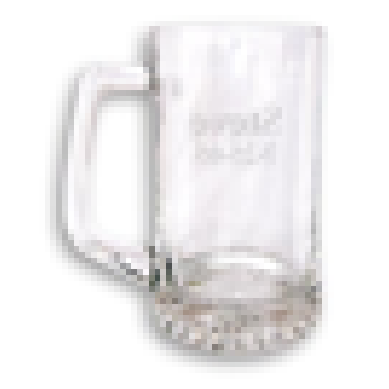

Accuracy: 1.0
Prediction: no_face | True label: no_face


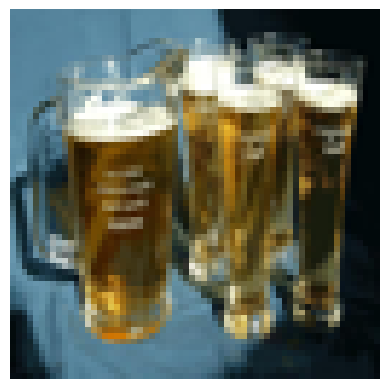

Accuracy: 1.0
Prediction: no_face | True label: no_face


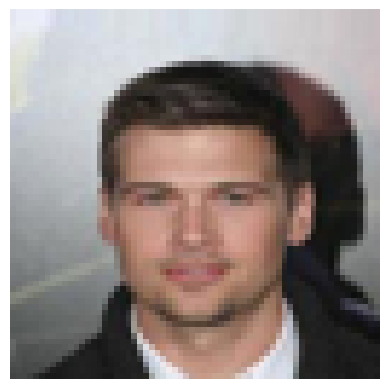

Accuracy: 1.0
Prediction: face | True label: face


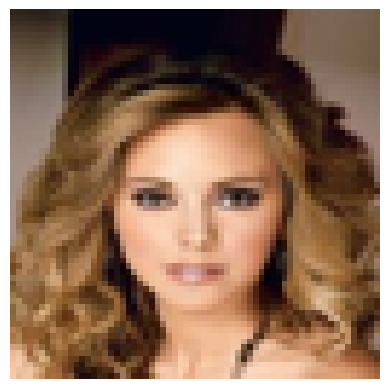

Accuracy: 1.0
Prediction: face | True label: face


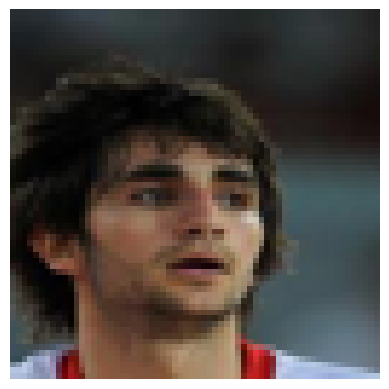

Accuracy: 1.0
Prediction: face | True label: face


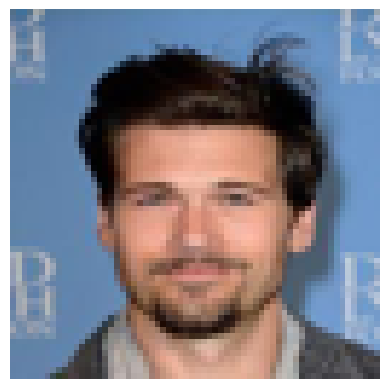

Accuracy: 1.0
Prediction: face | True label: face


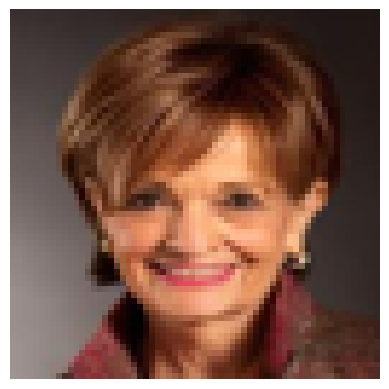

Accuracy: 1.0
Prediction: face | True label: face


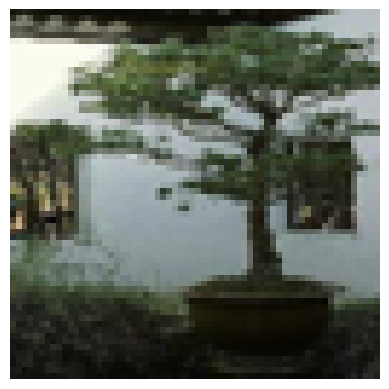

Accuracy: 1.0
Prediction: no_face | True label: no_face


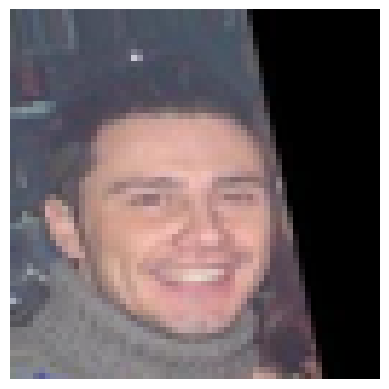

Accuracy: 1.0
Prediction: face | True label: face


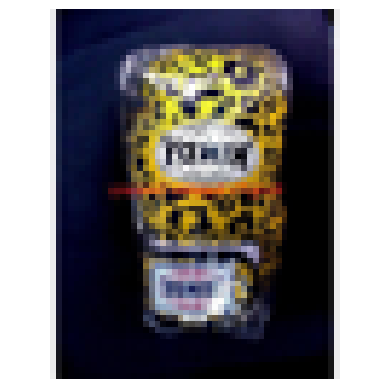

Accuracy: 1.0
Prediction: no_face | True label: no_face


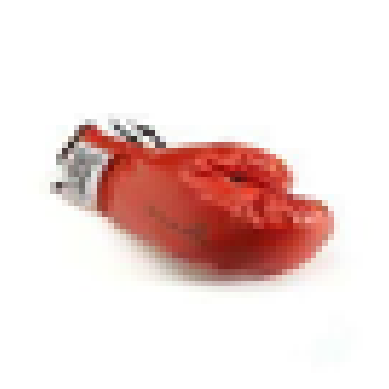

Accuracy: 1.0
Prediction: no_face | True label: no_face


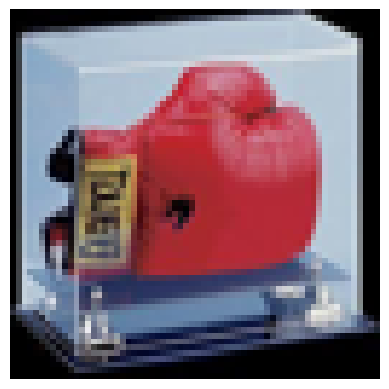

Accuracy: 0.0
Prediction: face | True label: no_face


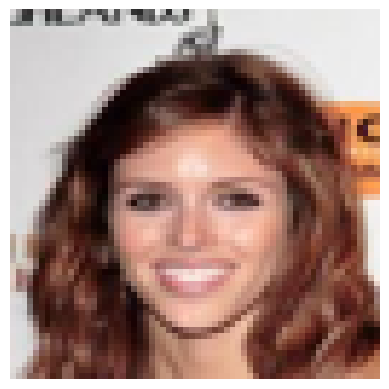

Accuracy: 1.0
Prediction: face | True label: face


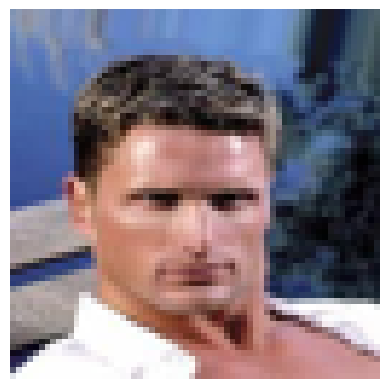

Accuracy: 1.0
Prediction: face | True label: face


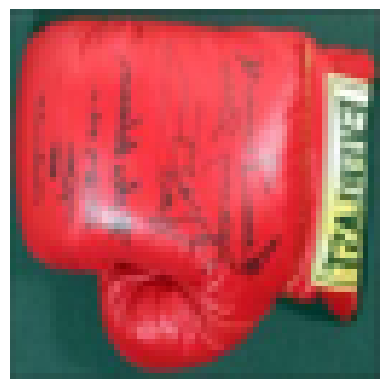

Accuracy: 0.0
Prediction: face | True label: no_face


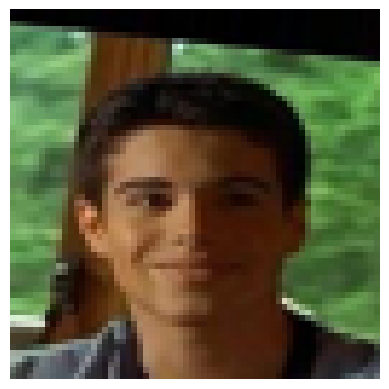

Accuracy: 1.0
Prediction: face | True label: face


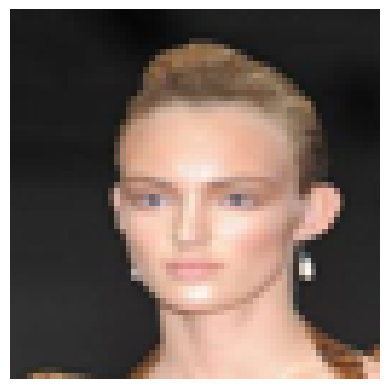

Accuracy: 1.0
Prediction: face | True label: face


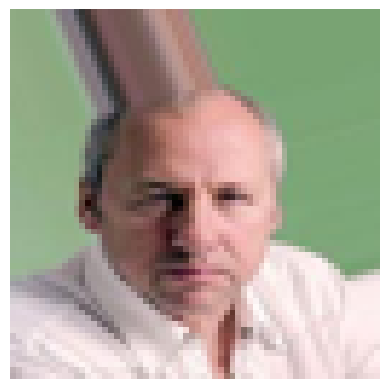

Accuracy: 0.0
Prediction: no_face | True label: face


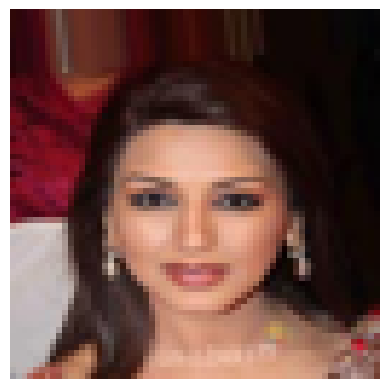

Accuracy: 1.0
Prediction: face | True label: face


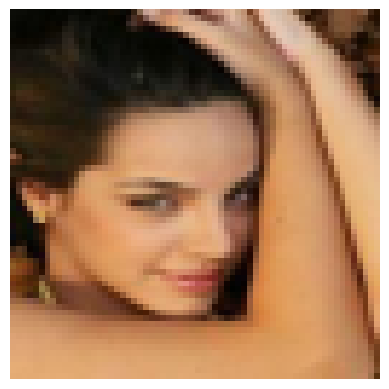

Accuracy: 1.0
Prediction: face | True label: face


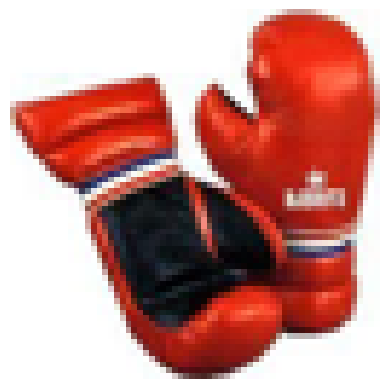

Accuracy: 1.0
Prediction: no_face | True label: no_face


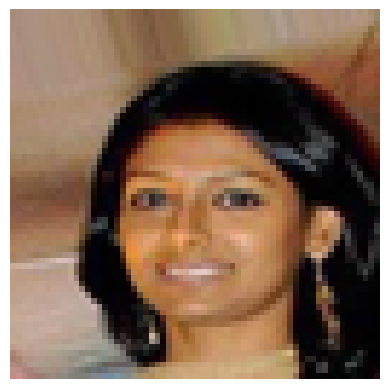

Accuracy: 1.0
Prediction: face | True label: face


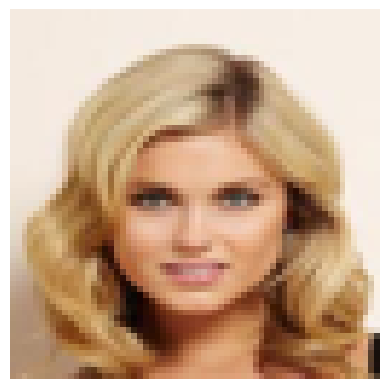

Accuracy: 1.0
Prediction: face | True label: face


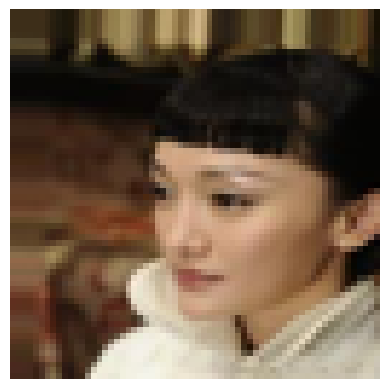

Accuracy: 1.0
Prediction: face | True label: face


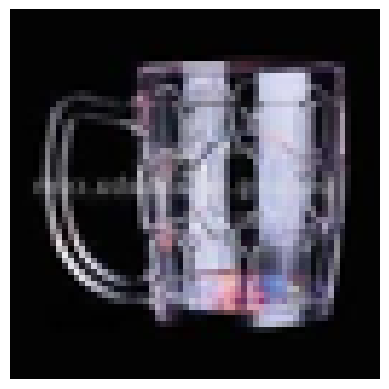

Accuracy: 1.0
Prediction: no_face | True label: no_face


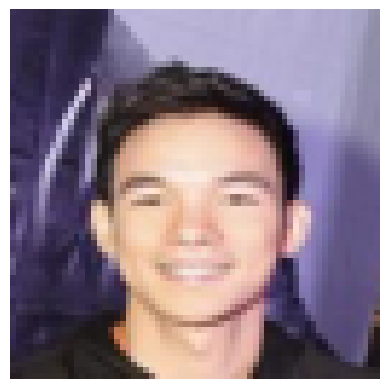

Accuracy: 1.0
Prediction: face | True label: face


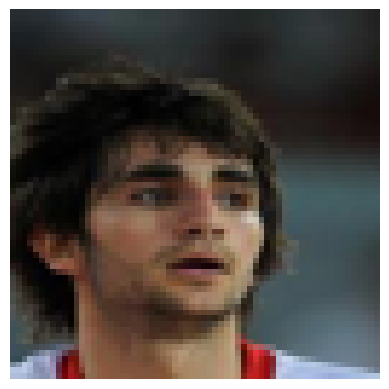

Accuracy: 1.0
Prediction: face | True label: face


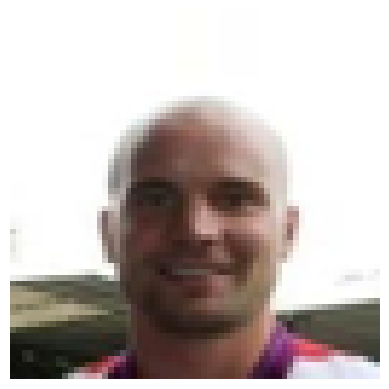

Accuracy: 0.0
Prediction: no_face | True label: face


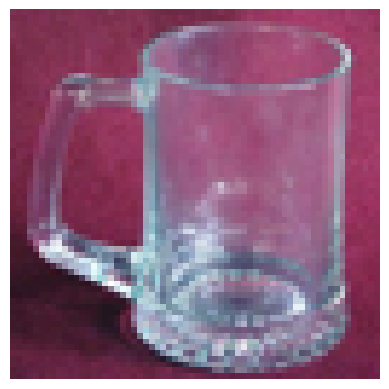

Accuracy: 0.0
Prediction: face | True label: no_face


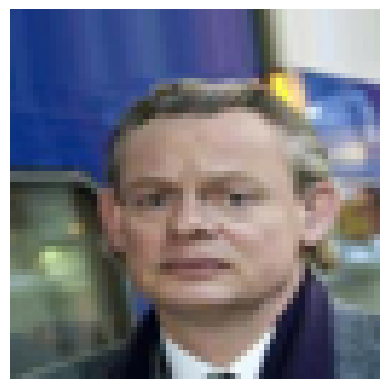

Accuracy: 1.0
Prediction: face | True label: face


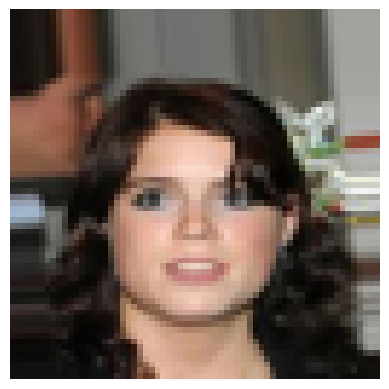

Accuracy: 1.0
Prediction: face | True label: face


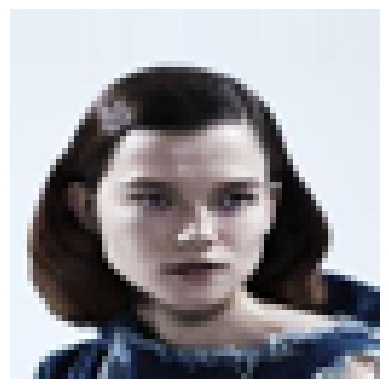

Accuracy: 1.0
Prediction: face | True label: face


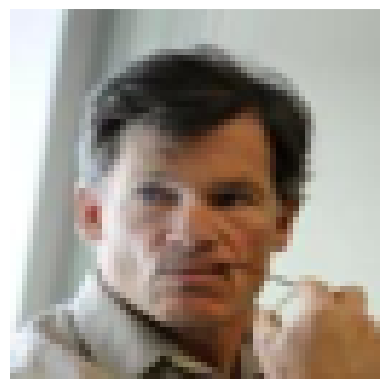

Accuracy: 1.0
Prediction: face | True label: face


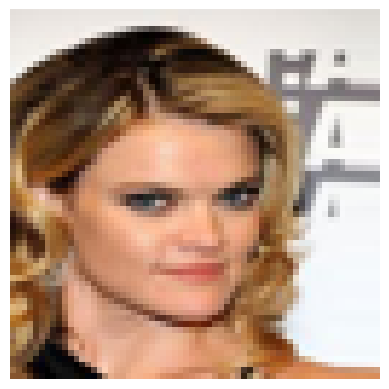

Accuracy: 1.0
Prediction: face | True label: face


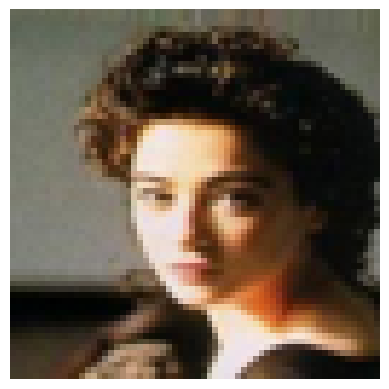

Accuracy: 1.0
Prediction: face | True label: face


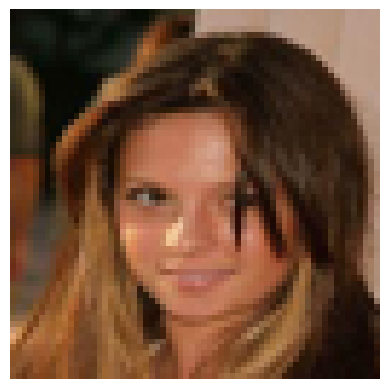

Accuracy: 1.0
Prediction: face | True label: face


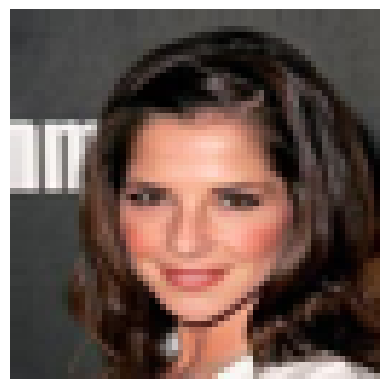

Accuracy: 1.0
Prediction: face | True label: face


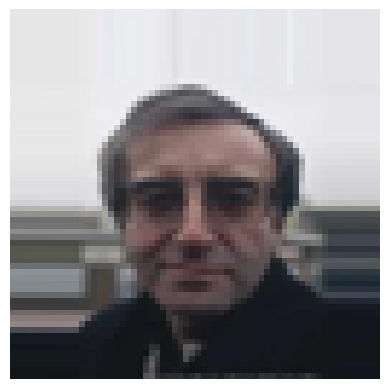

Accuracy: 1.0
Prediction: face | True label: face


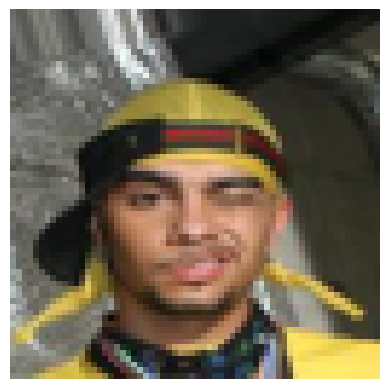

Accuracy: 1.0
Prediction: face | True label: face


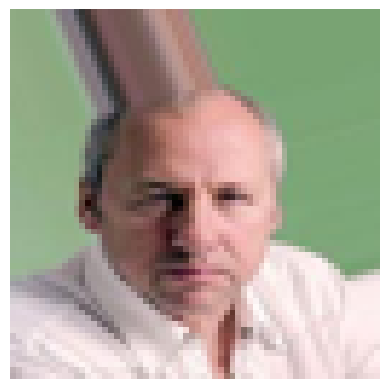

Accuracy: 0.0
Prediction: no_face | True label: face


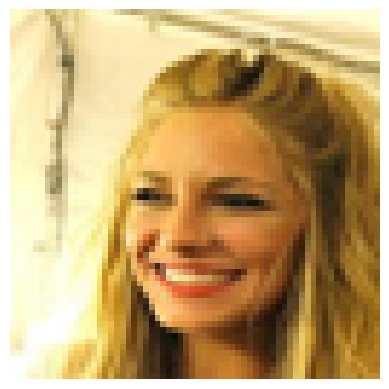

Accuracy: 1.0
Prediction: face | True label: face


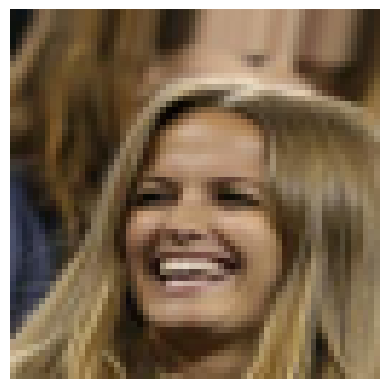

Accuracy: 1.0
Prediction: face | True label: face


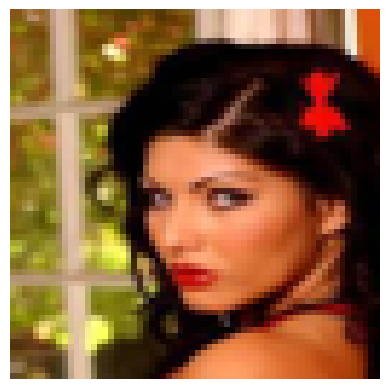

Accuracy: 1.0
Prediction: face | True label: face


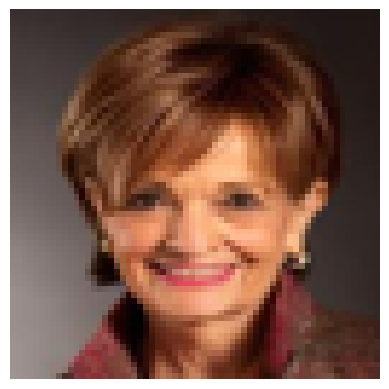

Accuracy: 1.0
Prediction: face | True label: face


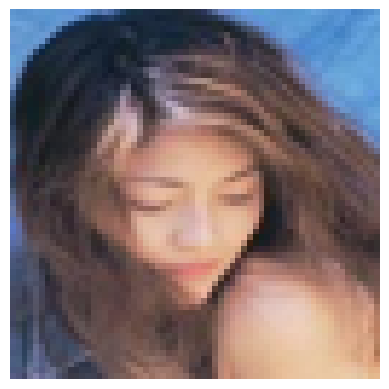

Accuracy: 1.0
Prediction: face | True label: face


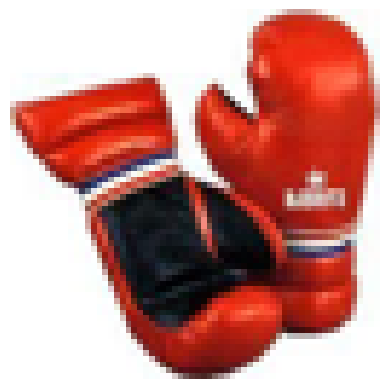

Accuracy: 1.0
Prediction: no_face | True label: no_face


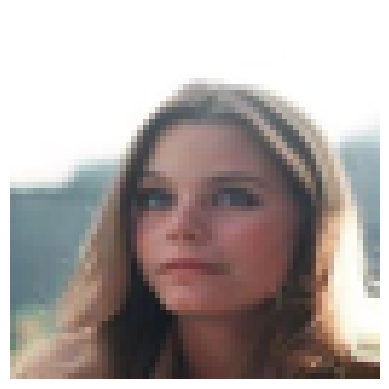

Accuracy: 1.0
Prediction: face | True label: face


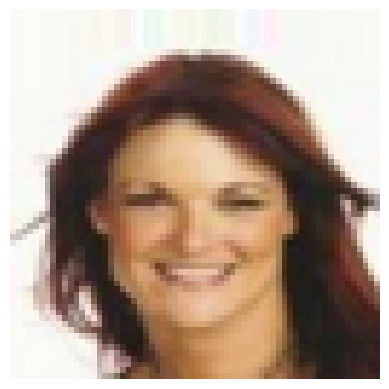

Accuracy: 1.0
Prediction: face | True label: face


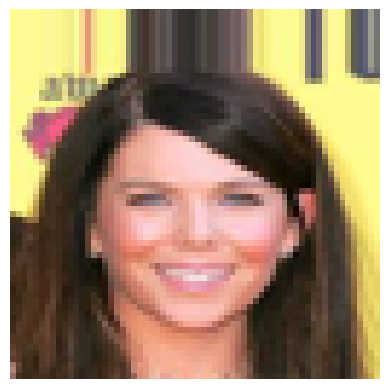

Accuracy: 1.0
Prediction: face | True label: face


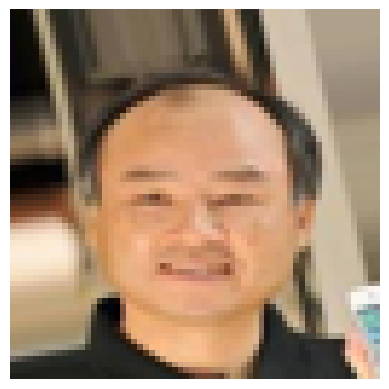

Accuracy: 1.0
Prediction: face | True label: face


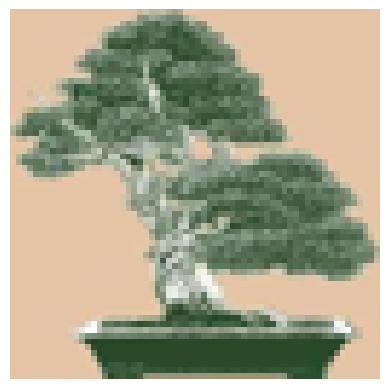

Accuracy: 1.0
Prediction: no_face | True label: no_face


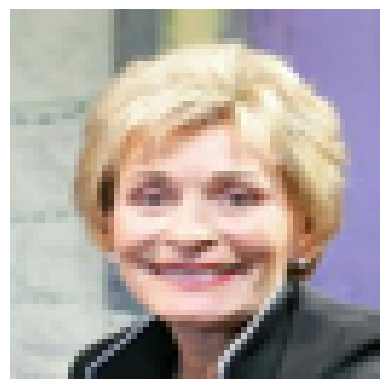

Accuracy: 1.0
Prediction: face | True label: face


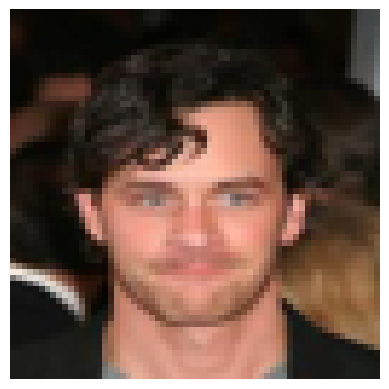

Accuracy: 1.0
Prediction: face | True label: face


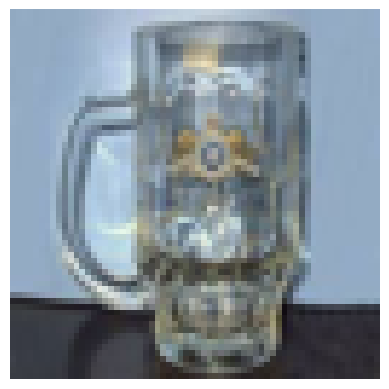

Accuracy: 1.0
Prediction: no_face | True label: no_face


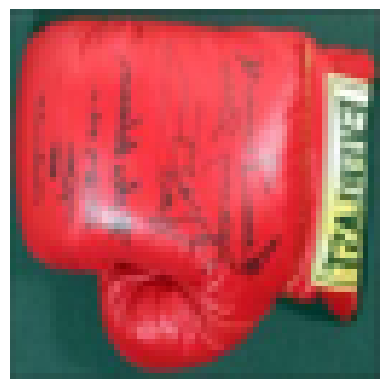

Accuracy: 0.0
Prediction: face | True label: no_face


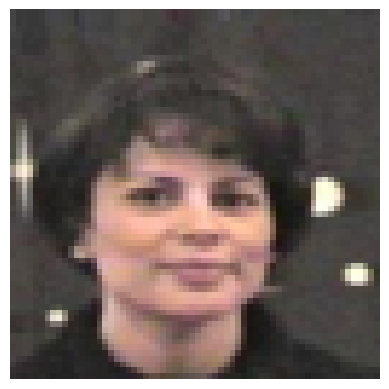

Accuracy: 1.0
Prediction: face | True label: face


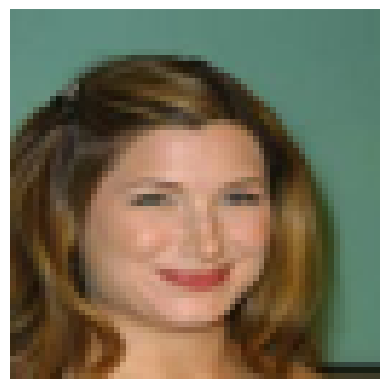

Accuracy: 1.0
Prediction: face | True label: face


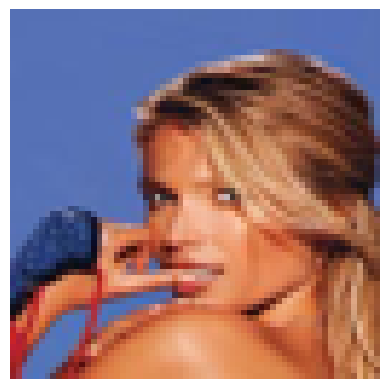

Accuracy: 1.0
Prediction: face | True label: face


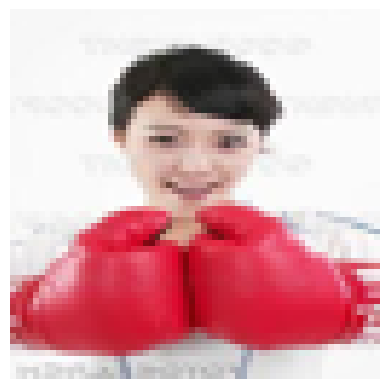

Accuracy: 1.0
Prediction: no_face | True label: no_face


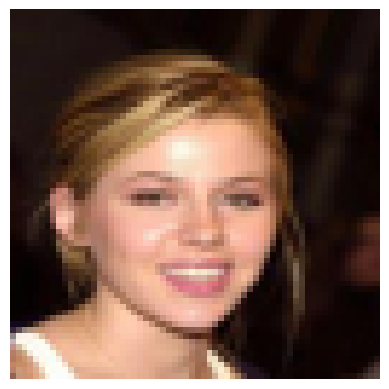

Accuracy: 1.0
Prediction: face | True label: face


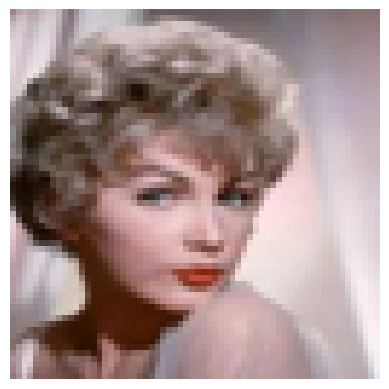

Accuracy: 1.0
Prediction: face | True label: face


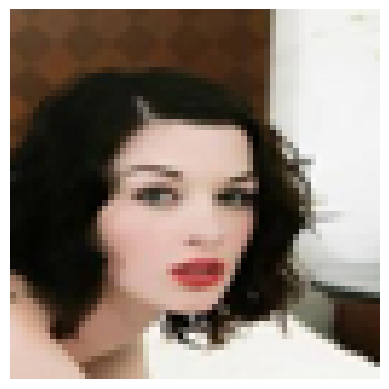

Accuracy: 1.0
Prediction: face | True label: face


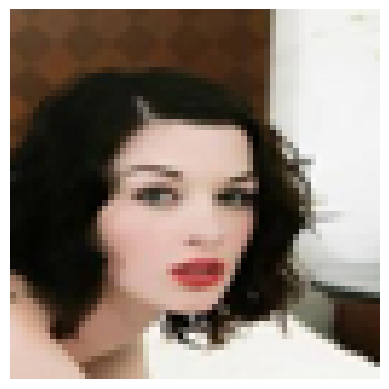

Accuracy: 1.0
Prediction: face | True label: face


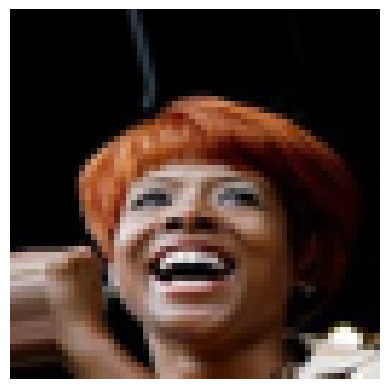

Accuracy: 1.0
Prediction: face | True label: face


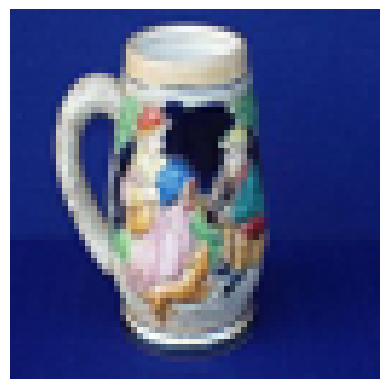

Accuracy: 0.0
Prediction: face | True label: no_face


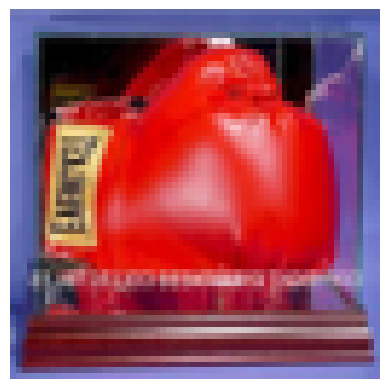

Accuracy: 0.0
Prediction: face | True label: no_face


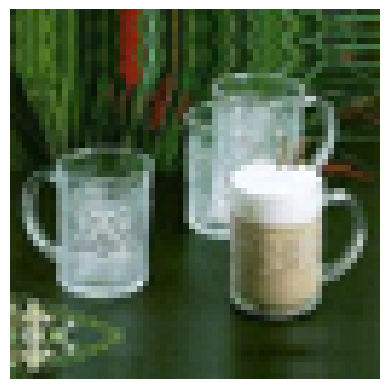

Accuracy: 1.0
Prediction: no_face | True label: no_face


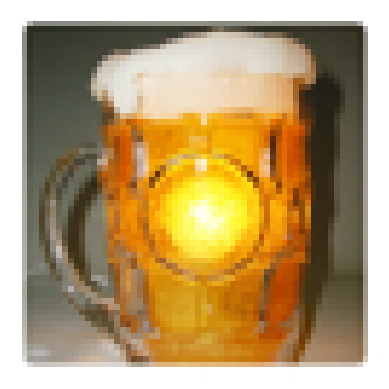

Accuracy: 0.0
Prediction: face | True label: no_face


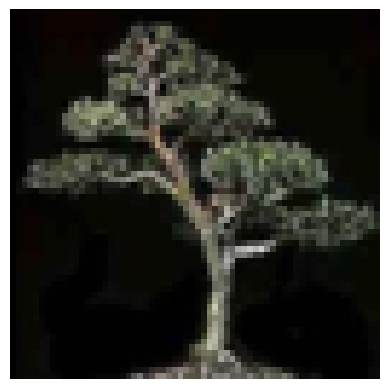

Accuracy: 1.0
Prediction: no_face | True label: no_face


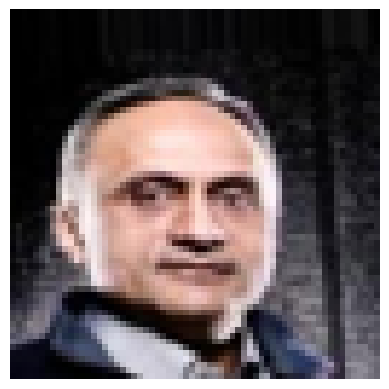

Accuracy: 1.0
Prediction: face | True label: face


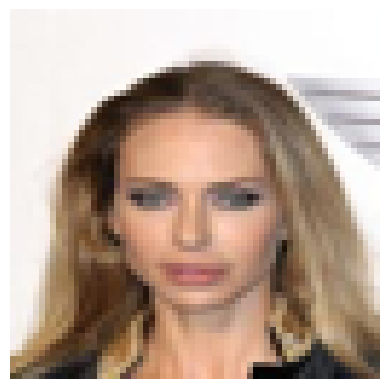

Accuracy: 1.0
Prediction: face | True label: face


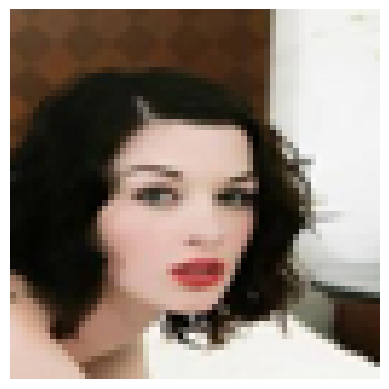

Accuracy: 1.0
Prediction: face | True label: face


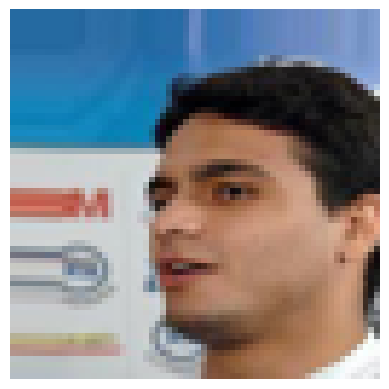

Accuracy: 1.0
Prediction: face | True label: face


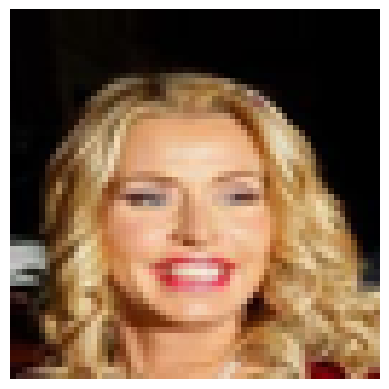

Accuracy: 1.0
Prediction: face | True label: face


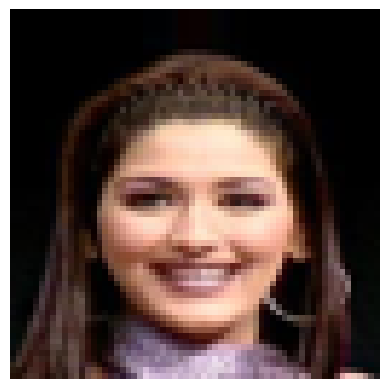

Accuracy: 1.0
Prediction: face | True label: face


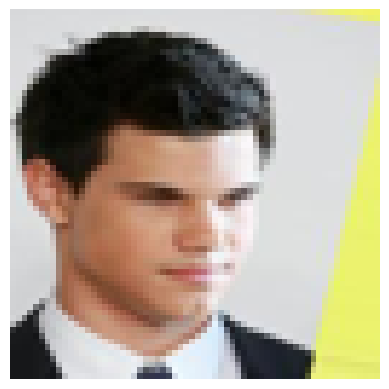

Accuracy: 1.0
Prediction: face | True label: face


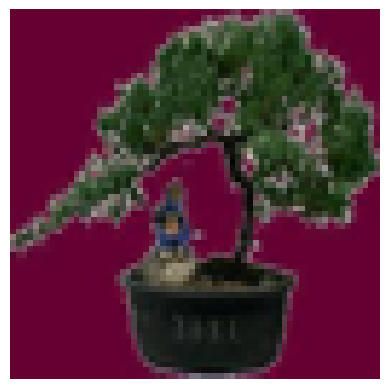

Accuracy: 0.0
Prediction: face | True label: no_face


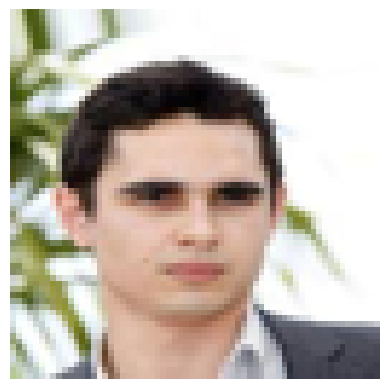

Accuracy: 1.0
Prediction: face | True label: face


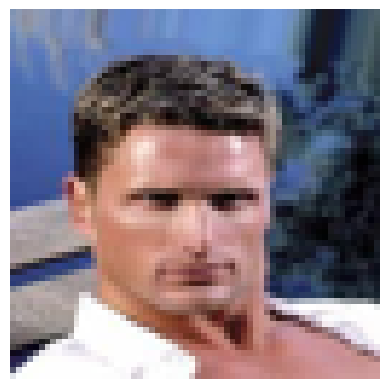

Accuracy: 1.0
Prediction: face | True label: face


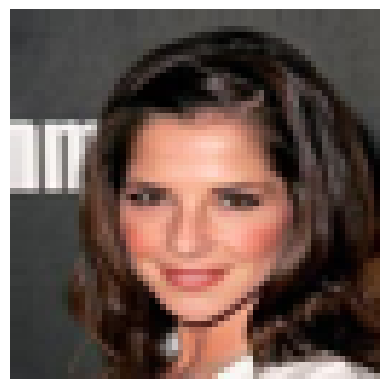

Accuracy: 1.0
Prediction: face | True label: face


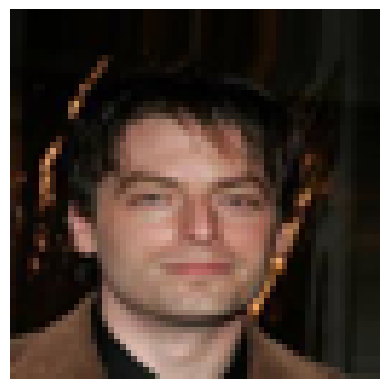

Accuracy: 1.0
Prediction: face | True label: face


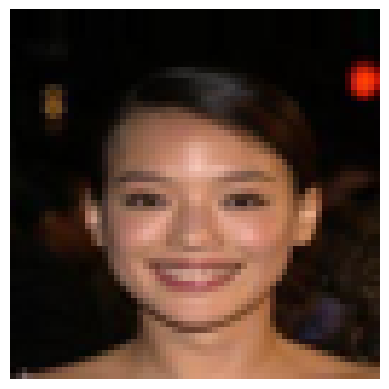

Accuracy: 1.0
Prediction: face | True label: face


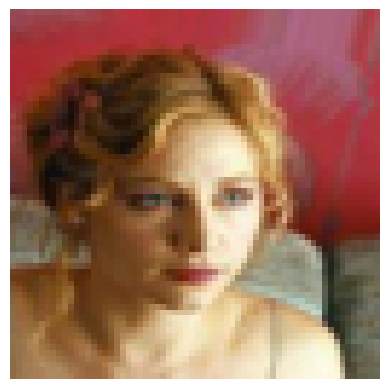

Accuracy: 1.0
Prediction: face | True label: face


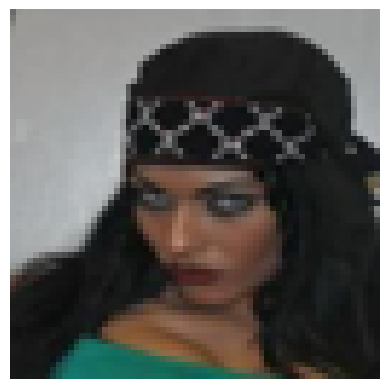

Accuracy: 0.0
Prediction: no_face | True label: face


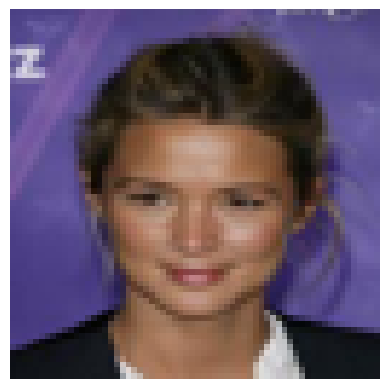

Accuracy: 1.0
Prediction: face | True label: face


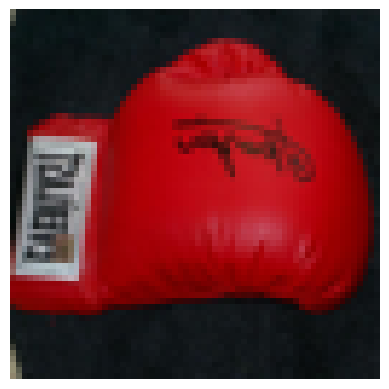

Accuracy: 0.0
Prediction: face | True label: no_face


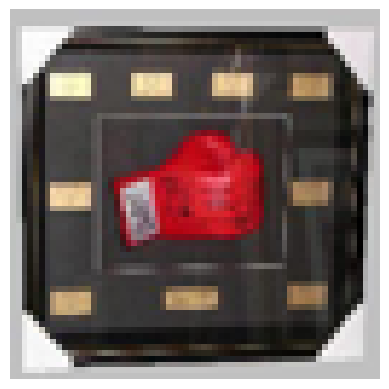

Accuracy: 1.0
Prediction: no_face | True label: no_face


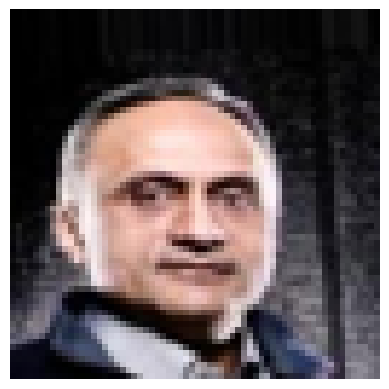

Accuracy: 1.0
Prediction: face | True label: face


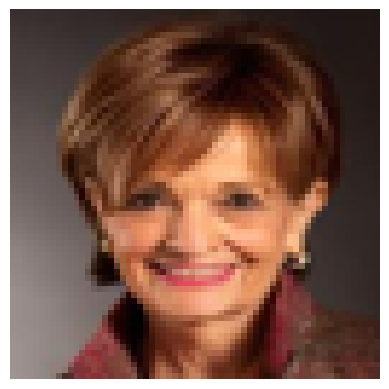

Accuracy: 1.0
Prediction: face | True label: face


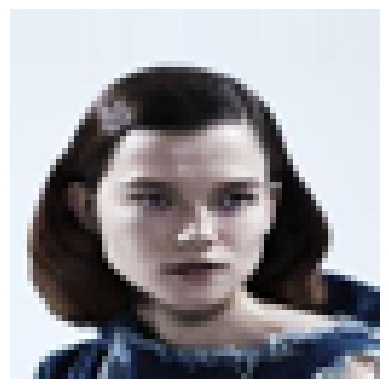

Accuracy: 1.0
Prediction: face | True label: face


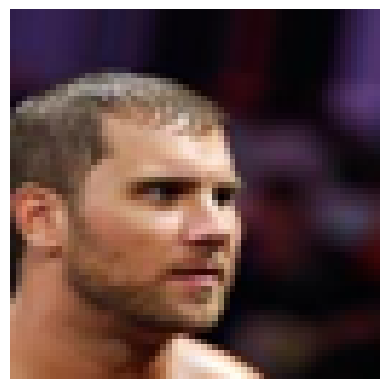

Accuracy: 1.0
Prediction: face | True label: face


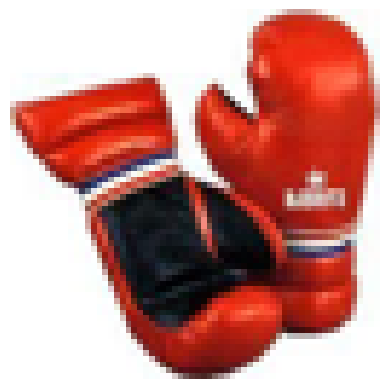

Accuracy: 1.0
Prediction: no_face | True label: no_face


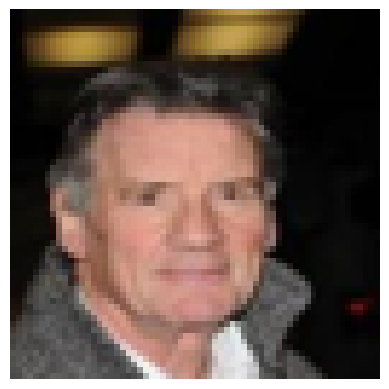

Accuracy: 1.0
Prediction: face | True label: face


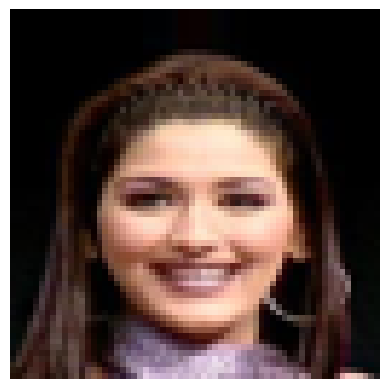

Accuracy: 1.0
Prediction: face | True label: face


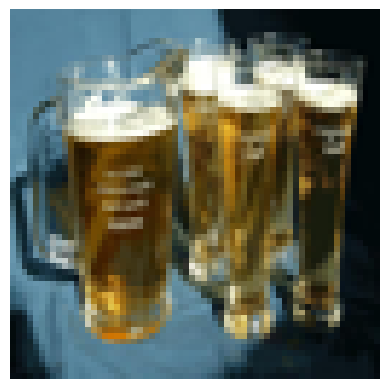

Accuracy: 1.0
Prediction: no_face | True label: no_face


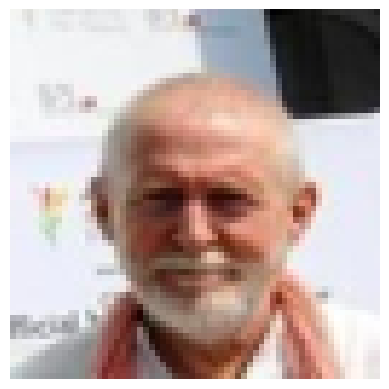

Accuracy: 0.0
Prediction: no_face | True label: face


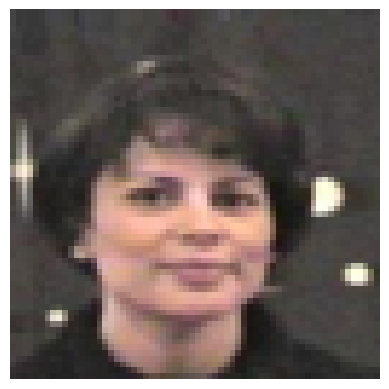

Accuracy: 1.0
Prediction: face | True label: face


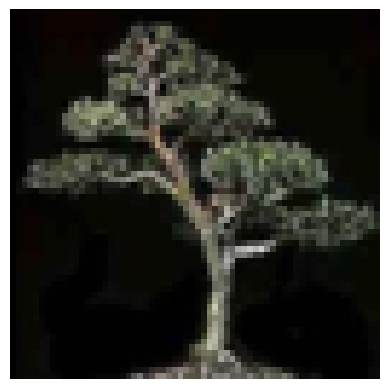

Accuracy: 1.0
Prediction: no_face | True label: no_face


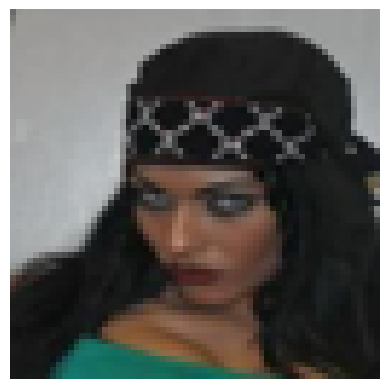

Accuracy: 0.0
Prediction: no_face | True label: face


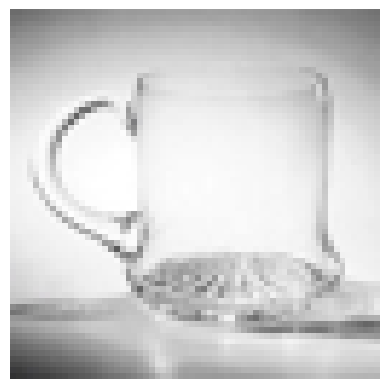

Accuracy: 1.0
Prediction: no_face | True label: no_face


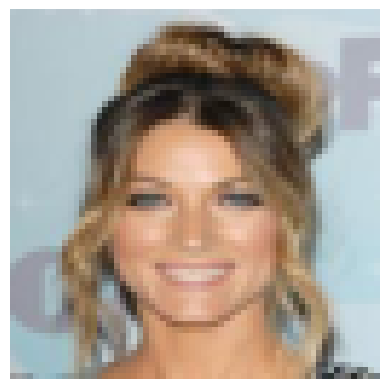

Accuracy: 1.0
Prediction: face | True label: face


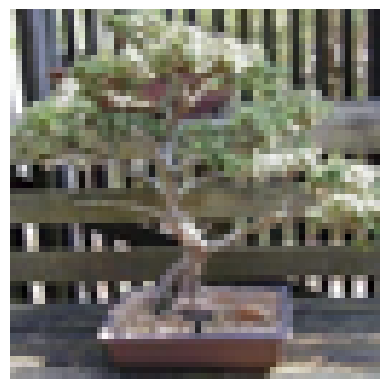

Accuracy: 1.0
Prediction: no_face | True label: no_face


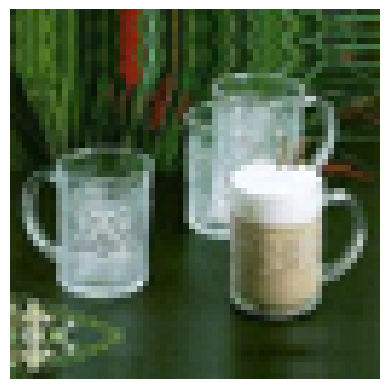

Accuracy: 1.0
Prediction: no_face | True label: no_face


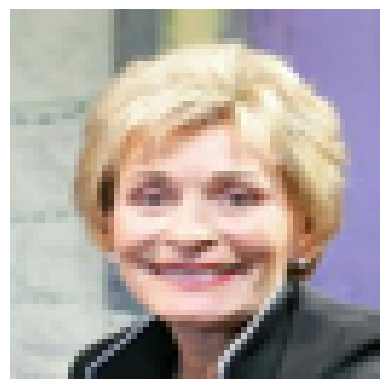

Accuracy: 1.0
Prediction: face | True label: face


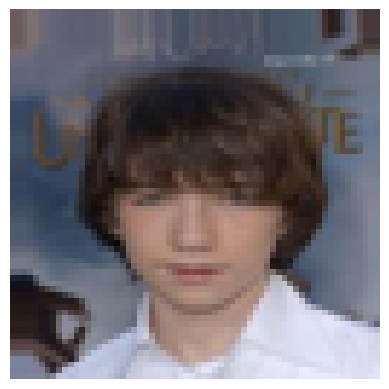

Accuracy: 1.0
Prediction: face | True label: face


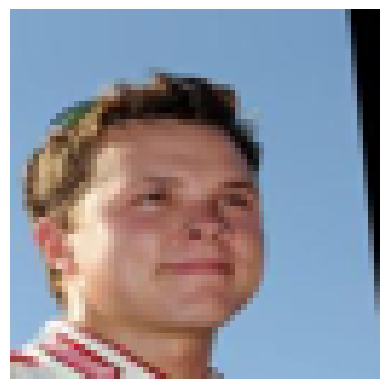

Accuracy: 1.0
Prediction: face | True label: face


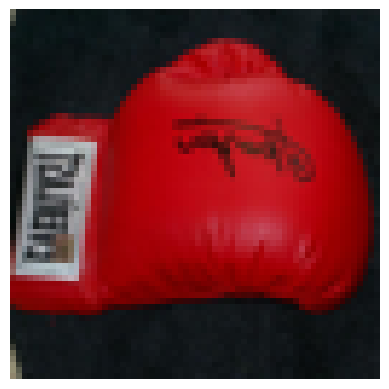

Accuracy: 0.0
Prediction: face | True label: no_face


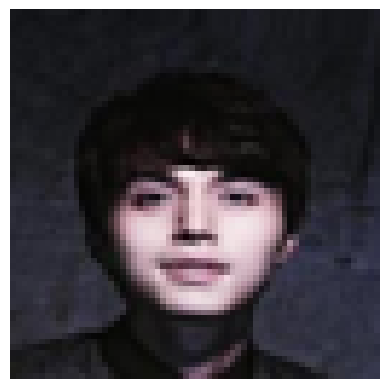

Accuracy: 1.0
Prediction: face | True label: face


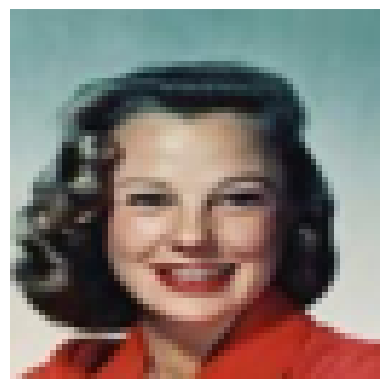

Accuracy: 1.0
Prediction: face | True label: face


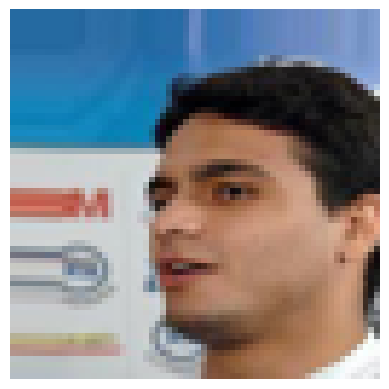

Accuracy: 1.0
Prediction: face | True label: face


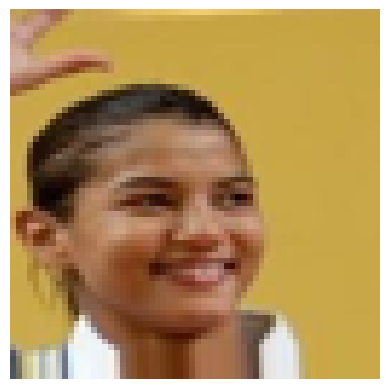

Accuracy: 1.0
Prediction: face | True label: face


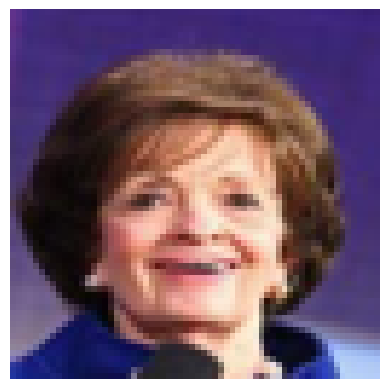

Accuracy: 1.0
Prediction: face | True label: face


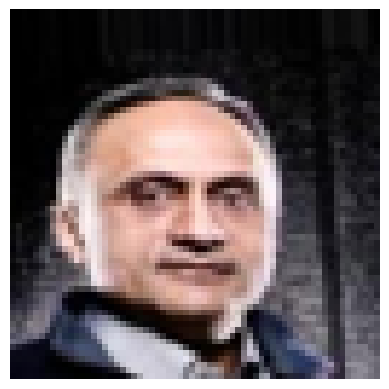

Accuracy: 1.0
Prediction: face | True label: face


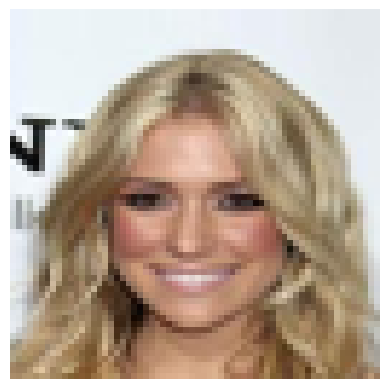

Accuracy: 1.0
Prediction: face | True label: face


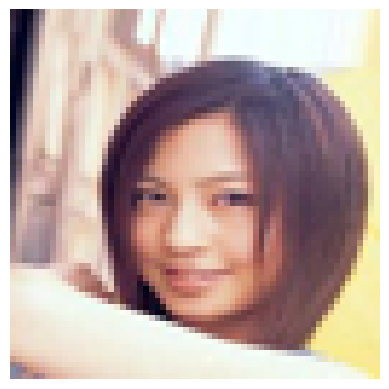

Accuracy: 1.0
Prediction: face | True label: face


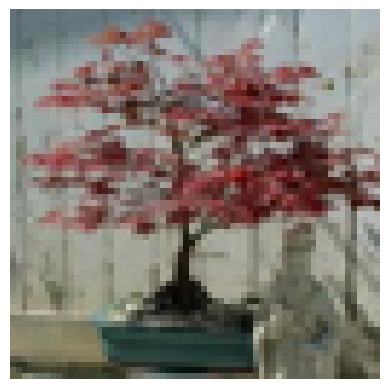

Accuracy: 0.0
Prediction: face | True label: no_face


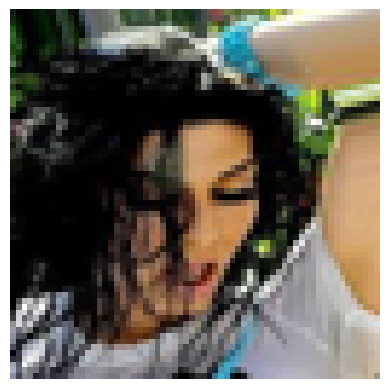

Accuracy: 1.0
Prediction: face | True label: face


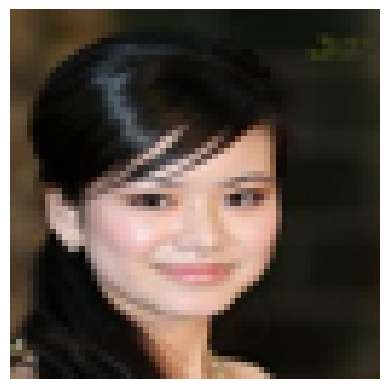

Accuracy: 1.0
Prediction: face | True label: face


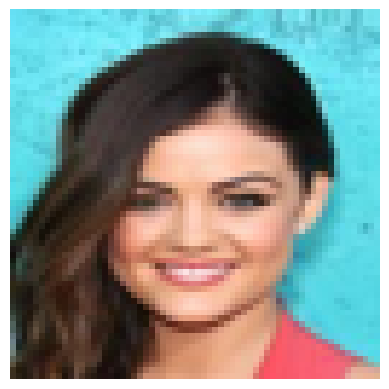

Accuracy: 1.0
Prediction: face | True label: face


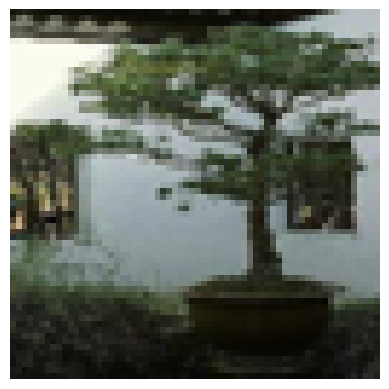

Accuracy: 1.0
Prediction: no_face | True label: no_face


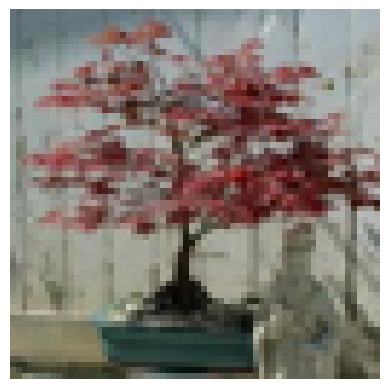

Accuracy: 0.0
Prediction: face | True label: no_face


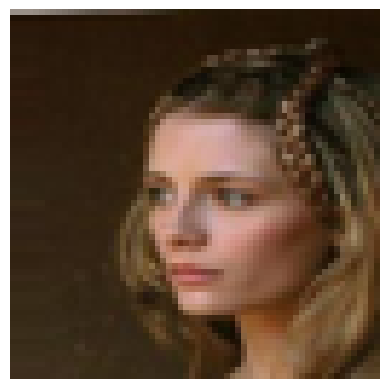

Accuracy: 1.0
Prediction: face | True label: face


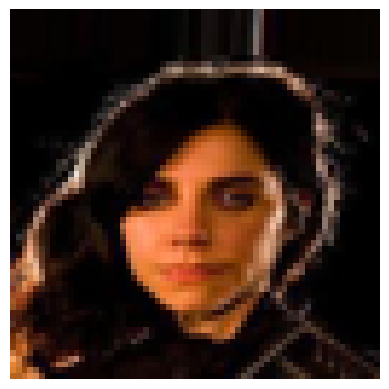

Accuracy: 1.0
Prediction: face | True label: face


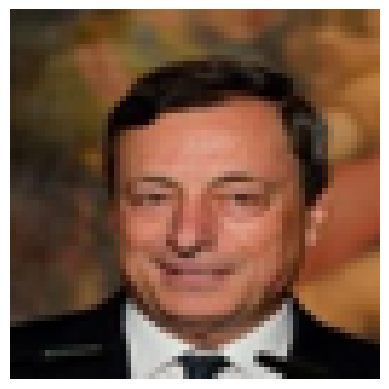

Accuracy: 1.0
Prediction: face | True label: face


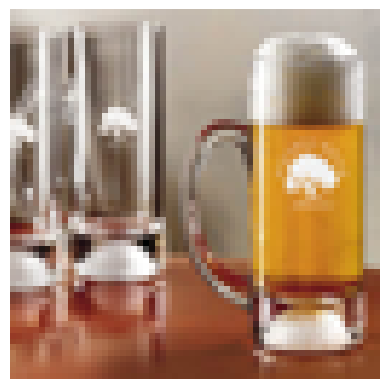

Accuracy: 1.0
Prediction: no_face | True label: no_face


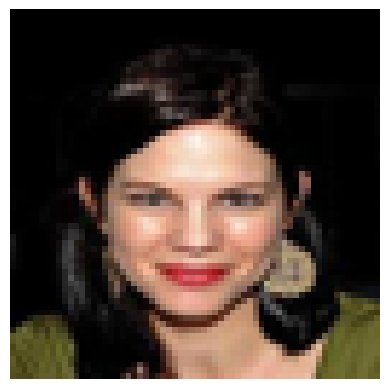

Accuracy: 1.0
Prediction: face | True label: face


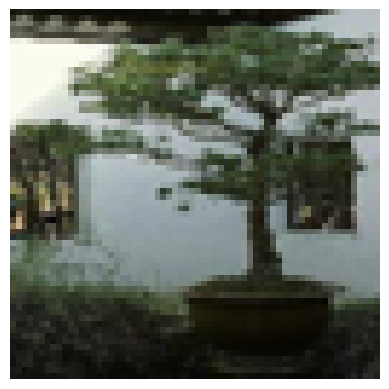

Accuracy: 1.0
Prediction: no_face | True label: no_face


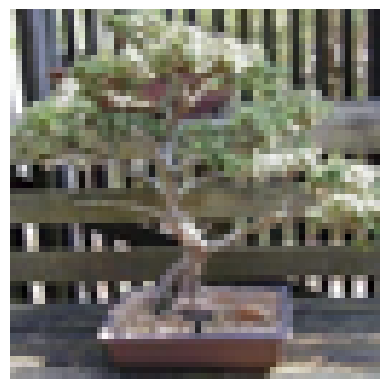

Accuracy: 1.0
Prediction: no_face | True label: no_face


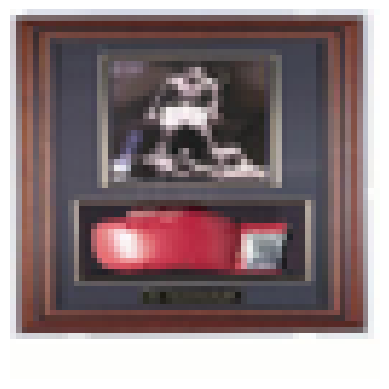

Accuracy: 1.0
Prediction: no_face | True label: no_face


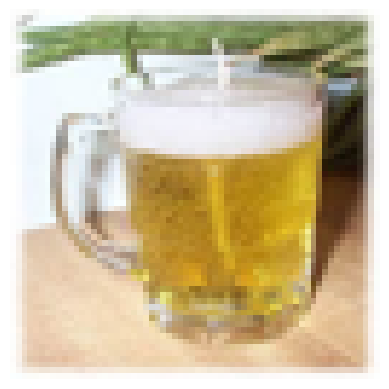

Accuracy: 1.0
Prediction: no_face | True label: no_face


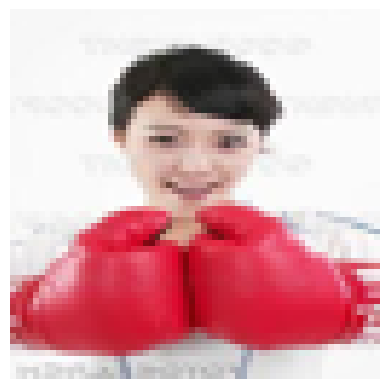

Accuracy: 1.0
Prediction: no_face | True label: no_face


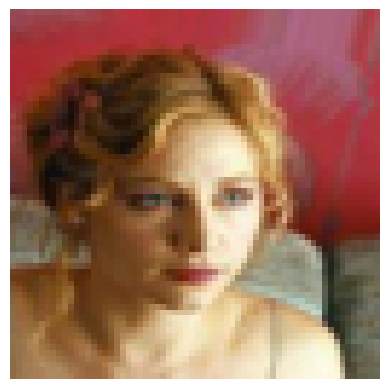

Accuracy: 1.0
Prediction: face | True label: face


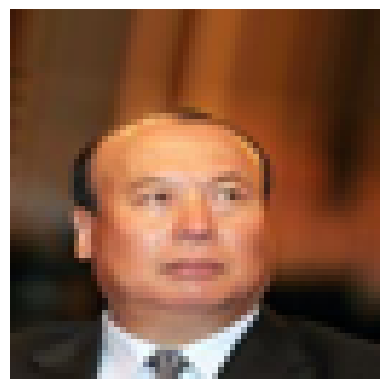

Accuracy: 1.0
Prediction: face | True label: face


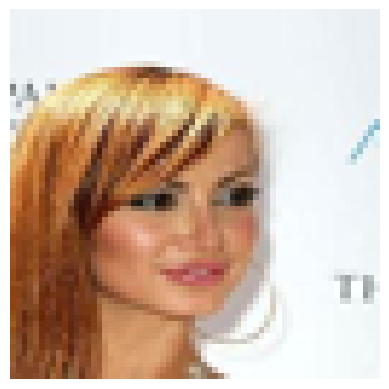

Accuracy: 1.0
Prediction: face | True label: face


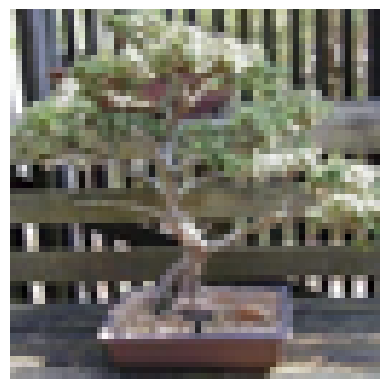

Accuracy: 1.0
Prediction: no_face | True label: no_face


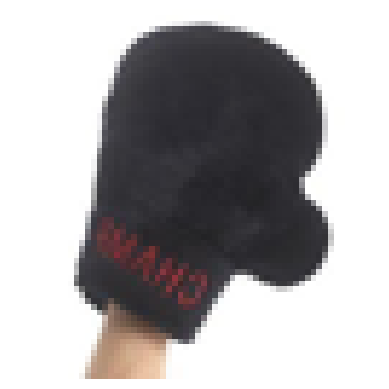

Accuracy: 1.0
Prediction: no_face | True label: no_face


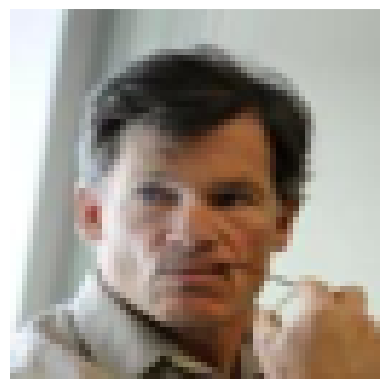

Accuracy: 1.0
Prediction: face | True label: face


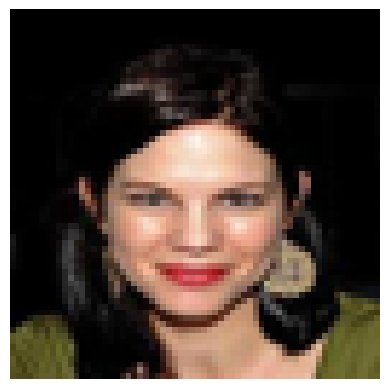

Accuracy: 1.0
Prediction: face | True label: face


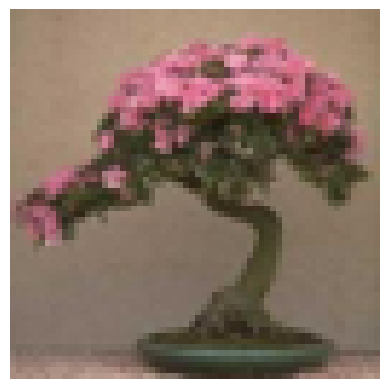

Accuracy: 0.0
Prediction: face | True label: no_face


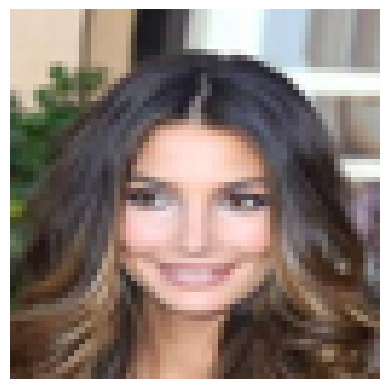

Accuracy: 1.0
Prediction: face | True label: face


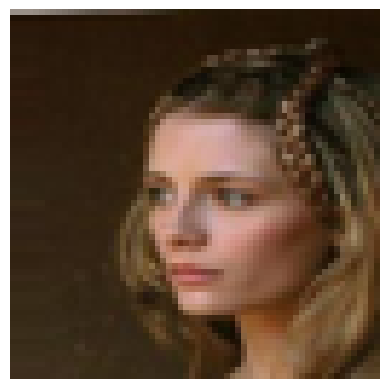

Accuracy: 1.0
Prediction: face | True label: face


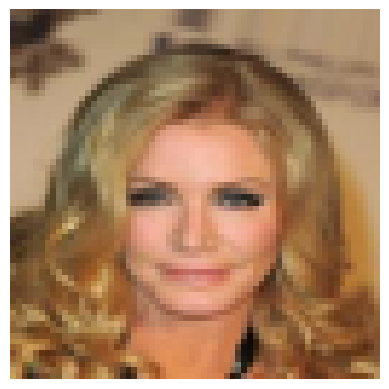

Accuracy: 1.0
Prediction: face | True label: face


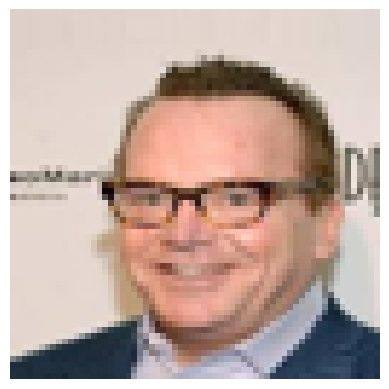

Accuracy: 1.0
Prediction: face | True label: face


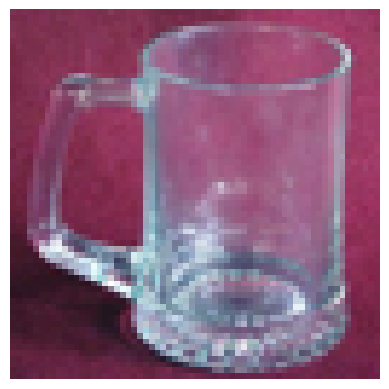

Accuracy: 0.0
Prediction: face | True label: no_face


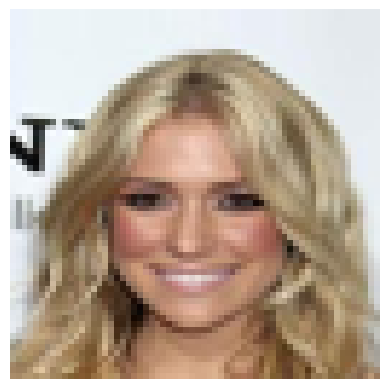

Accuracy: 1.0
Prediction: face | True label: face


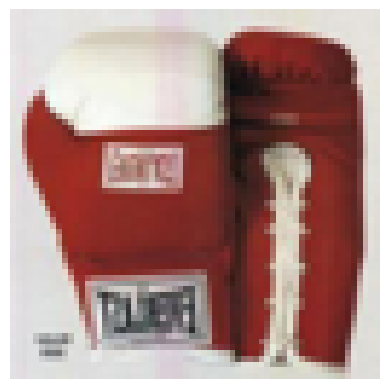

Accuracy: 1.0
Prediction: no_face | True label: no_face


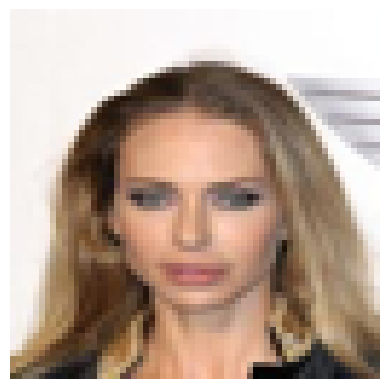

Accuracy: 1.0
Prediction: face | True label: face


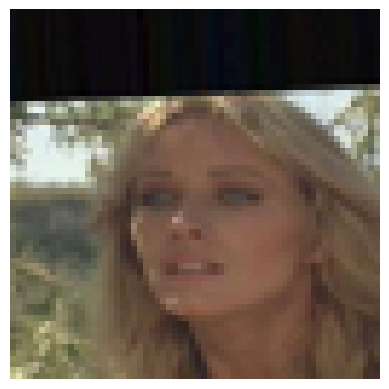

Accuracy: 1.0
Prediction: face | True label: face


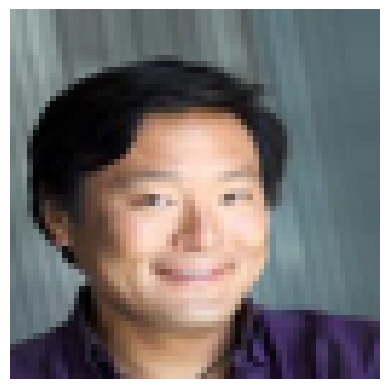

Accuracy: 1.0
Prediction: face | True label: face


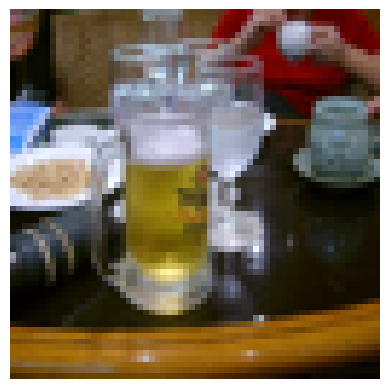

Accuracy: 1.0
Prediction: no_face | True label: no_face


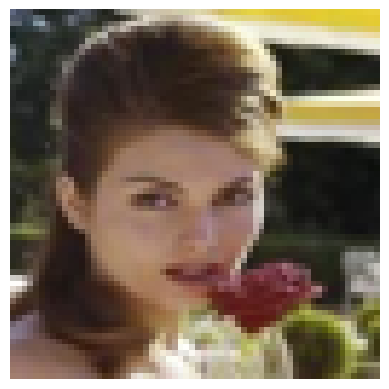

Accuracy: 1.0
Prediction: face | True label: face


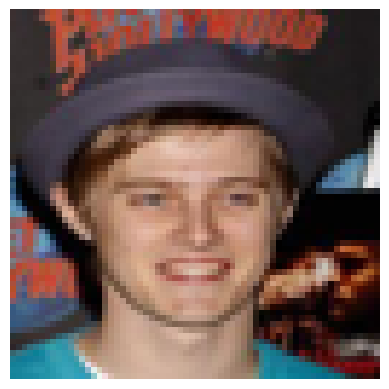

Accuracy: 1.0
Prediction: face | True label: face


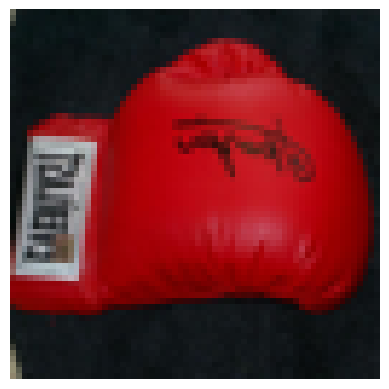

Accuracy: 0.0
Prediction: face | True label: no_face


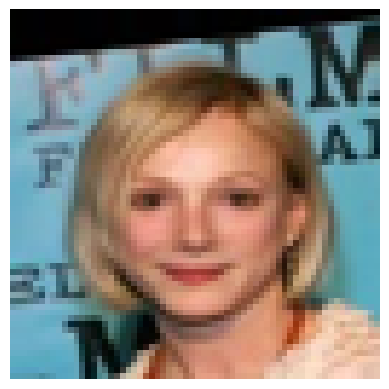

Accuracy: 1.0
Prediction: face | True label: face


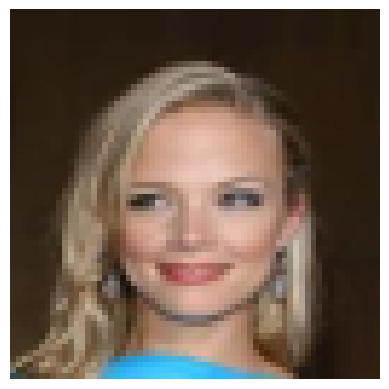

Accuracy: 1.0
Prediction: face | True label: face


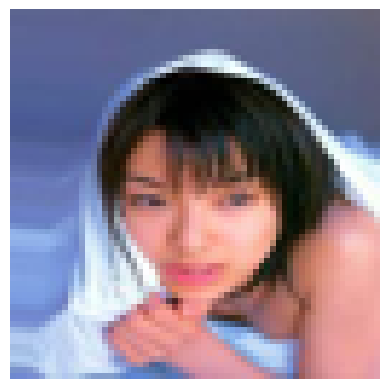

Accuracy: 1.0
Prediction: face | True label: face


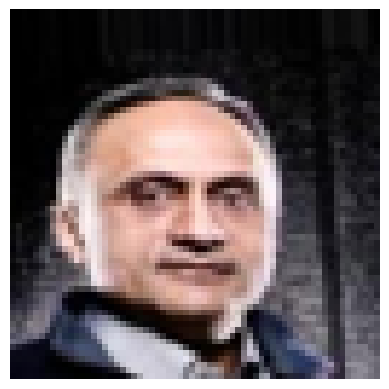

Accuracy: 1.0
Prediction: face | True label: face


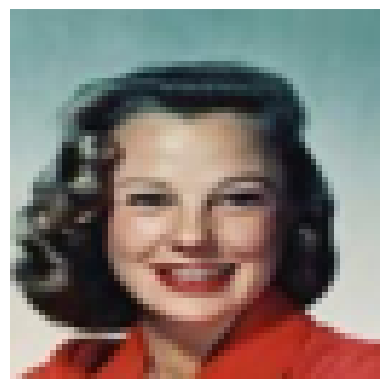

Accuracy: 1.0
Prediction: face | True label: face


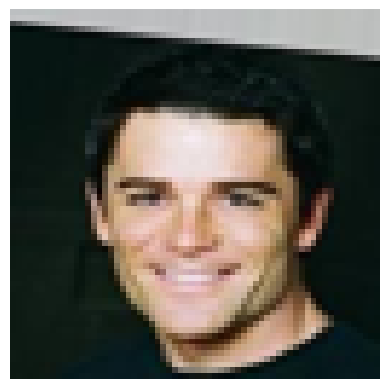

Accuracy: 1.0
Prediction: face | True label: face


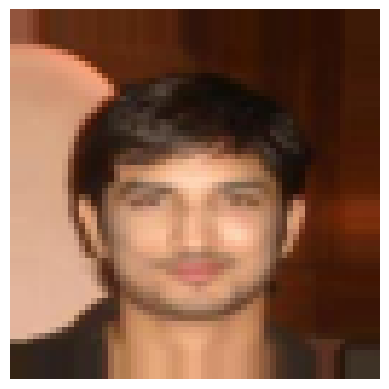

Accuracy: 1.0
Prediction: face | True label: face


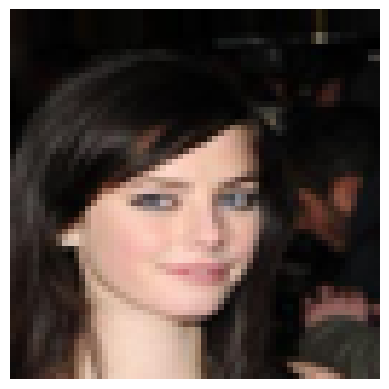

Accuracy: 1.0
Prediction: face | True label: face


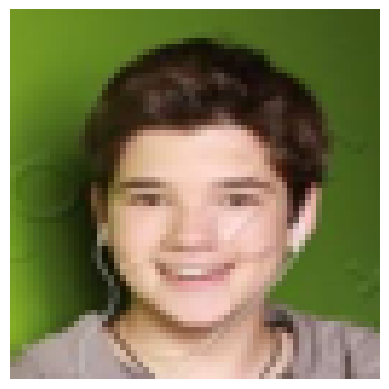

Accuracy: 1.0
Prediction: face | True label: face


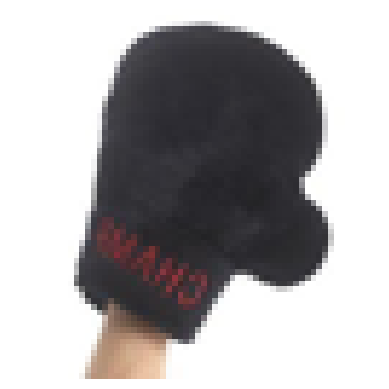

Accuracy: 1.0
Prediction: no_face | True label: no_face


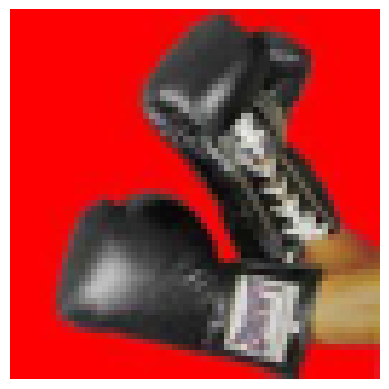

Accuracy: 0.0
Prediction: face | True label: no_face


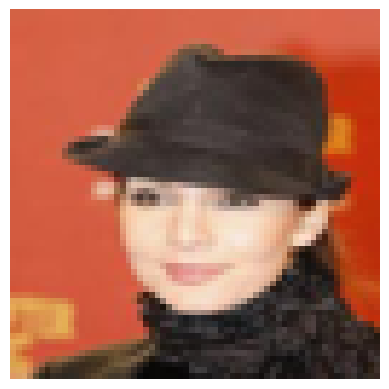

Accuracy: 1.0
Prediction: face | True label: face


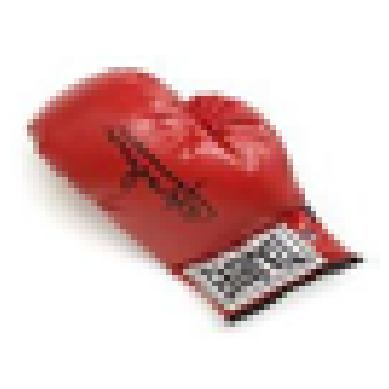

Accuracy: 1.0
Prediction: no_face | True label: no_face


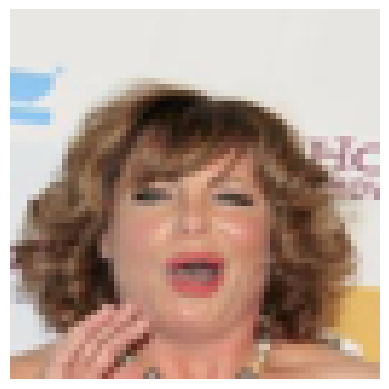

Accuracy: 1.0
Prediction: face | True label: face


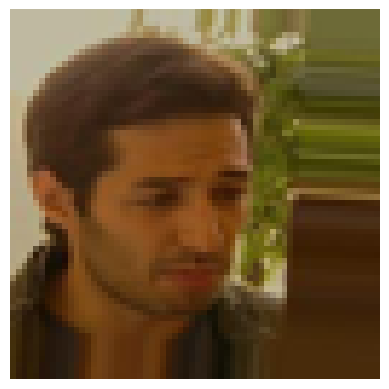

Accuracy: 1.0
Prediction: face | True label: face


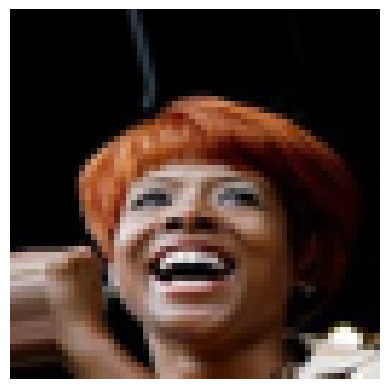

Accuracy: 1.0
Prediction: face | True label: face


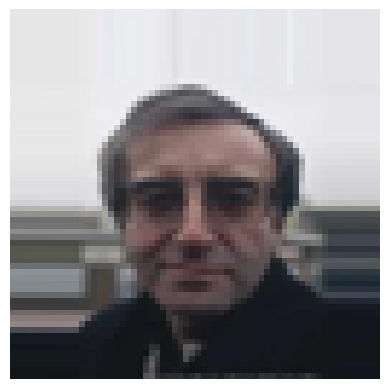

Accuracy: 1.0
Prediction: face | True label: face


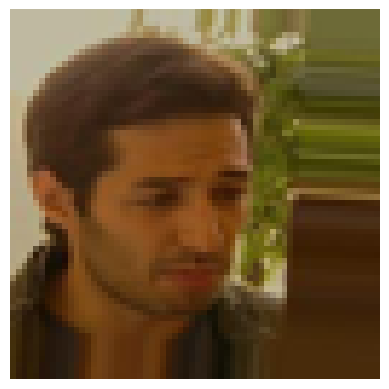

Accuracy: 1.0
Prediction: face | True label: face


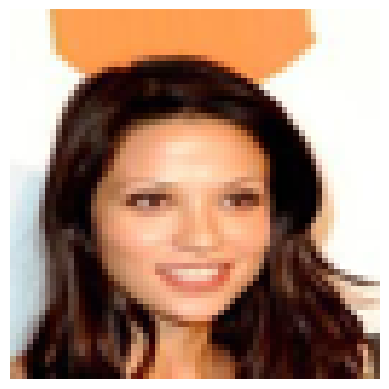

Accuracy: 1.0
Prediction: face | True label: face


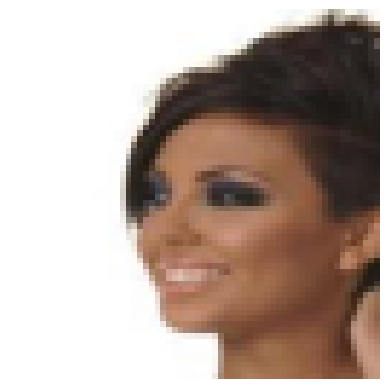

Accuracy: 0.0
Prediction: no_face | True label: face


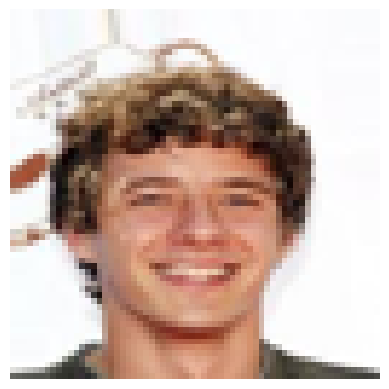

Accuracy: 1.0
Prediction: face | True label: face


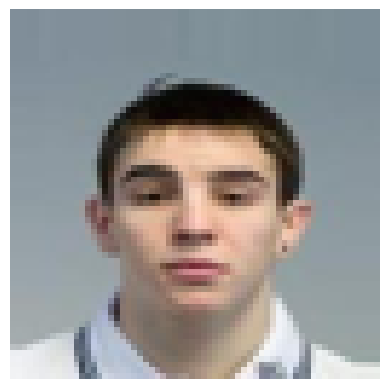

Accuracy: 1.0
Prediction: face | True label: face


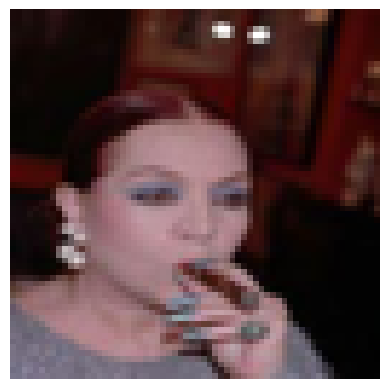

Accuracy: 1.0
Prediction: face | True label: face


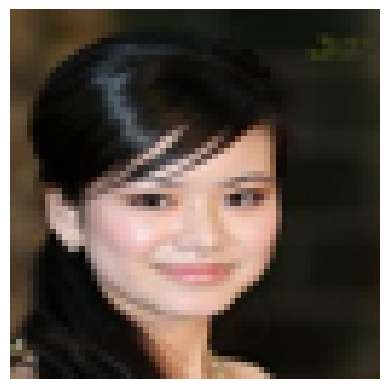

Accuracy: 1.0
Prediction: face | True label: face


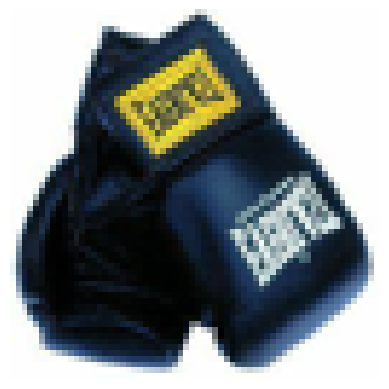

Accuracy: 1.0
Prediction: no_face | True label: no_face


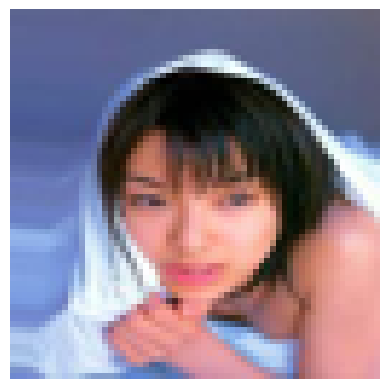

Accuracy: 1.0
Prediction: face | True label: face


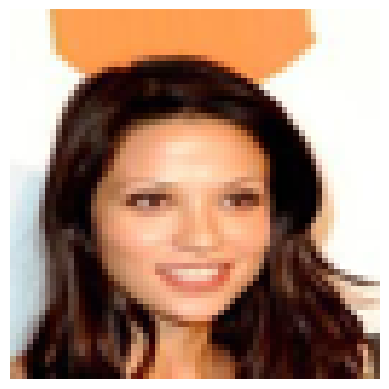

Accuracy: 1.0
Prediction: face | True label: face


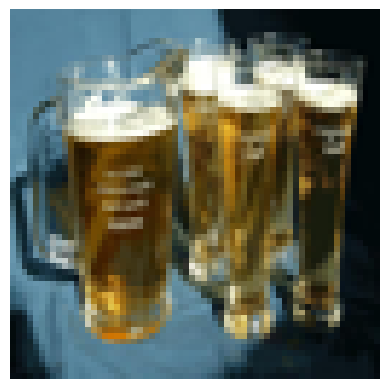

Accuracy: 1.0
Prediction: no_face | True label: no_face


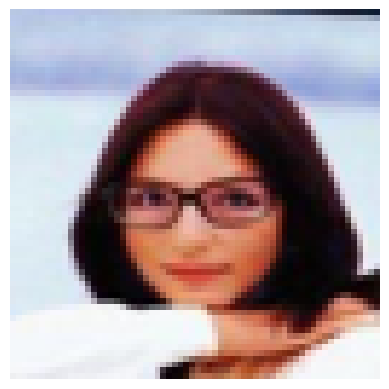

Accuracy: 1.0
Prediction: face | True label: face


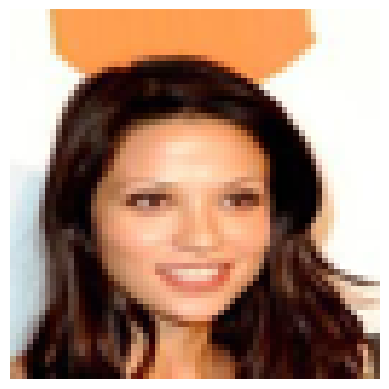

Accuracy: 1.0
Prediction: face | True label: face


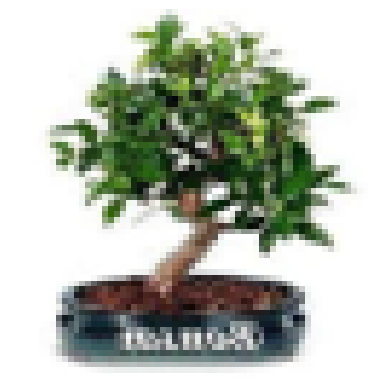

Accuracy: 1.0
Prediction: no_face | True label: no_face


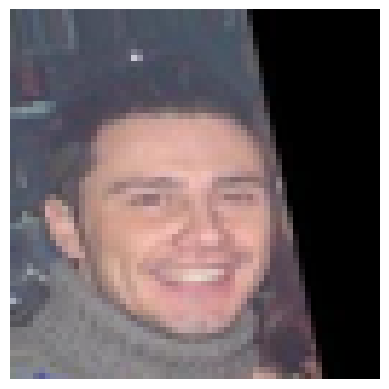

Accuracy: 1.0
Prediction: face | True label: face


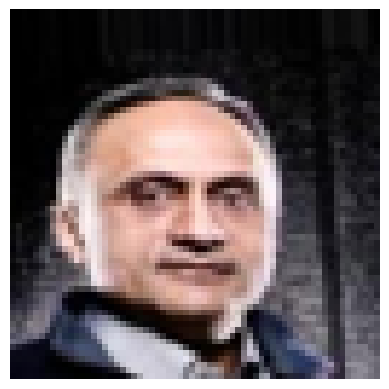

Accuracy: 1.0
Prediction: face | True label: face


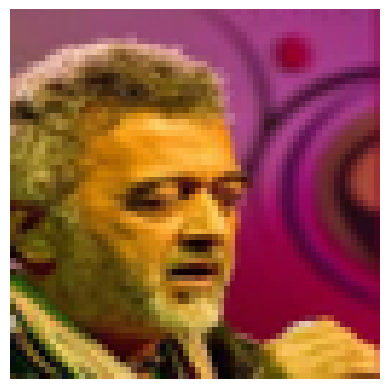

Accuracy: 1.0
Prediction: face | True label: face


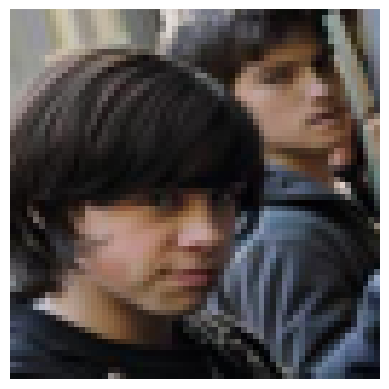

Accuracy: 1.0
Prediction: face | True label: face


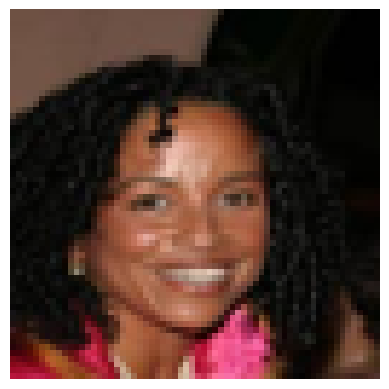

Accuracy: 1.0
Prediction: face | True label: face


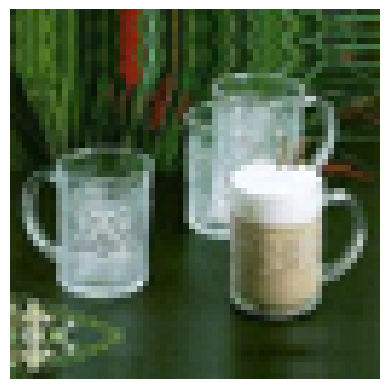

Accuracy: 1.0
Prediction: no_face | True label: no_face


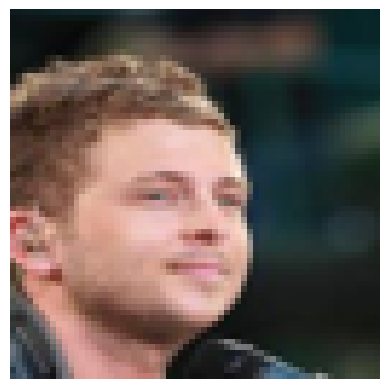

Accuracy: 1.0
Prediction: face | True label: face


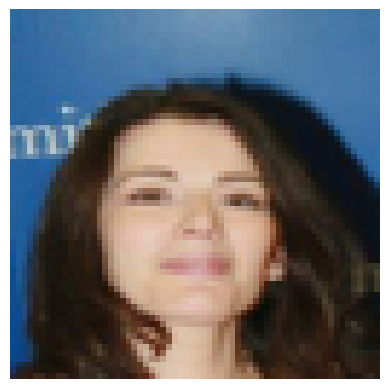

Accuracy: 1.0
Prediction: face | True label: face


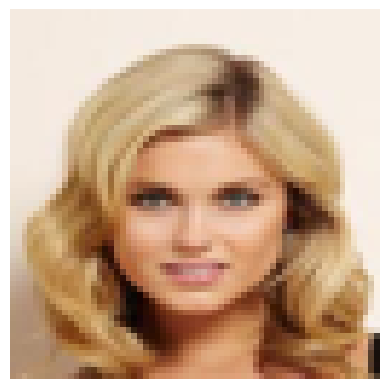

Accuracy: 1.0
Prediction: face | True label: face


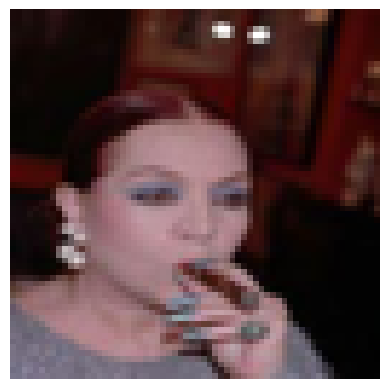

Accuracy: 1.0
Prediction: face | True label: face


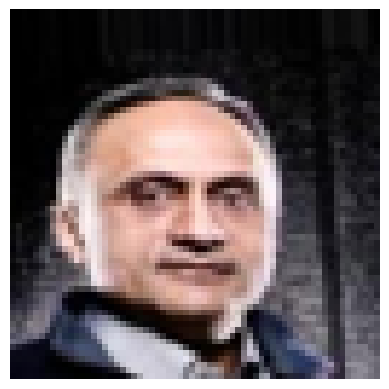

Accuracy: 1.0
Prediction: face | True label: face


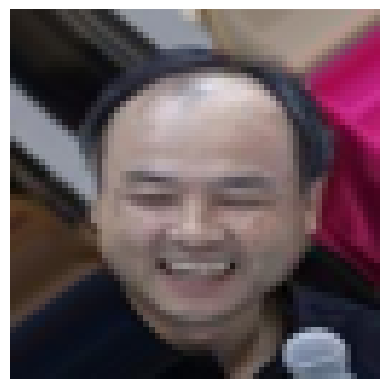

Accuracy: 1.0
Prediction: face | True label: face


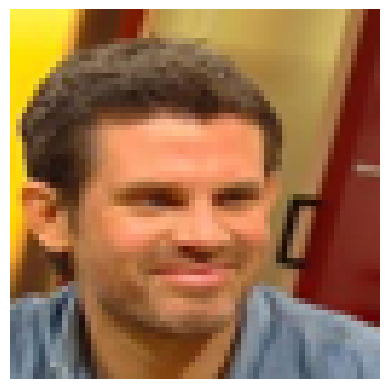

Accuracy: 1.0
Prediction: face | True label: face


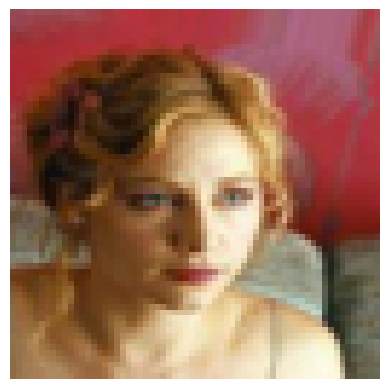

Accuracy: 1.0
Prediction: face | True label: face


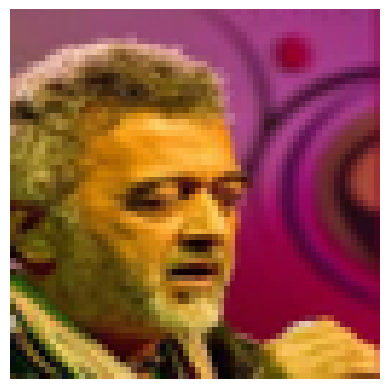

Accuracy: 1.0
Prediction: face | True label: face


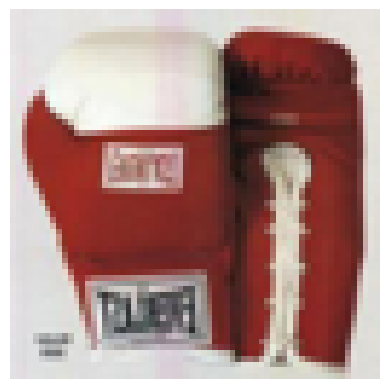

Accuracy: 1.0
Prediction: no_face | True label: no_face


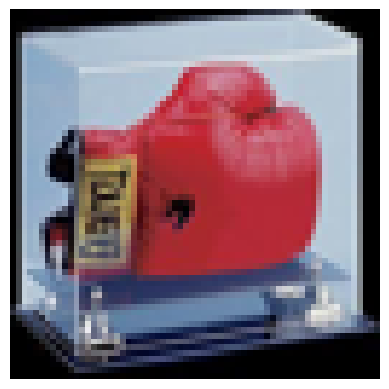

Accuracy: 0.0
Prediction: face | True label: no_face


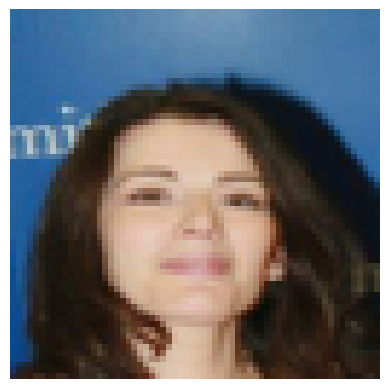

Accuracy: 1.0
Prediction: face | True label: face


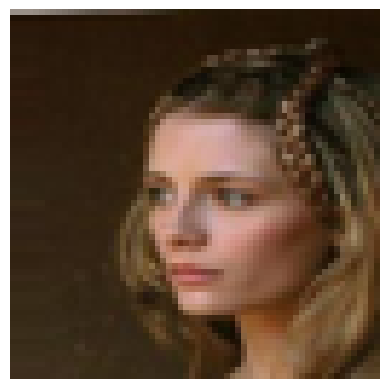

Accuracy: 1.0
Prediction: face | True label: face


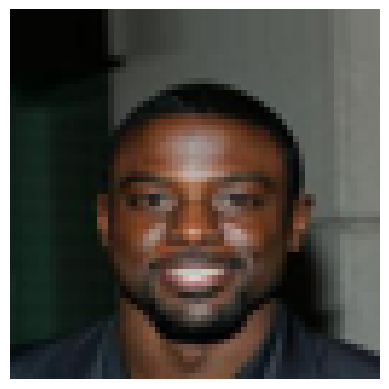

Accuracy: 1.0
Prediction: face | True label: face


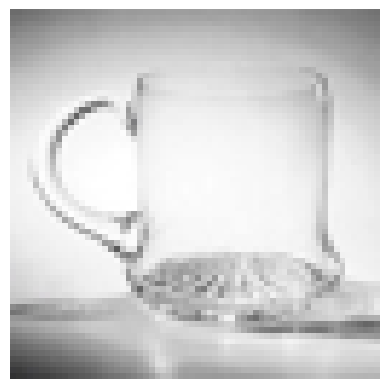

Accuracy: 1.0
Prediction: no_face | True label: no_face


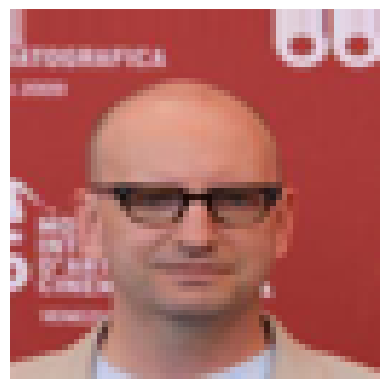

Accuracy: 1.0
Prediction: face | True label: face


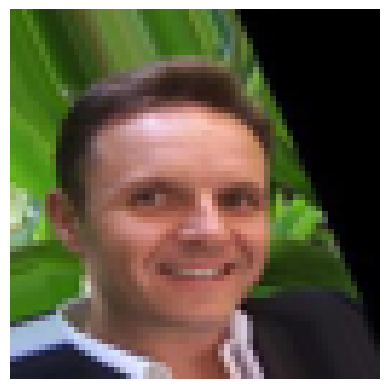

Accuracy: 1.0
Prediction: face | True label: face


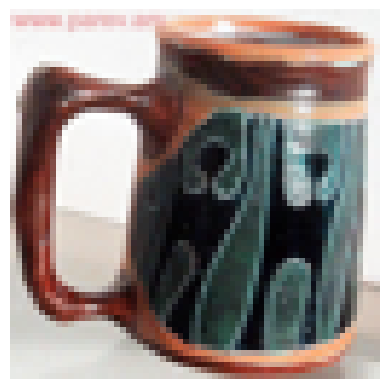

Accuracy: 1.0
Prediction: no_face | True label: no_face


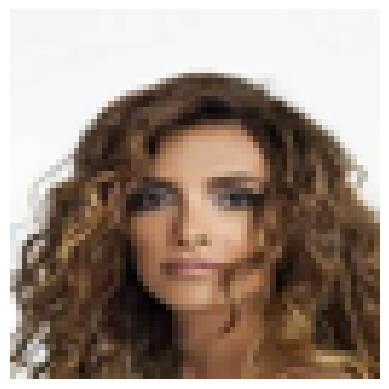

Accuracy: 1.0
Prediction: face | True label: face


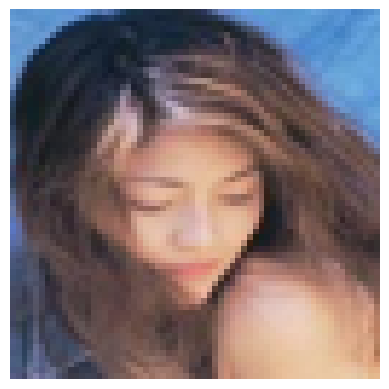

Accuracy: 1.0
Prediction: face | True label: face


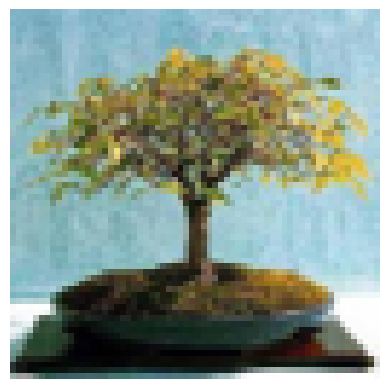

Accuracy: 1.0
Prediction: no_face | True label: no_face


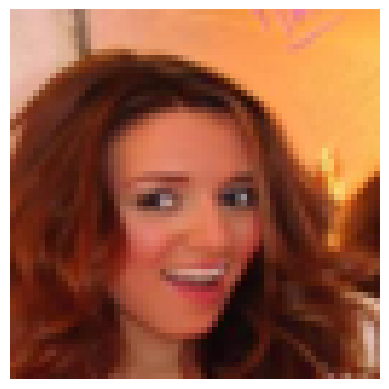

Accuracy: 1.0
Prediction: face | True label: face


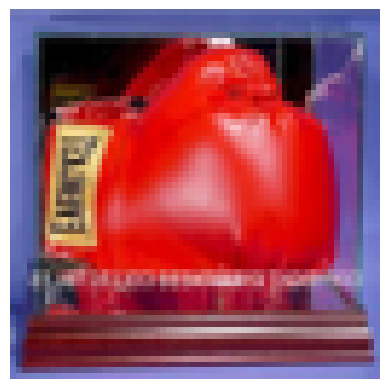

Accuracy: 0.0
Prediction: face | True label: no_face


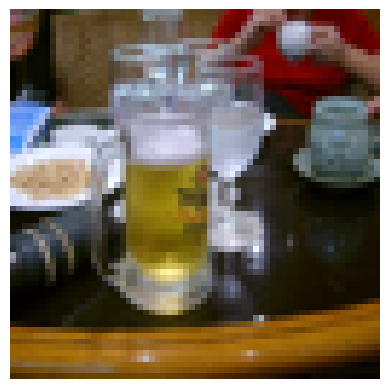

Accuracy: 1.0
Prediction: no_face | True label: no_face


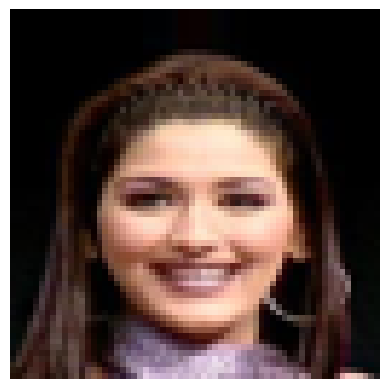

Accuracy: 1.0
Prediction: face | True label: face


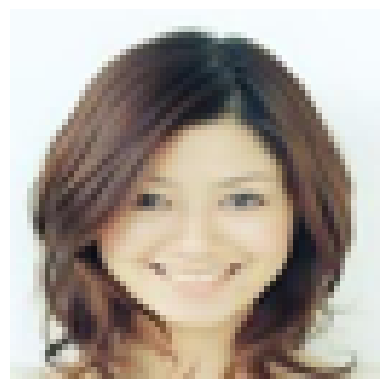

Accuracy: 1.0
Prediction: face | True label: face


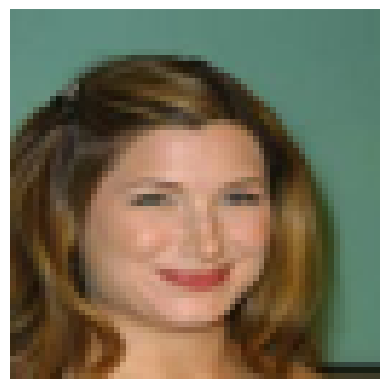

Accuracy: 1.0
Prediction: face | True label: face


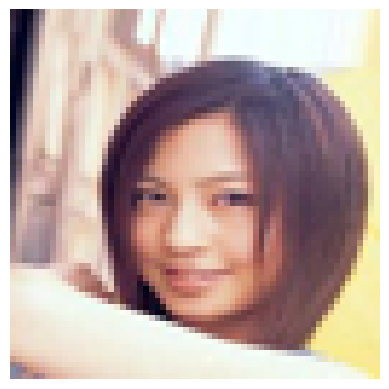

Accuracy: 1.0
Prediction: face | True label: face


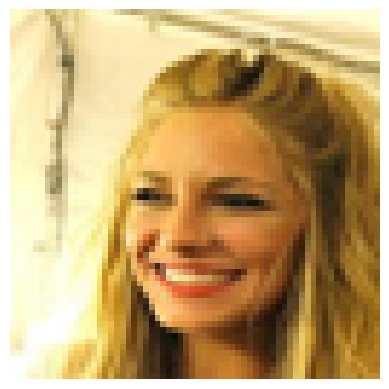

Accuracy: 1.0
Prediction: face | True label: face


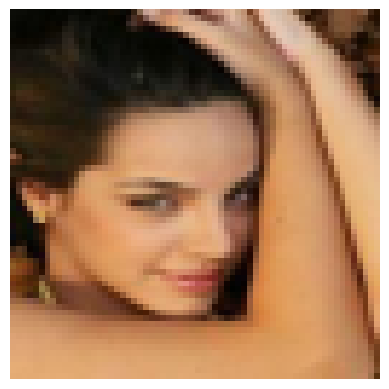

Accuracy: 1.0
Prediction: face | True label: face


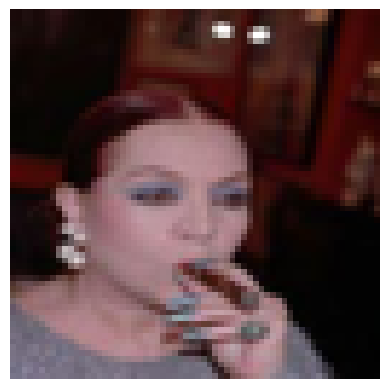

Accuracy: 1.0
Prediction: face | True label: face


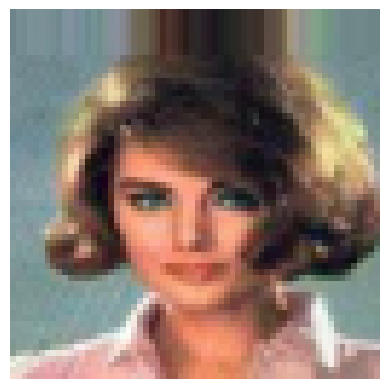

Accuracy: 1.0
Prediction: face | True label: face


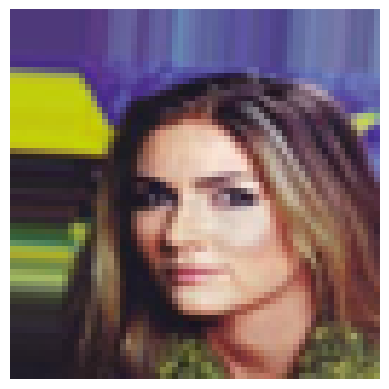

Accuracy: 1.0
Prediction: face | True label: face


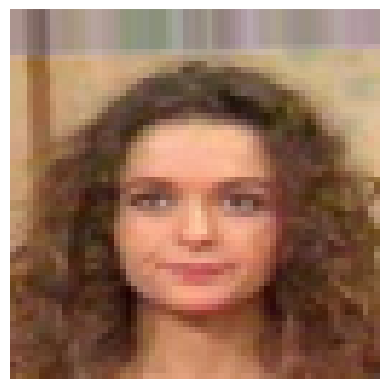

Accuracy: 1.0
Prediction: face | True label: face


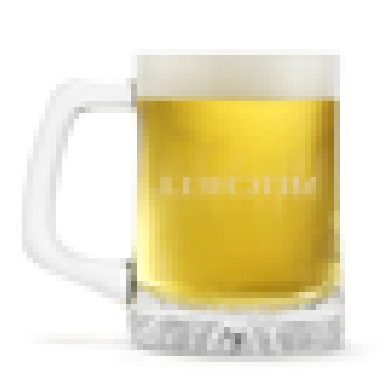

Accuracy: 1.0
Prediction: no_face | True label: no_face


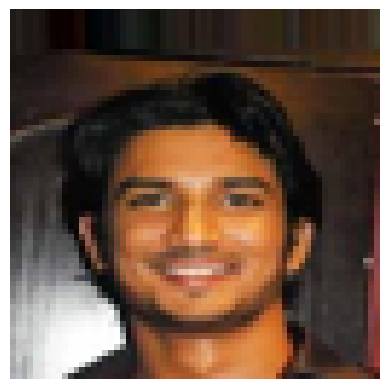

Accuracy: 1.0
Prediction: face | True label: face


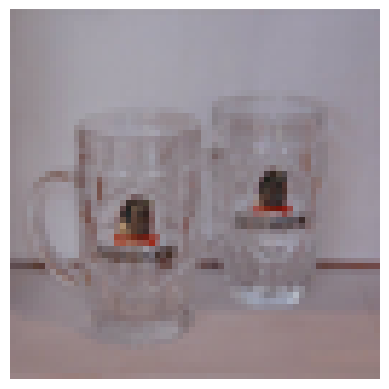

Accuracy: 1.0
Prediction: no_face | True label: no_face


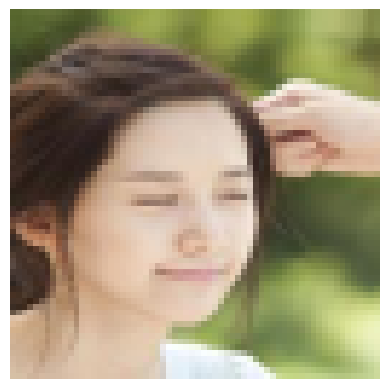

Accuracy: 0.0
Prediction: no_face | True label: face


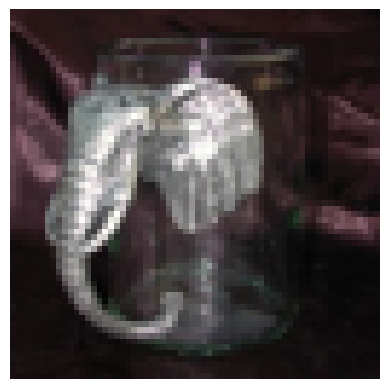

Accuracy: 1.0
Prediction: no_face | True label: no_face


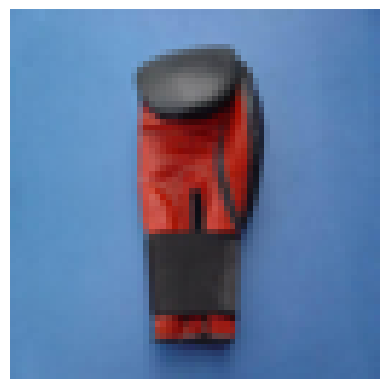

Accuracy: 1.0
Prediction: no_face | True label: no_face


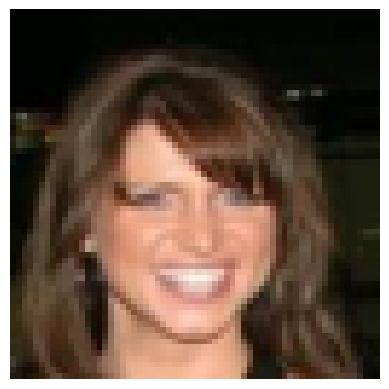

Accuracy: 1.0
Prediction: face | True label: face


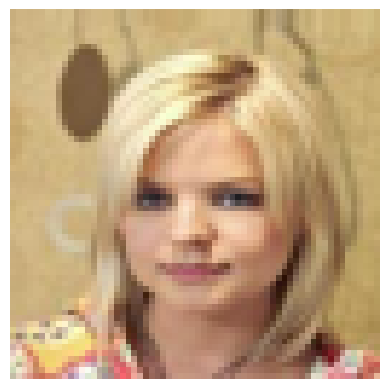

Accuracy: 1.0
Prediction: face | True label: face


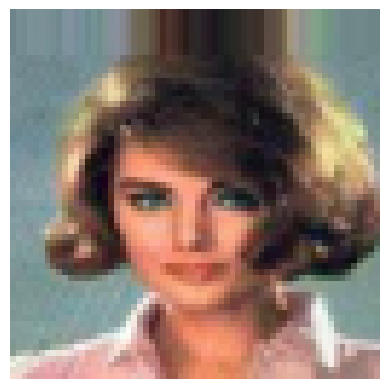

Accuracy: 1.0
Prediction: face | True label: face


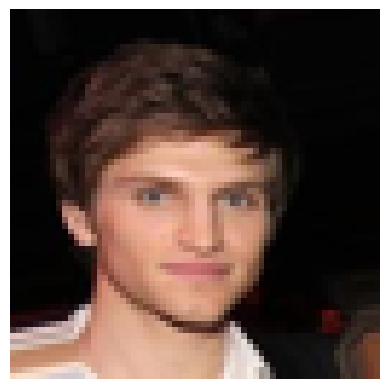

Accuracy: 1.0
Prediction: face | True label: face


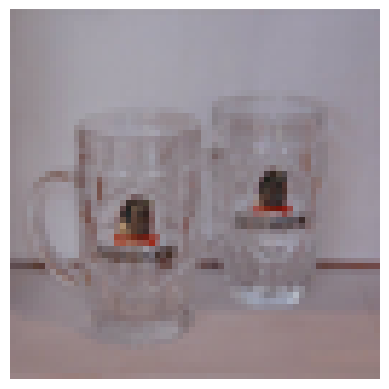

Accuracy: 1.0
Prediction: no_face | True label: no_face


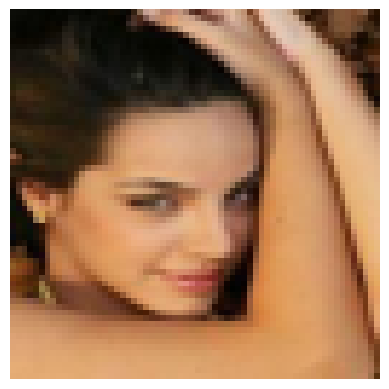

Accuracy: 1.0
Prediction: face | True label: face


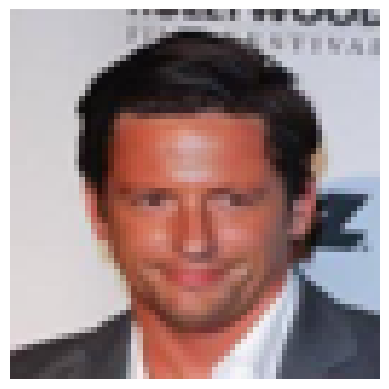

Accuracy: 1.0
Prediction: face | True label: face


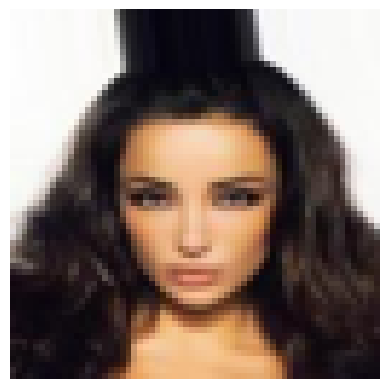

Accuracy: 1.0
Prediction: face | True label: face


In [ ]:
# Call the function
live_test_random_images(test_x, test_y, classes, parameters, delay=2)
